# Week 4 - Classification

In [1]:
#Special module written for this class
#This provides access to data and to helper functions from previous weeks
#Make sure you update it before starting this notebook
import lucem_illud #pip install -U git+git://github.com/UChicago-Computational-Content-Analysis/lucem_illud.git

#All these packages need to be installed from pip
#For ML
import sklearn
import sklearn.naive_bayes
import sklearn.tree
import sklearn.ensemble
import sklearn.neural_network
import sklearn.decomposition

import numpy as np #arrays
import matplotlib.pyplot as plt #Plots
import matplotlib.colors # For nice colours
import seaborn #Makes plots look nice, also heatmaps
import scipy as sp #for interp

#These are from the standard library
import collections
import os
import os.path
import random
import re
import glob
import pandas
import requests
import json
import math

#This 'magic' command makes the plots work better
#in the notebook, don't use it outside of a notebook.
#Also you can ignore the warning
%matplotlib inline

## <span style="color:red">*Exercise 1*</span>

<span style="color:red">Go back through all of the cells above and generate 10 distinct artificial datasets and classify them with all of the available methods. Add a cell immediately below and describe which classifier(s) worked best with which artificially constructed data source and why. Then go through all of the empirical datasets (i.e., Newsgroups, Senate Small, Senate Large, Email Spam) and classify them with all available methods. Add a second cell immediately below and describe which classifier(s) worked best with which data set and why.

<span style="color:red">***Stretch*** (but also required) Wander through the SKLearn documentation available [here](http://scikit-learn.org/stable/), particularly perusing the classifiers. In cells following, identify and implement a new classifier that we have not yet used (e.g., AdaBoost, CART) on one artificial dataset and one real dataset (used above). Then, in the next cell describe the classifier, detail how it compares with the approaches above, and why it performed better or worse than others.

### Artificial Datasets

#### Construct data source

In [2]:
# Generate 5 distinct datasets with noise1=0.2
noise1 = .2
# Random
dfTrain0, dfTest0 = lucem_illud.trainTestSplit(lucem_illud.random())
# andSplit
dfTrain1, dfTest1 = lucem_illud.trainTestSplit(lucem_illud.andSplit(noise1))
# xorSplit
dfTrain2, dfTest2 = lucem_illud.trainTestSplit(lucem_illud.xorSplit(noise1))
# targetSplit
dfTrain3, dfTest3 = lucem_illud.trainTestSplit(lucem_illud.targetSplit(noise1))
# multiBlobs
dfTrain4, dfTest4 = lucem_illud.trainTestSplit(lucem_illud.multiBlobs(noise1))

In [3]:
# Generate the other 5 distinct datasets with noise2 = 0.4
noise2 = .4
# Random
dfTrain5, dfTest5 = lucem_illud.trainTestSplit(lucem_illud.random())
# andSplit
dfTrain6, dfTest6 = lucem_illud.trainTestSplit(lucem_illud.andSplit(noise2))
# xorSplit
dfTrain7, dfTest7 = lucem_illud.trainTestSplit(lucem_illud.xorSplit(noise2))
# targetSplit
dfTrain8, dfTest8 = lucem_illud.trainTestSplit(lucem_illud.targetSplit(noise2))
# multiBlobs
dfTrain9, dfTest9 = lucem_illud.trainTestSplit(lucem_illud.multiBlobs(noise2))

In [4]:
# Funciton to apply a chosen method to classify the data and evaluate its performance 
def classify_data(method, dfTrain, dfTest):
    # Choose a method to fit the dataset
    if method == 'bayes':
        clf = sklearn.naive_bayes.GaussianNB()
    elif method == 'svm_linear':
        clf = sklearn.svm.SVC(kernel = 'linear', probability = True)
    elif method == 'svm_poly':
        clf = sklearn.svm.SVC(kernel = 'poly', degree = 3, probability = True)
    elif method == 'knn':
        clf = sklearn.neighbors.KNeighborsClassifier(5, weights='distance')
    elif method == 'classical_reg':
        clf = sklearn.linear_model.LogisticRegression()
    elif method == 'decision_tree':
        clf = sklearn.tree.DecisionTreeClassifier()
    elif method == 'random_forest':
        clf = sklearn.ensemble.RandomForestClassifier()
    elif method == 'neural_network':
        clf = sklearn.neural_network.MLPClassifier()
    elif method == 'boosting':
        clf = sklearn.ensemble.GradientBoostingClassifier()
    
    clf.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
    
    # Evaluation
    eval_df = lucem_illud.evaluateClassifier(clf, dfTest)
    print(method, ' Evaluation:')
    print(eval_df)
    print(method, ' Confusion Matrix:')
    lucem_illud.plotConfusionMatrix(clf, dfTest)
    print(method, ' ROC:')
    lucem_illud.plotMultiROC(clf, dfTest)
    print(method, ' Regions:')
    lucem_illud.plotregions(clf, dfTrain)
    
    return eval_df

In [5]:
# Function to apply all methods to classify the dataset
def all_model_classify(dfTrain, dfTest):
    eval_bayes = classify_data('bayes', dfTrain, dfTest)
    eval_svm_linear = classify_data('svm_linear', dfTrain, dfTest)
    eval_svm_poly = classify_data('svm_poly', dfTrain, dfTest)
    eval_knn = classify_data('knn', dfTrain, dfTest)
    eval_classical_reg = classify_data('classical_reg', dfTrain, dfTest)
    eval_dt = classify_data('decision_tree', dfTrain, dfTest)
    eval_rf = classify_data('random_forest', dfTrain, dfTest)
    eval_neural_network = classify_data('neural_network', dfTrain, dfTest)
    eval_boosting = classify_data('boosting', dfTrain, dfTest)
    
    eval_lst = []
    eval_lst.append(eval_bayes)
    eval_lst.append(eval_svm_linear)
    eval_lst.append(eval_svm_poly)
    eval_lst.append(eval_knn)
    eval_lst.append(eval_classical_reg)
    eval_lst.append(eval_dt)
    eval_lst.append(eval_rf)
    eval_lst.append(eval_neural_network)
    eval_lst.append(eval_boosting)
    
    return eval_lst

#### (1) Random

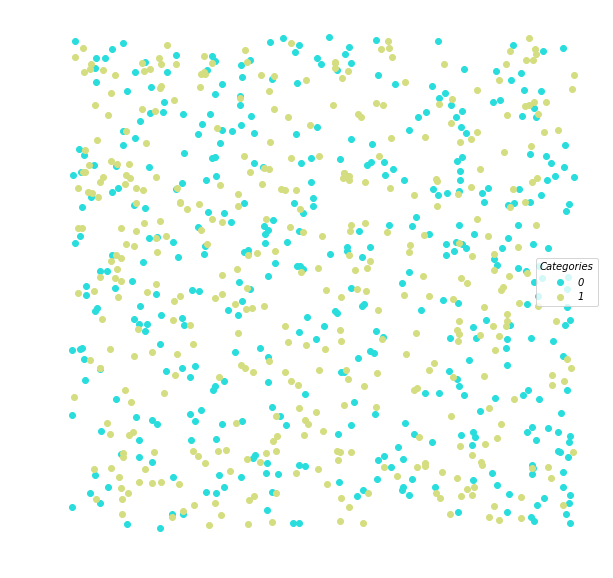

In [6]:
lucem_illud.plotter(dfTrain0)

bayes  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.472431           0.462135       0.525   0.444444  0.421053
1         0.472431           0.511905       0.525   0.500000  0.523810
bayes  Confusion Matrix:


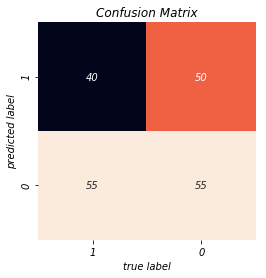

bayes  ROC:


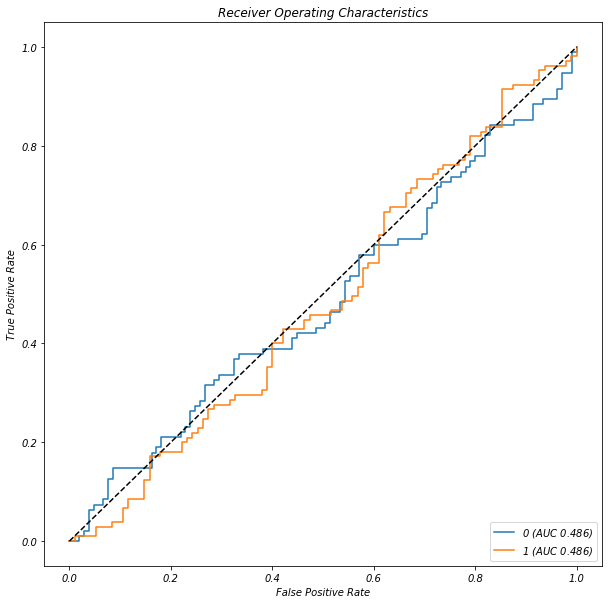

bayes  Regions:


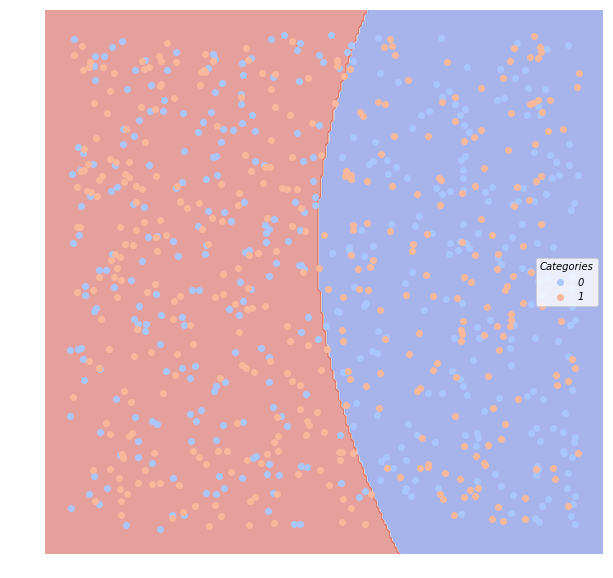

svm_linear  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.448622           0.452285        0.55   0.421053  0.421053
1         0.448622           0.501757        0.55   0.476190  0.476190
svm_linear  Confusion Matrix:


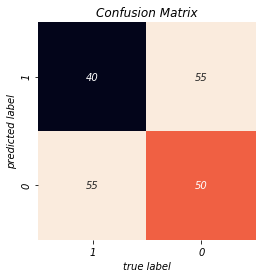

svm_linear  ROC:


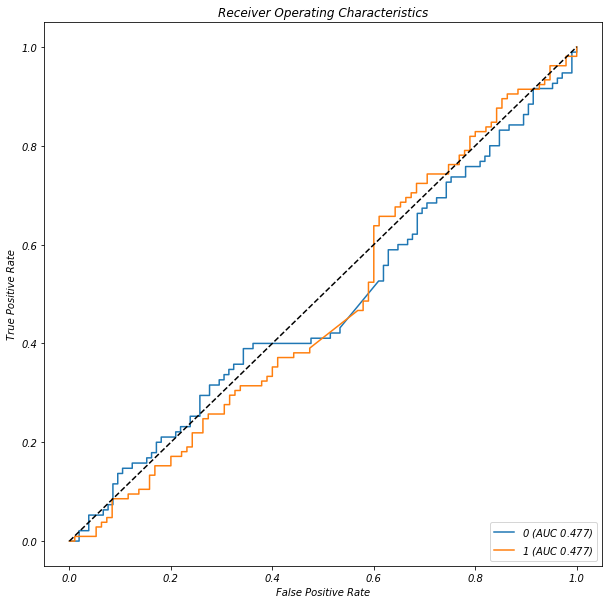

svm_linear  Regions:


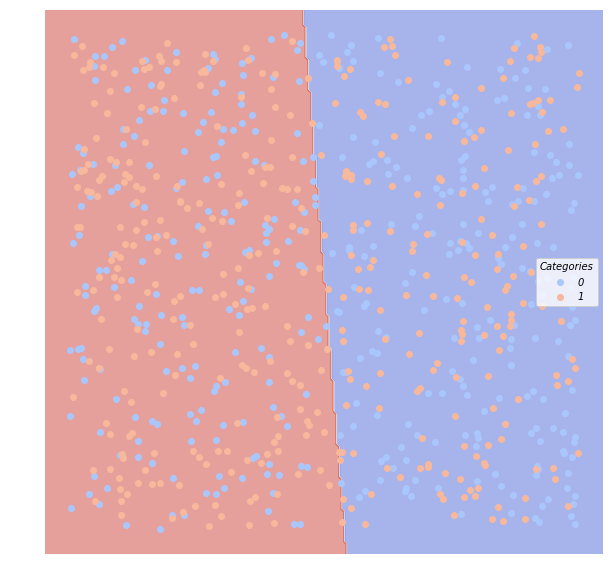

svm_poly  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.494486           0.472282       0.505   0.469388  0.484211
1         0.494486           0.522278       0.505   0.519608  0.504762
svm_poly  Confusion Matrix:


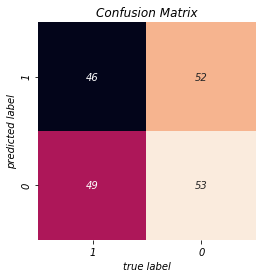

svm_poly  ROC:


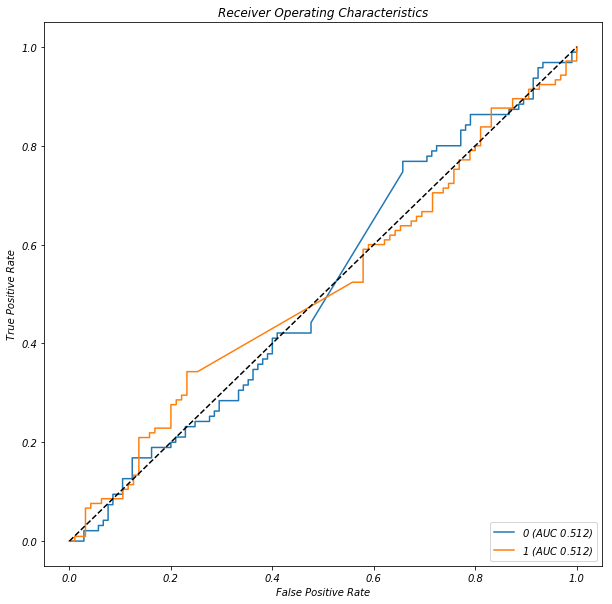

svm_poly  Regions:


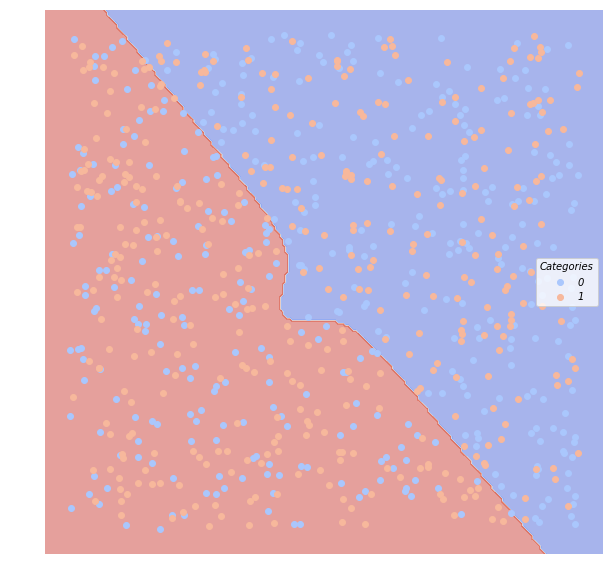

knn  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.567168           0.512875       0.435   0.537037  0.610526
1         0.567168           0.563147       0.435   0.597826  0.523810
knn  Confusion Matrix:


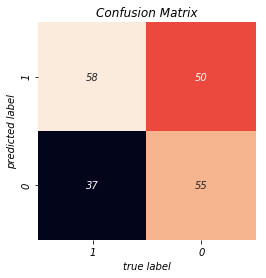

knn  ROC:


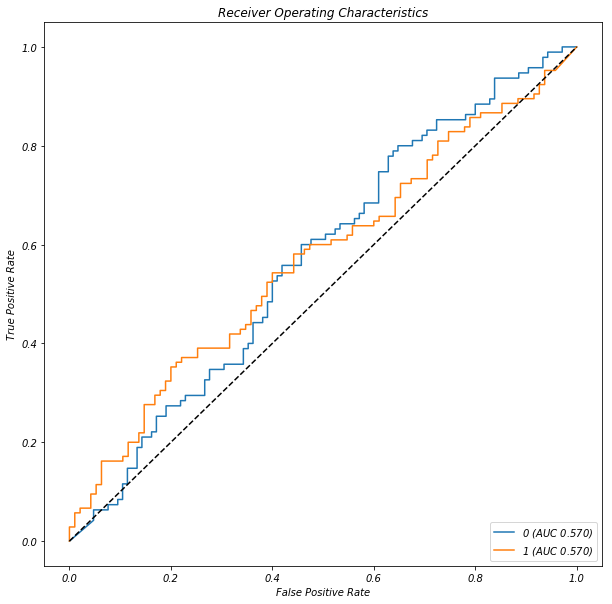

knn  Regions:


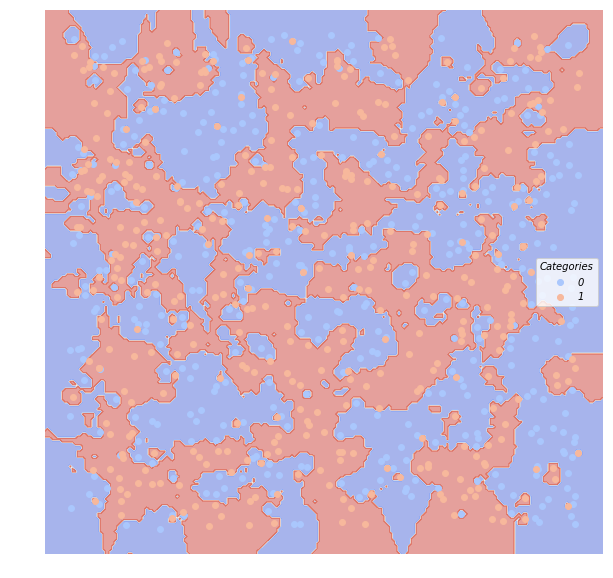

classical_reg  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.460652           0.456949        0.54   0.436893  0.473684
1         0.460652           0.506888        0.54   0.484536  0.447619
classical_reg  Confusion Matrix:


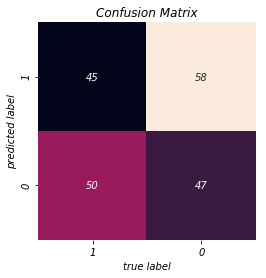

classical_reg  ROC:


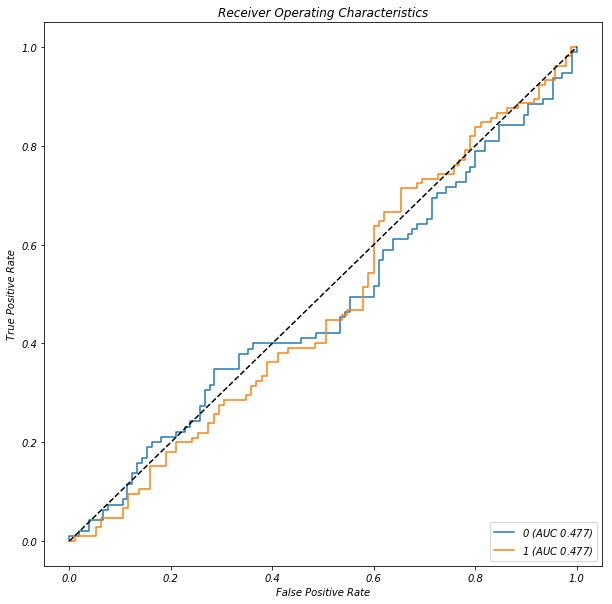

classical_reg  Regions:


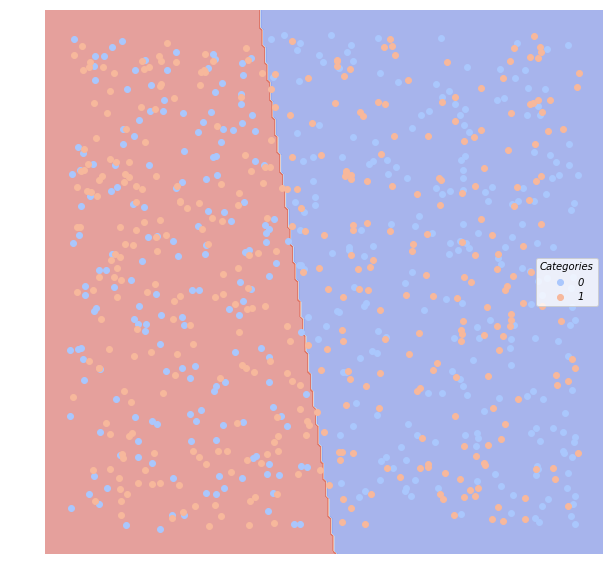

decision_tree  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.539599           0.496142       0.465   0.508475  0.631579
1         0.539599           0.546562       0.465   0.573171  0.447619
decision_tree  Confusion Matrix:


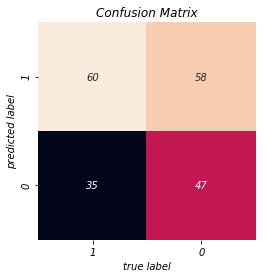

decision_tree  ROC:


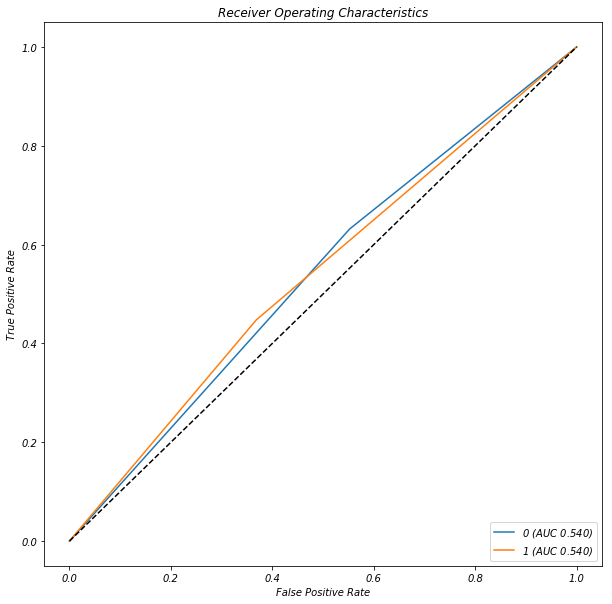

decision_tree  Regions:


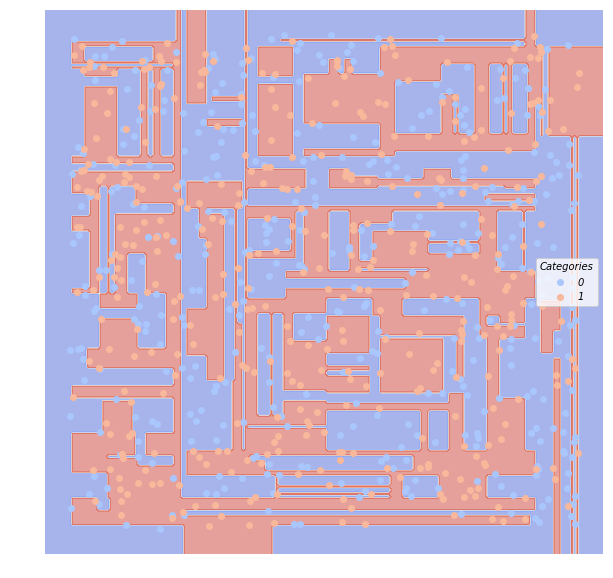

random_forest  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.542356           0.497849        0.46   0.513761  0.589474
1         0.542356           0.547993        0.46   0.571429  0.495238
random_forest  Confusion Matrix:


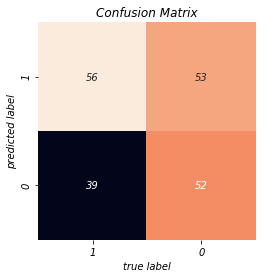

random_forest  ROC:


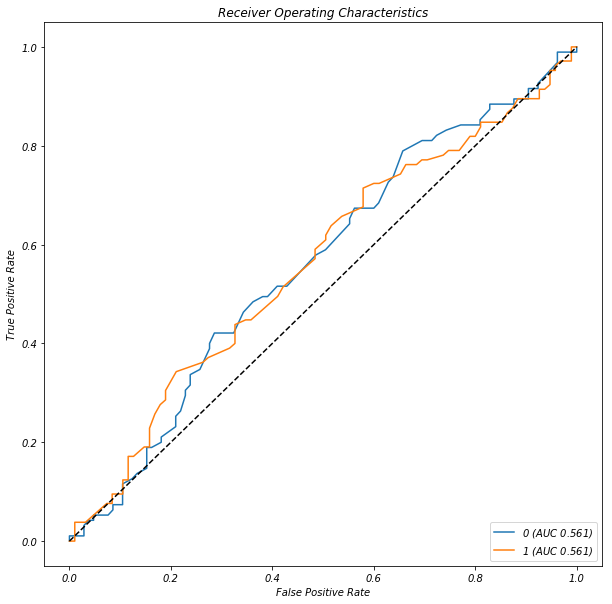

random_forest  Regions:


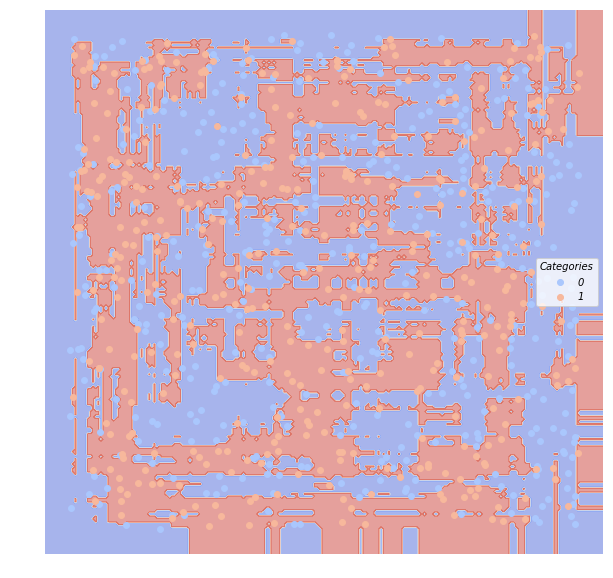

neural_network  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.486216           0.468359        0.51   0.458824  0.410526
1         0.486216           0.518282        0.51   0.513043  0.561905
neural_network  Confusion Matrix:


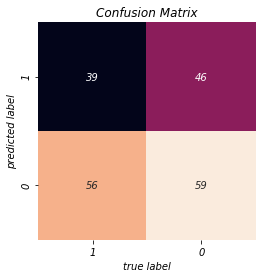

neural_network  ROC:


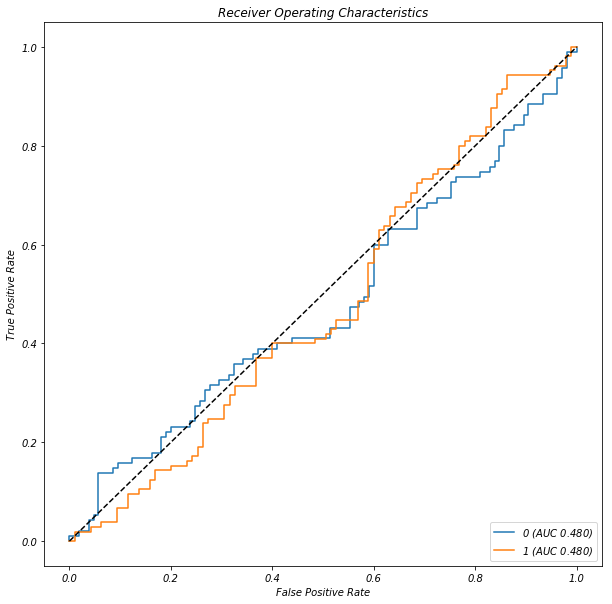

neural_network  Regions:


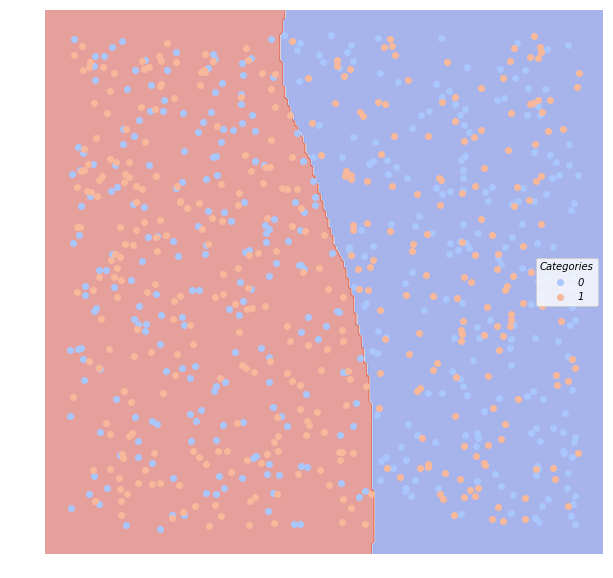

boosting  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.511779           0.481011        0.49   0.485981  0.547368
1         0.511779           0.531016        0.49   0.537634  0.476190
boosting  Confusion Matrix:


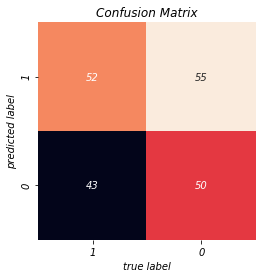

boosting  ROC:


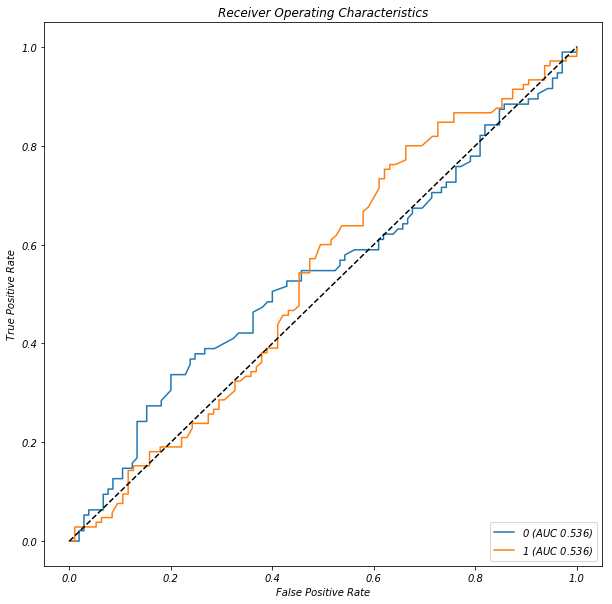

boosting  Regions:


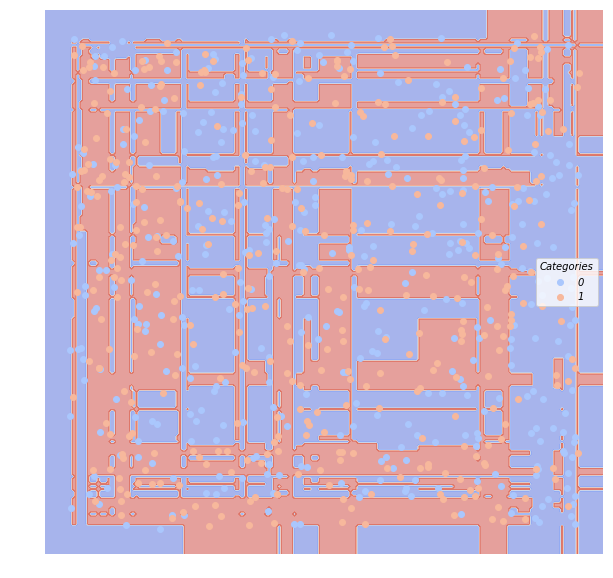

In [7]:
eval0 = all_model_classify(dfTrain0, dfTest0)

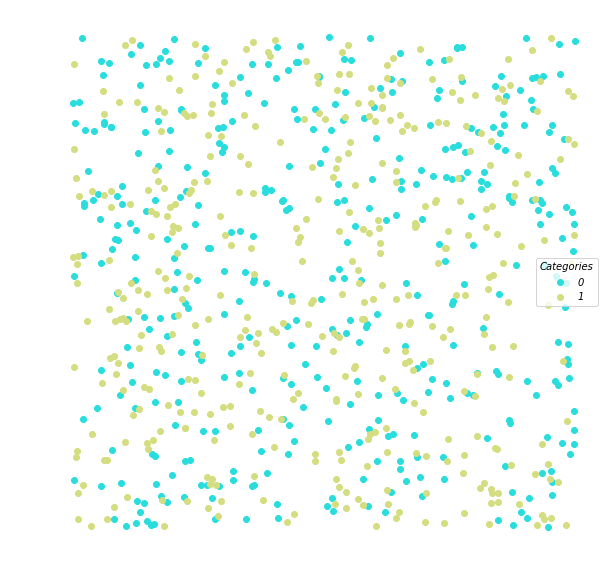

In [8]:
lucem_illud.plotter(dfTrain5)

bayes  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.548994           0.512131        0.45   0.537634  0.515464
1         0.548994           0.541649        0.45   0.560748  0.582524
bayes  Confusion Matrix:


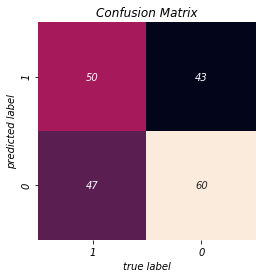

bayes  ROC:


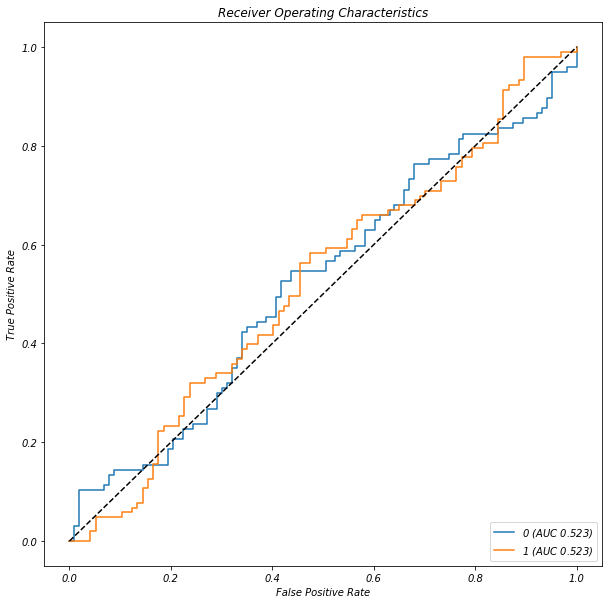

bayes  Regions:


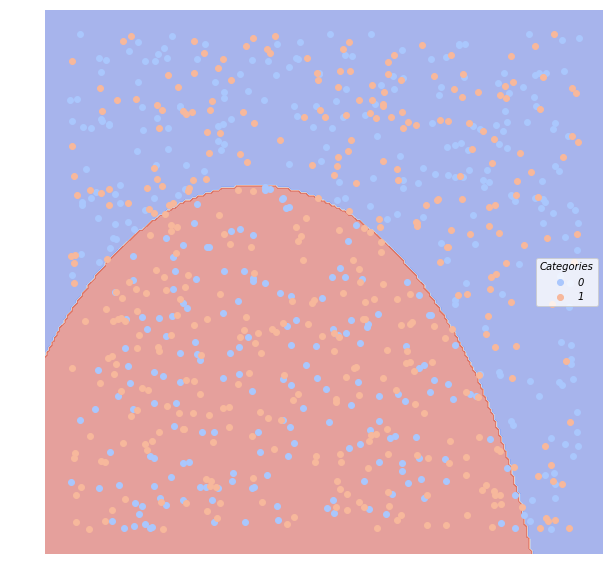

svm_linear  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.538985           0.506157        0.46   0.526882  0.505155
1         0.538985           0.535852        0.46   0.551402  0.572816
svm_linear  Confusion Matrix:


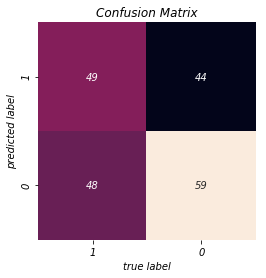

svm_linear  ROC:


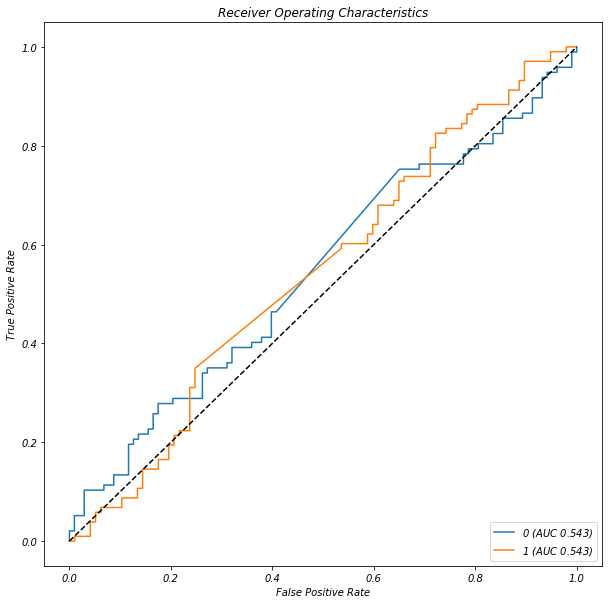

svm_linear  Regions:


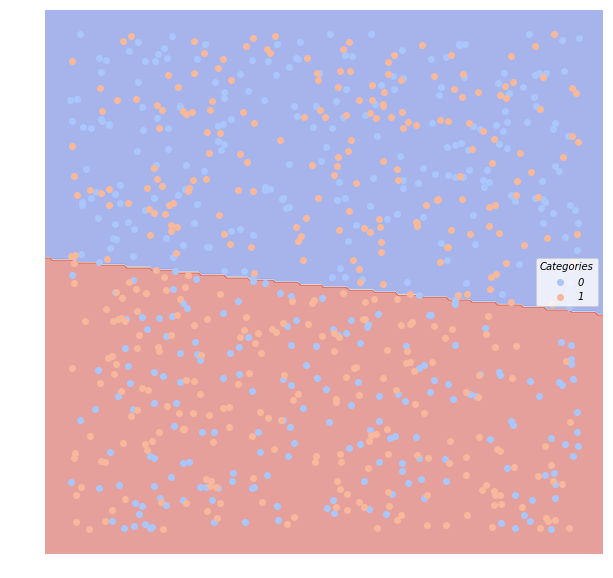

svm_poly  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.572916           0.526023        0.43   0.546218  0.670103
1         0.572916           0.557786        0.43   0.604938  0.475728
svm_poly  Confusion Matrix:


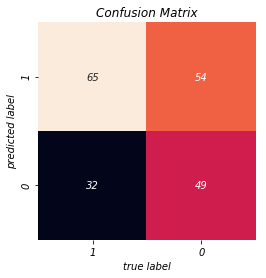

svm_poly  ROC:


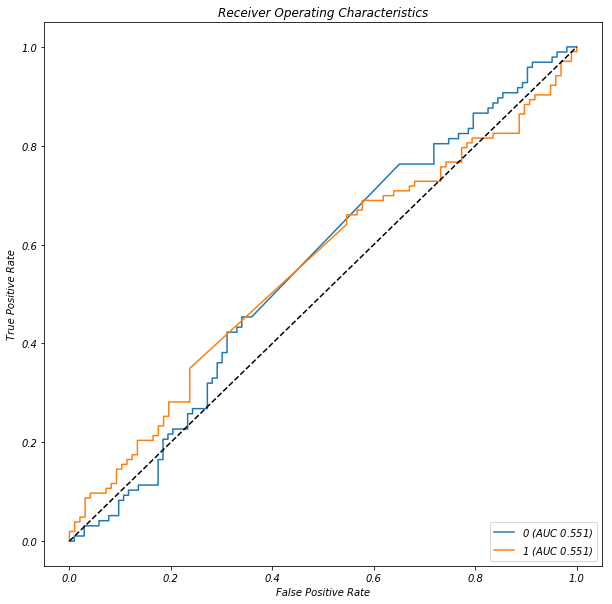

svm_poly  Regions:


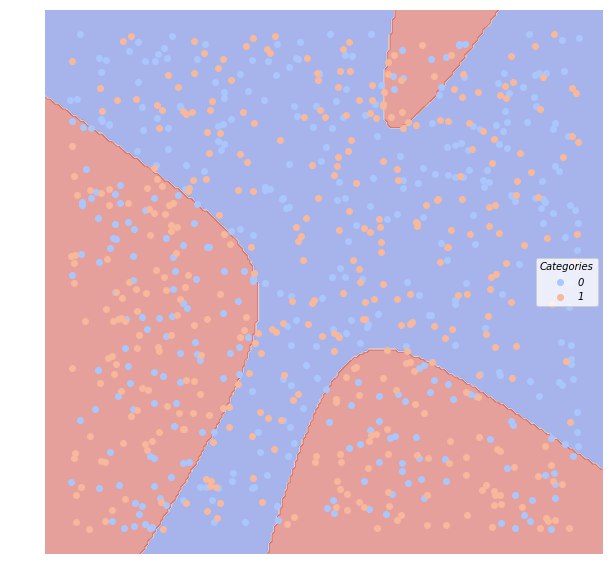

knn  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.536833           0.504647       0.465   0.517857  0.597938
1         0.536833           0.534894       0.465   0.556818  0.475728
knn  Confusion Matrix:


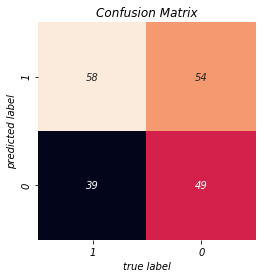

knn  ROC:


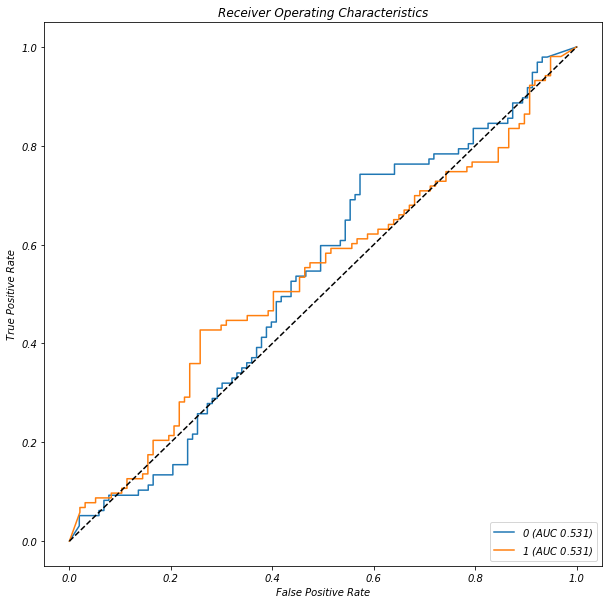

knn  Regions:


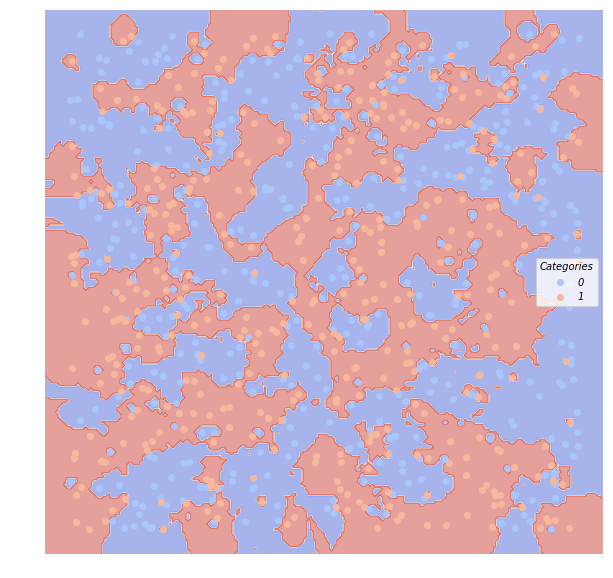

classical_reg  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.551396           0.513169        0.45   0.532110  0.597938
1         0.551396           0.543488        0.45   0.571429  0.504854
classical_reg  Confusion Matrix:


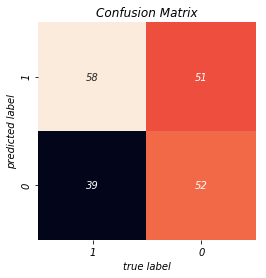

classical_reg  ROC:


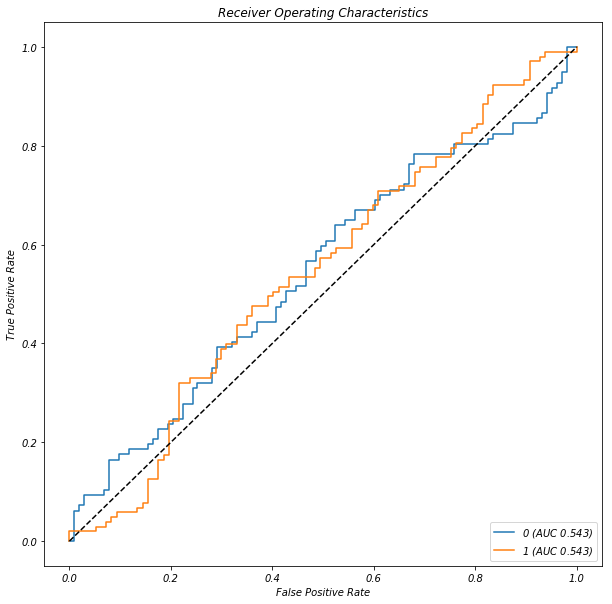

classical_reg  Regions:


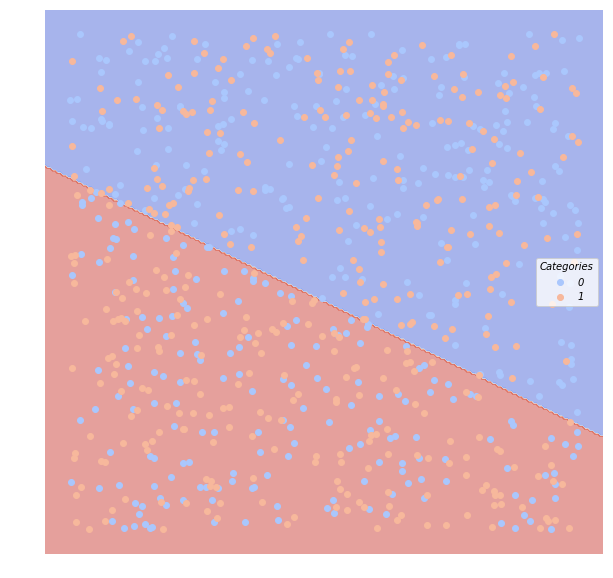

decision_tree  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.485287           0.477868       0.515   0.470588  0.494845
1         0.485287           0.507864       0.515   0.500000  0.475728
decision_tree  Confusion Matrix:


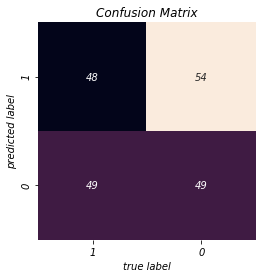

decision_tree  ROC:


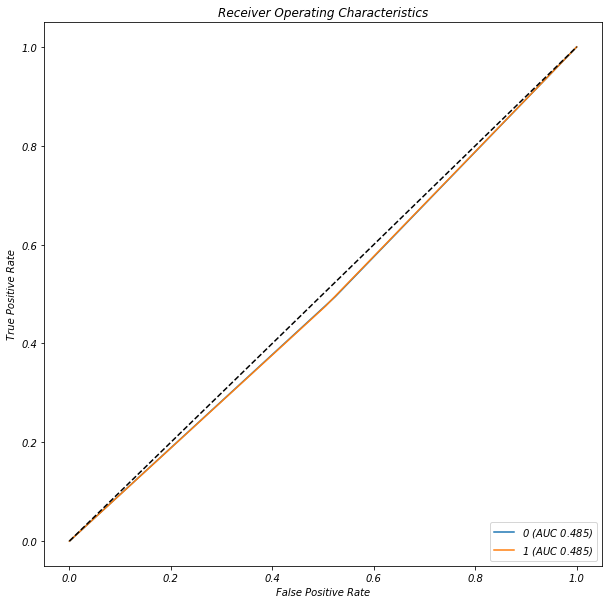

decision_tree  Regions:


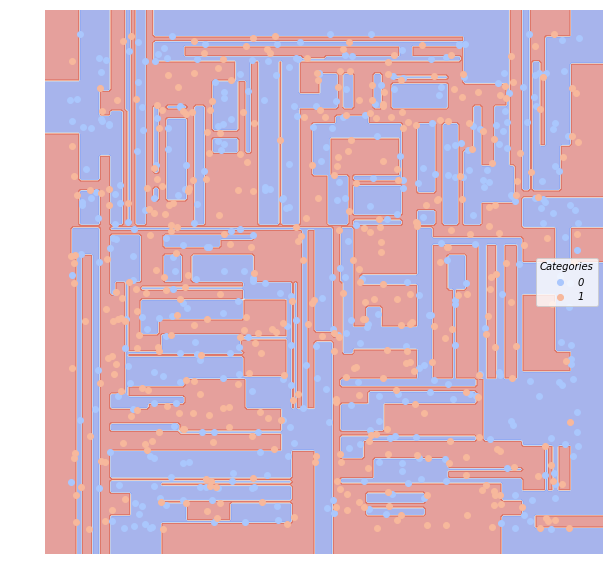

random_forest  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.486788           0.478560       0.515   0.473214  0.546392
1         0.486788           0.508592       0.515   0.500000  0.427184
random_forest  Confusion Matrix:


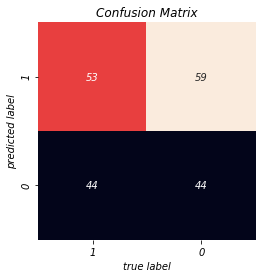

random_forest  ROC:


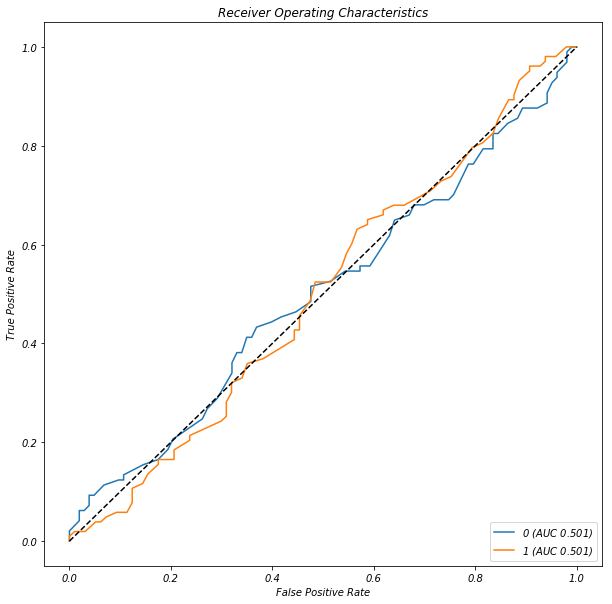

random_forest  Regions:


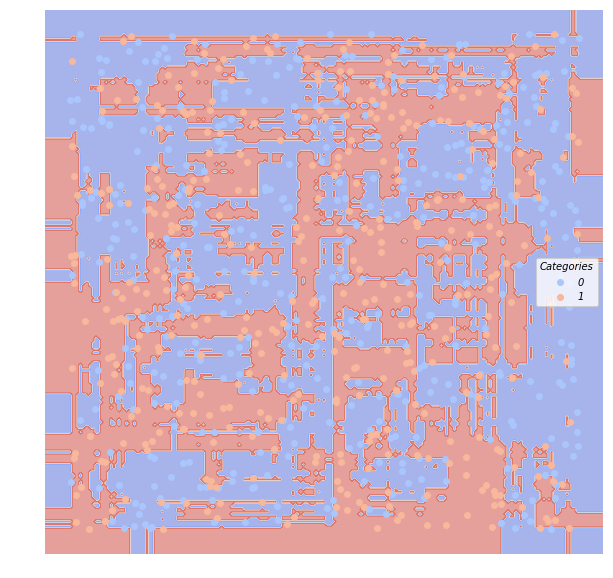

neural_network  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.532629           0.502604       0.465   0.523810  0.453608
1         0.532629           0.532189       0.465   0.543103  0.611650
neural_network  Confusion Matrix:


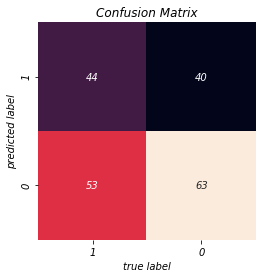

neural_network  ROC:


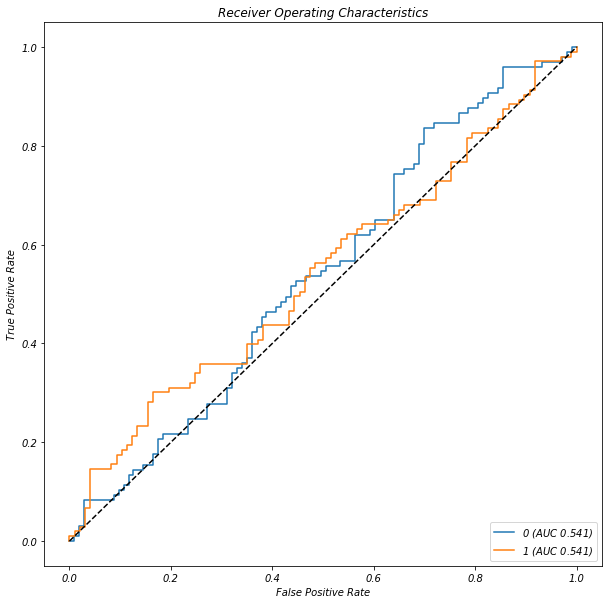

neural_network  Regions:


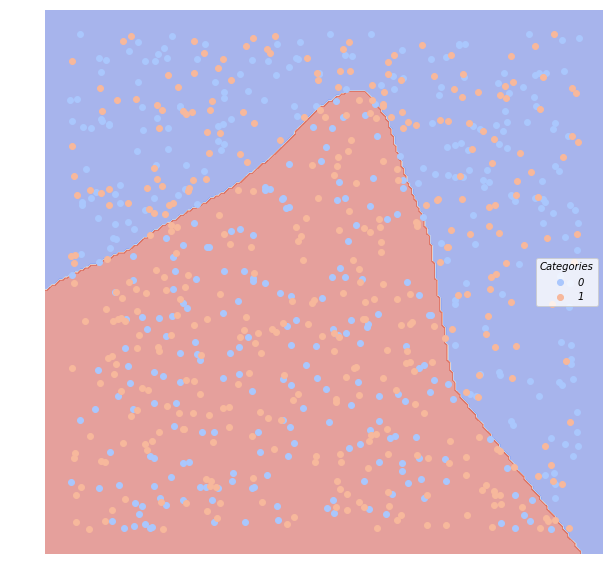

boosting  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.482885           0.476801       0.515   0.465116  0.412371
1         0.482885           0.506699       0.515   0.500000  0.553398
boosting  Confusion Matrix:


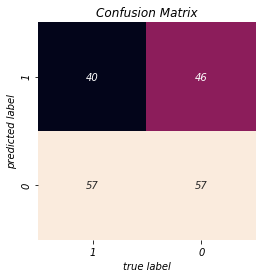

boosting  ROC:


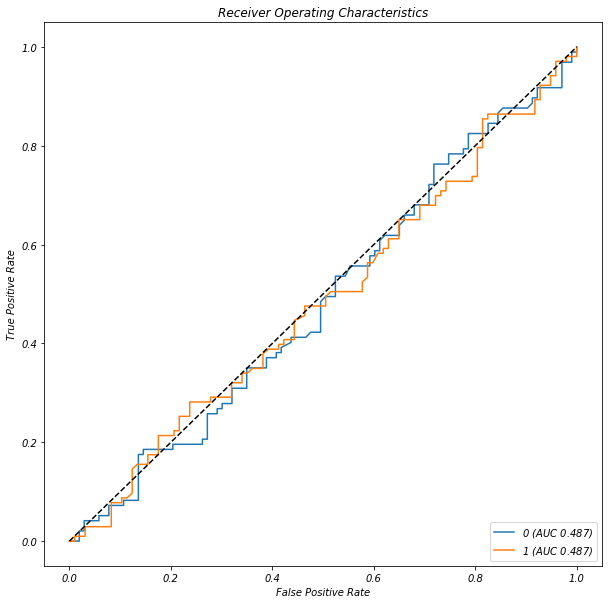

boosting  Regions:


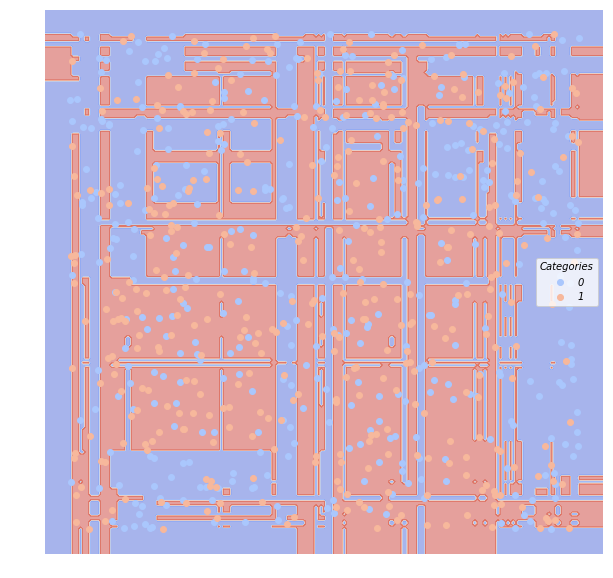

In [9]:
eval5 = all_model_classify(dfTrain5, dfTest5)

#### (2) andSplit

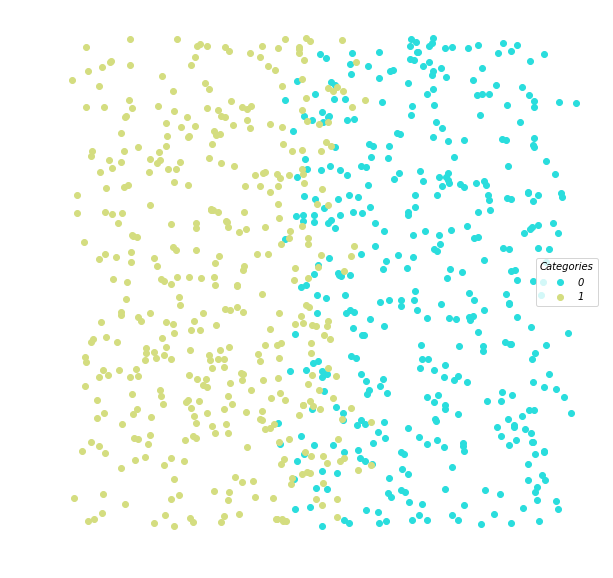

In [10]:
lucem_illud.plotter(dfTrain1)

bayes  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.904958           0.878032       0.095   0.914286  0.905660
1         0.904958           0.854071       0.095   0.894737  0.904255
bayes  Confusion Matrix:


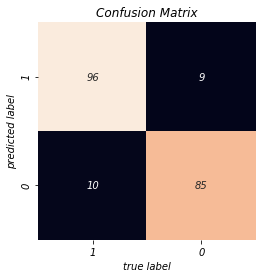

bayes  ROC:


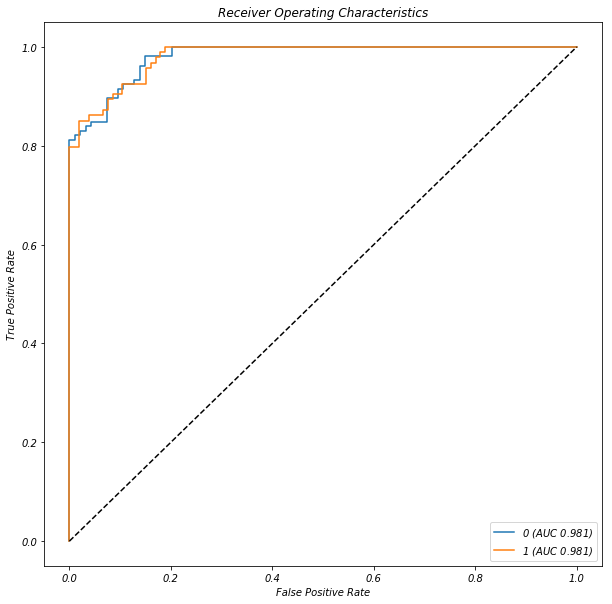

bayes  Regions:


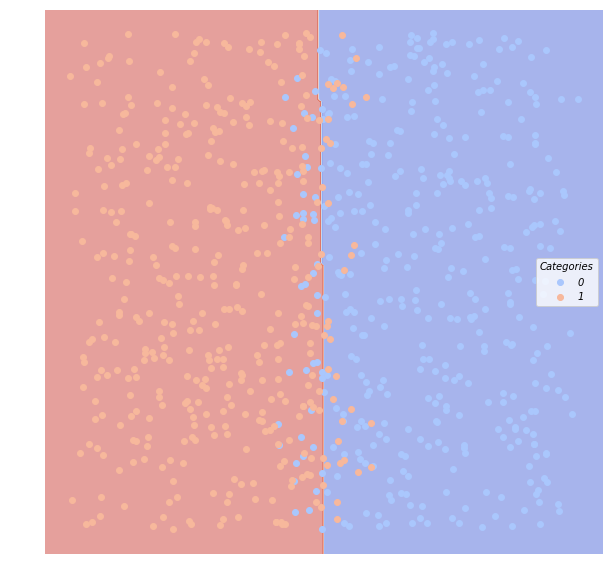

svm_linear  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.904958           0.878032       0.095   0.914286  0.905660
1         0.904958           0.854071       0.095   0.894737  0.904255
svm_linear  Confusion Matrix:


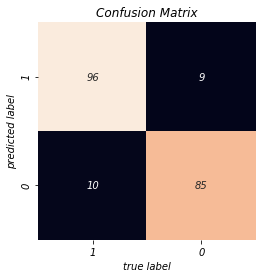

svm_linear  ROC:


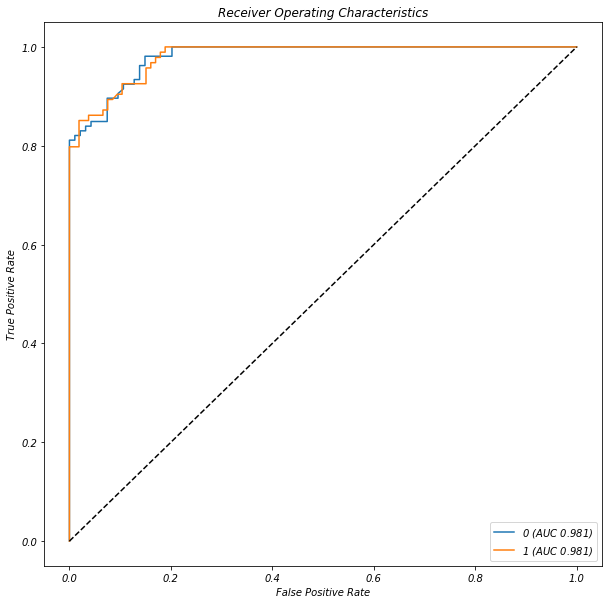

svm_linear  Regions:


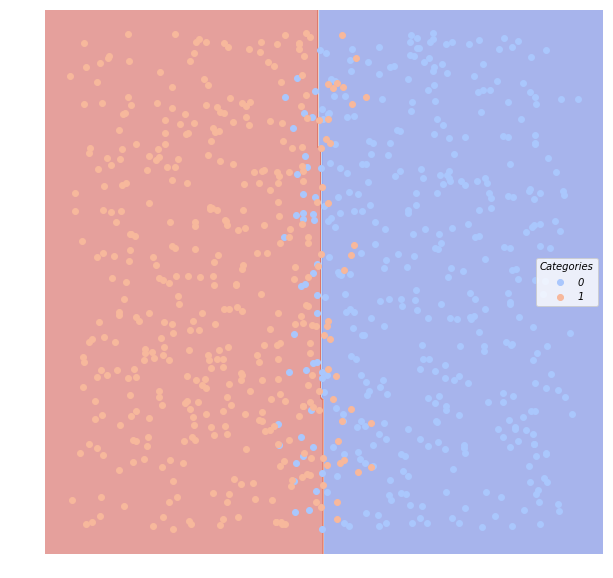

svm_poly  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.906162           0.885332       0.095   0.930693  0.886792
1         0.906162           0.848346       0.095   0.878788  0.925532
svm_poly  Confusion Matrix:


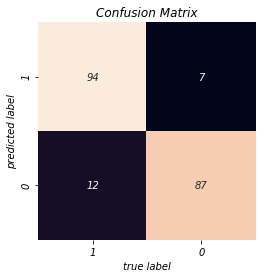

svm_poly  ROC:


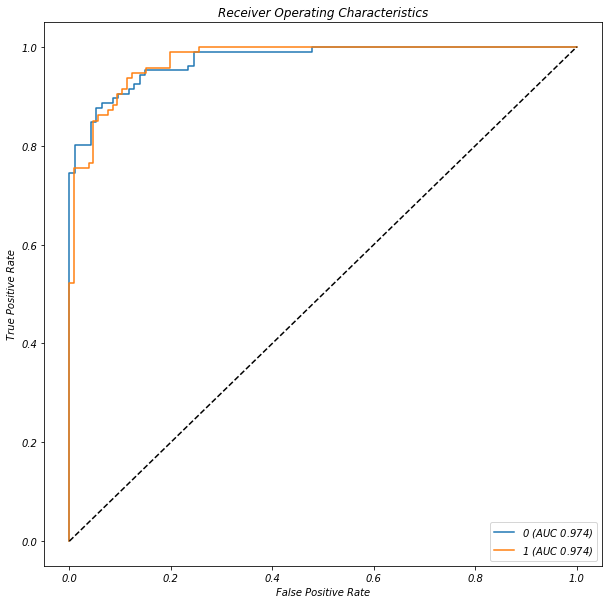

svm_poly  Regions:


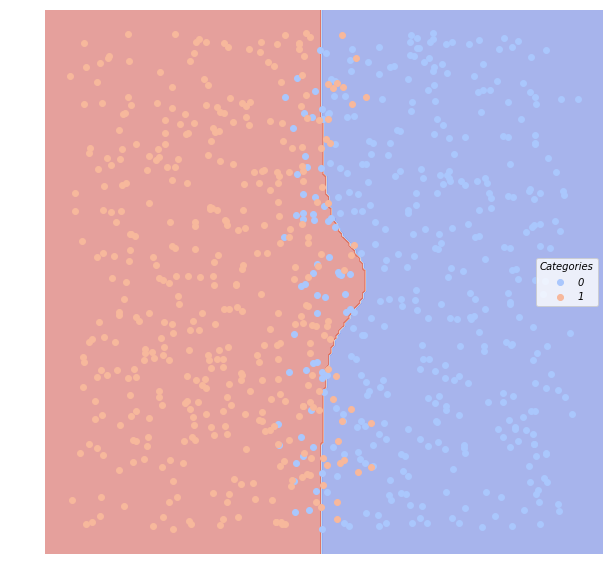

knn  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.914994           0.890373       0.085   0.923810  0.915094
1         0.914994           0.868219       0.085   0.905263  0.914894
knn  Confusion Matrix:


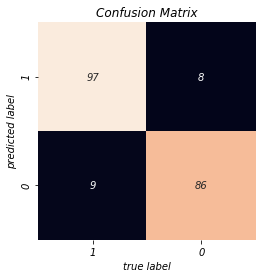

knn  ROC:


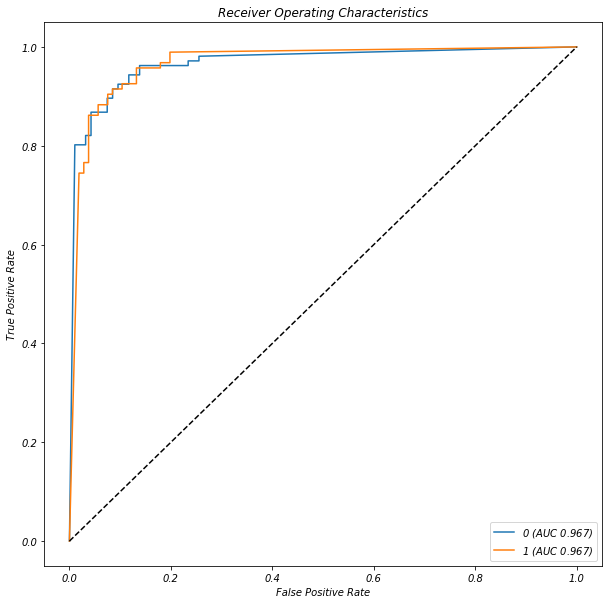

knn  Regions:


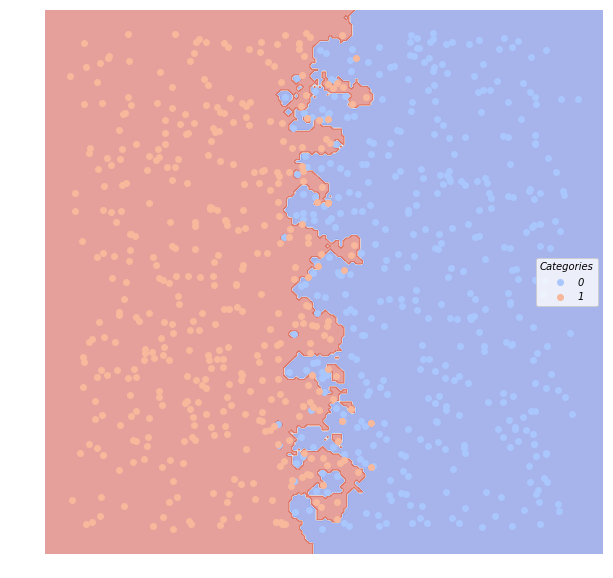

classical_reg  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.904958           0.878032       0.095   0.914286  0.905660
1         0.904958           0.854071       0.095   0.894737  0.904255
classical_reg  Confusion Matrix:


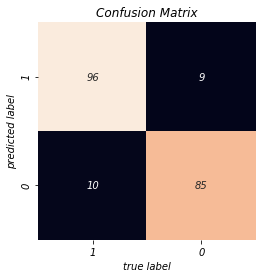

classical_reg  ROC:


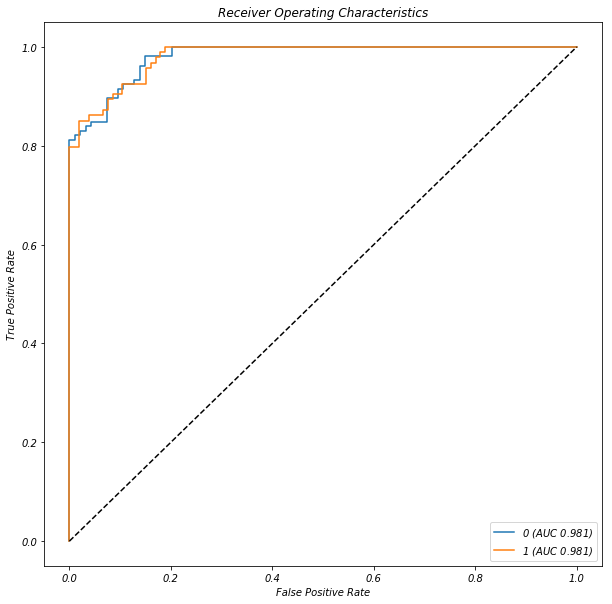

classical_reg  Regions:


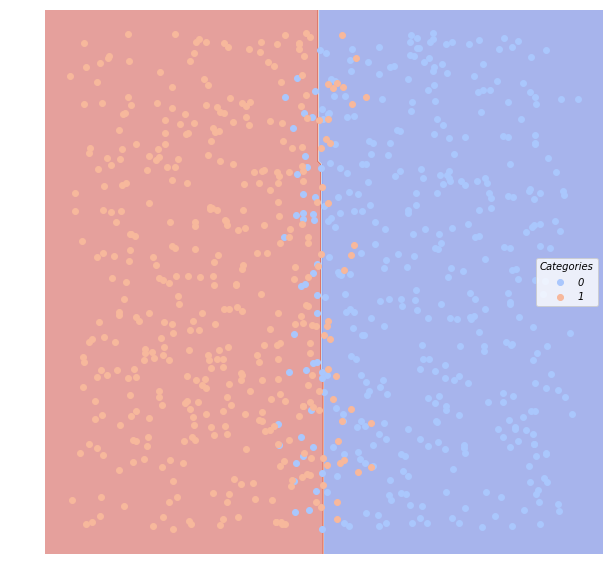

decision_tree  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.910277           0.885994        0.09   0.923077  0.905660
1         0.910277           0.859592        0.09   0.895833  0.914894
decision_tree  Confusion Matrix:


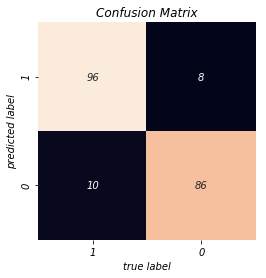

decision_tree  ROC:


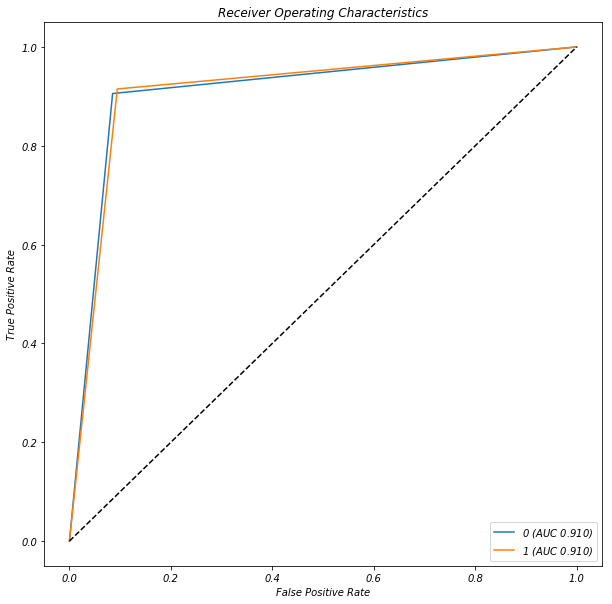

decision_tree  Regions:


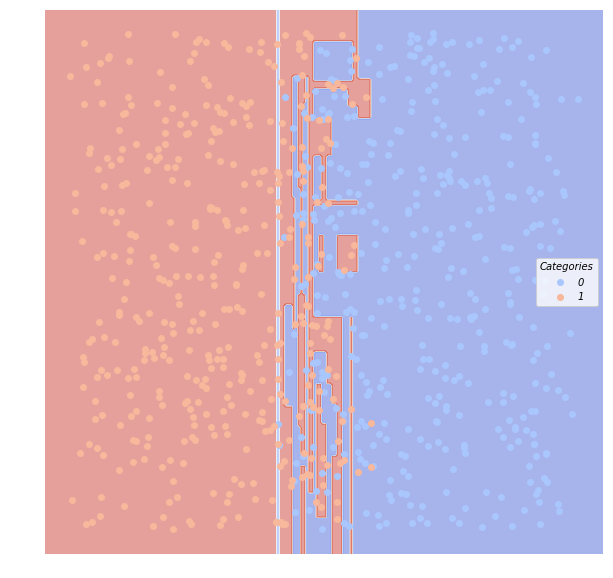

random_forest  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.884886           0.853890       0.115   0.895238  0.886792
1         0.884886           0.826445       0.115   0.873684  0.882979
random_forest  Confusion Matrix:


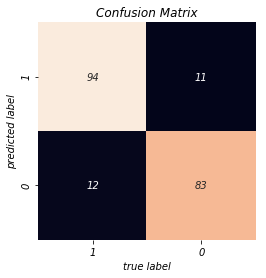

random_forest  ROC:


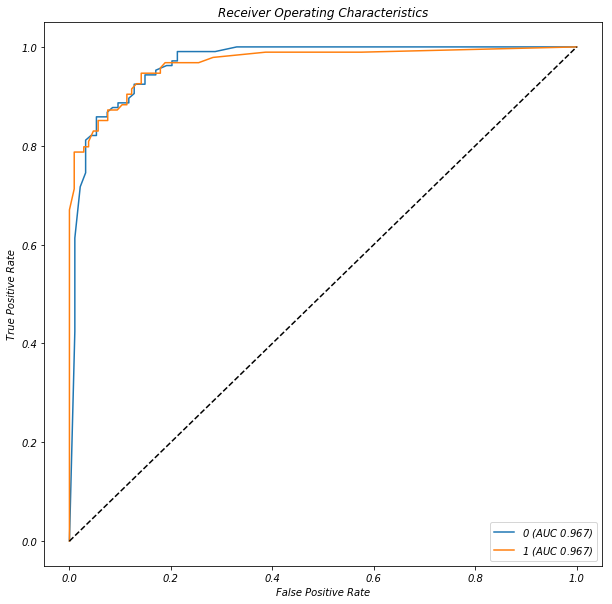

random_forest  Regions:


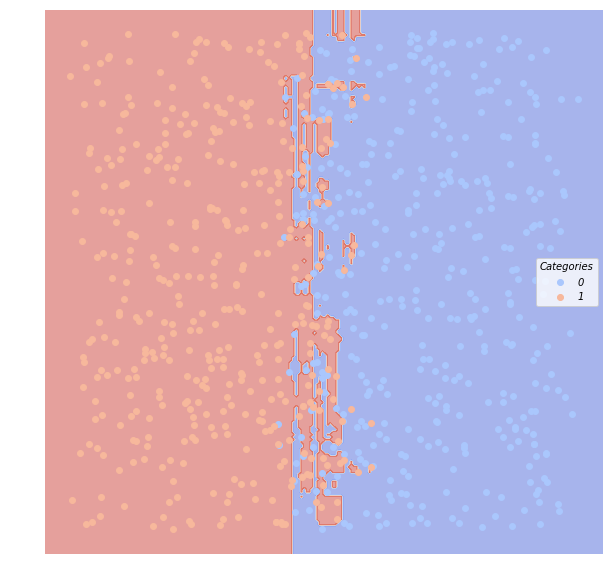

neural_network  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.899639           0.870221         0.1   0.905660  0.905660
1         0.899639           0.848551         0.1   0.893617  0.893617
neural_network  Confusion Matrix:


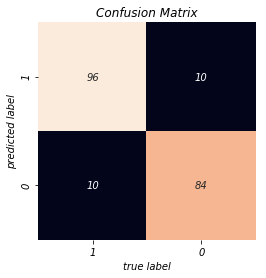

neural_network  ROC:


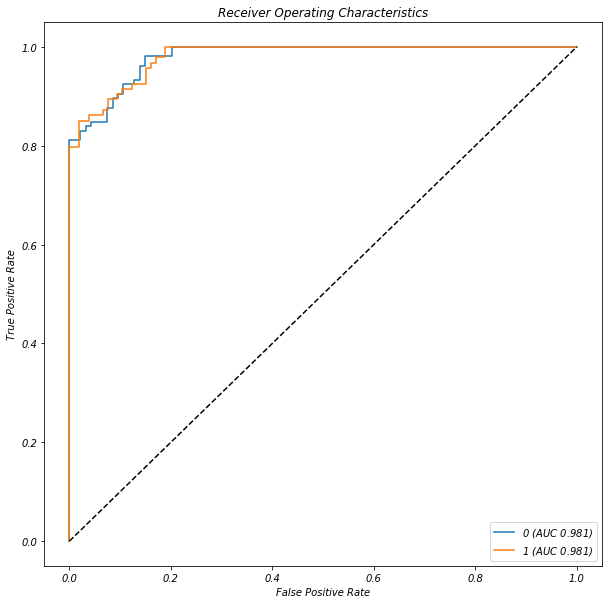

neural_network  Regions:


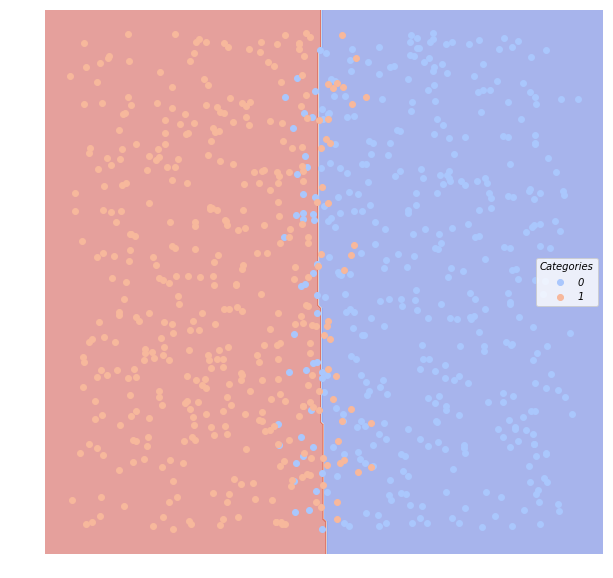

boosting  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.910277           0.885994        0.09   0.923077  0.905660
1         0.910277           0.859592        0.09   0.895833  0.914894
boosting  Confusion Matrix:


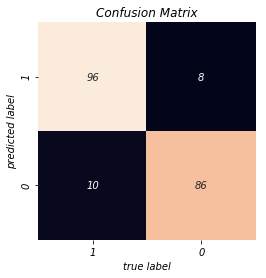

boosting  ROC:


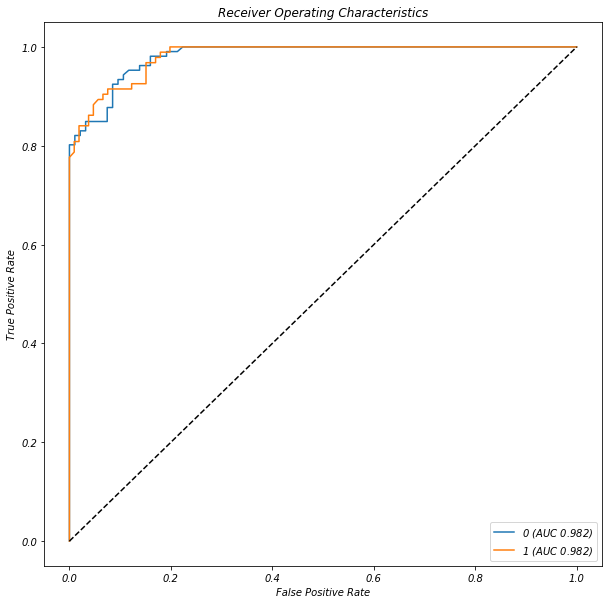

boosting  Regions:


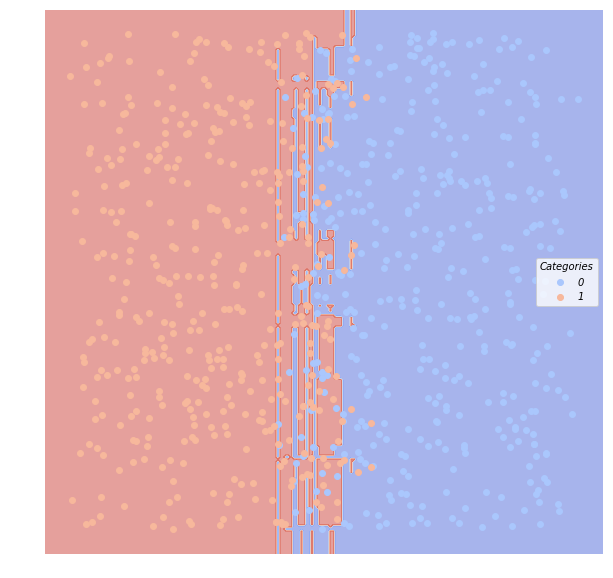

In [11]:
eval1 = all_model_classify(dfTrain1, dfTest1)

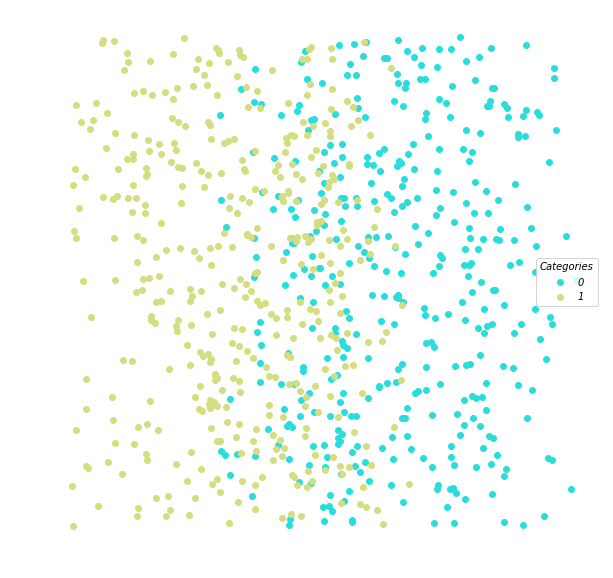

In [12]:
lucem_illud.plotter(dfTrain6)

bayes  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.780324           0.745079        0.22   0.805825  0.775701
1         0.780324           0.690733        0.22   0.752577  0.784946
bayes  Confusion Matrix:


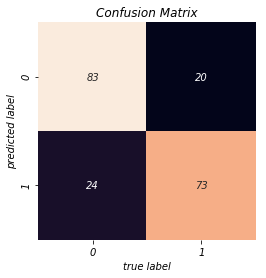

bayes  ROC:


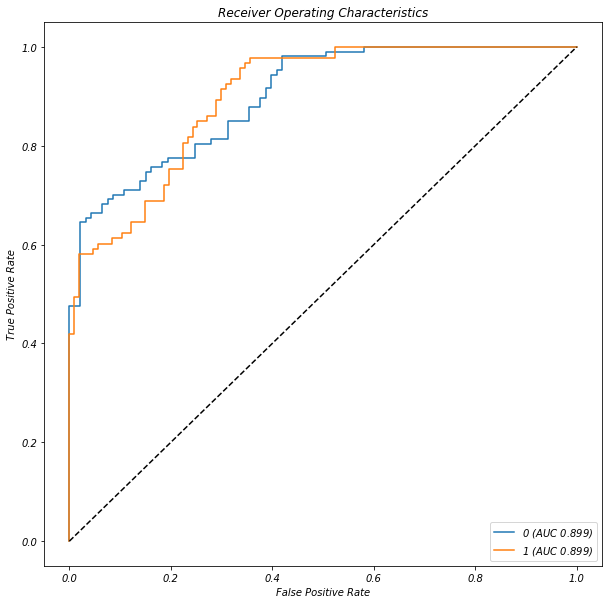

bayes  Regions:


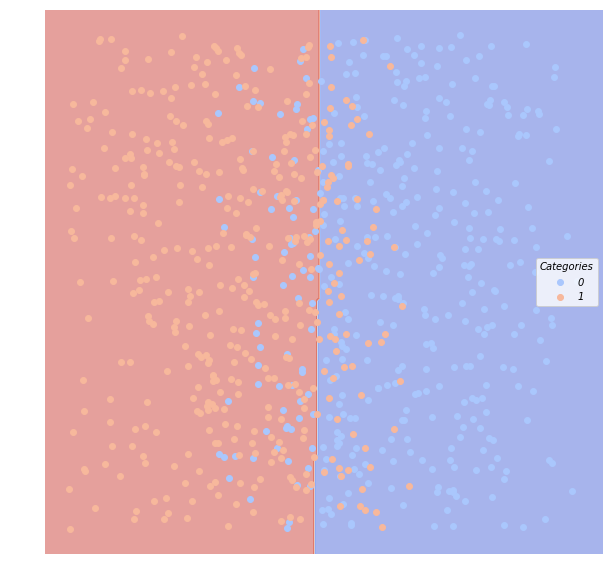

svm_linear  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.774947           0.739069       0.225   0.798077  0.775701
1         0.774947           0.685645       0.225   0.750000  0.774194
svm_linear  Confusion Matrix:


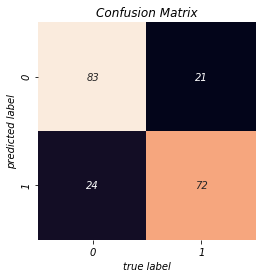

svm_linear  ROC:


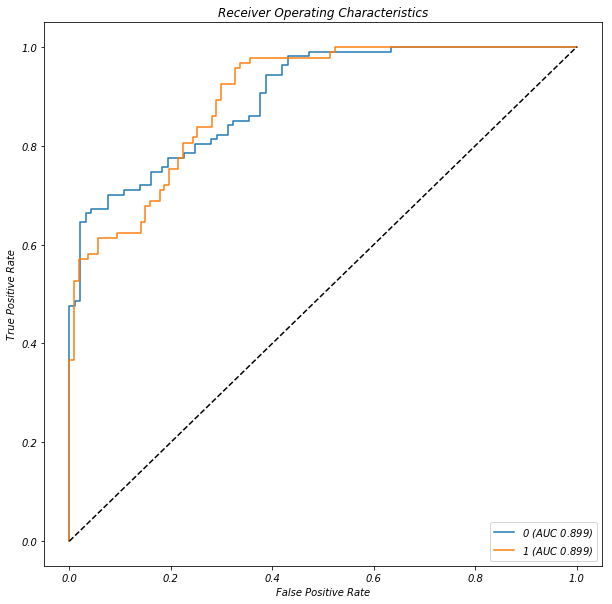

svm_linear  Regions:


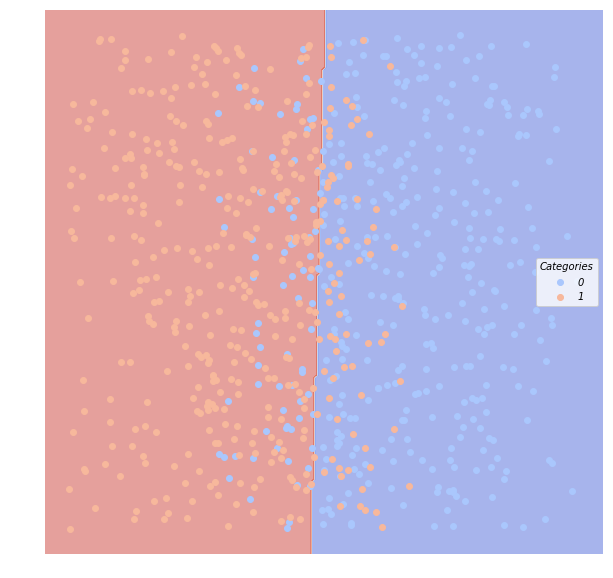

svm_poly  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.799266           0.773990       0.205   0.858696  0.738318
1         0.799266           0.702196       0.205   0.740741  0.860215
svm_poly  Confusion Matrix:


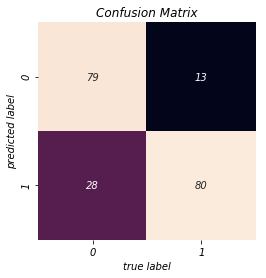

svm_poly  ROC:


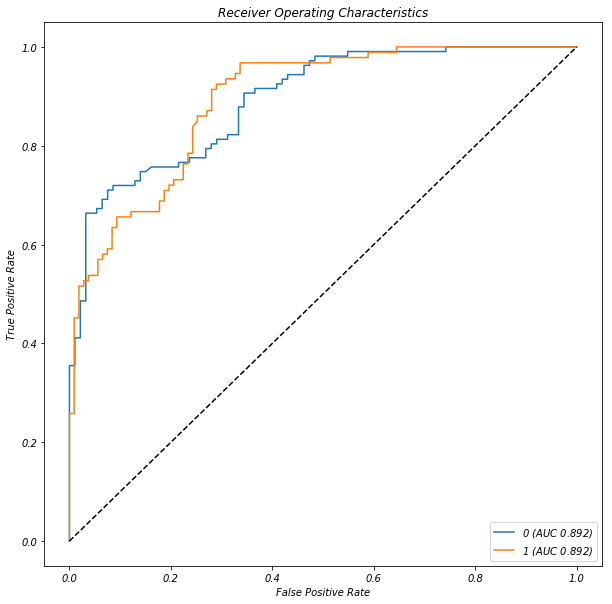

svm_poly  Regions:


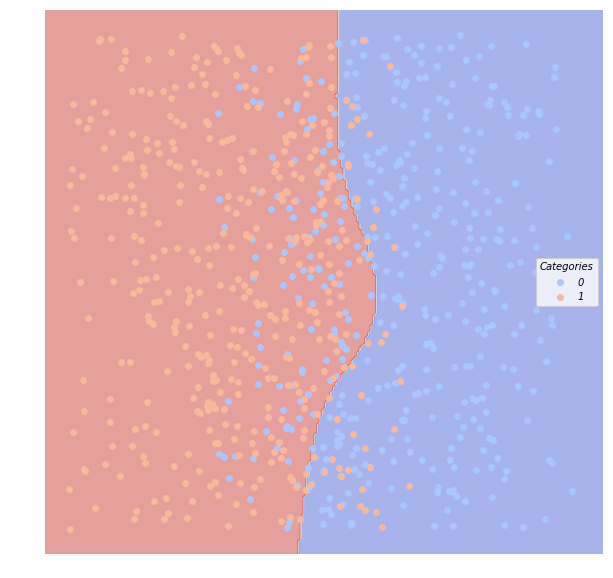

knn  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.790373           0.755232        0.21   0.815534  0.785047
1         0.790373           0.702028        0.21   0.762887  0.795699
knn  Confusion Matrix:


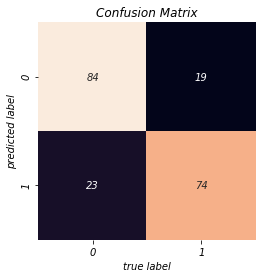

knn  ROC:


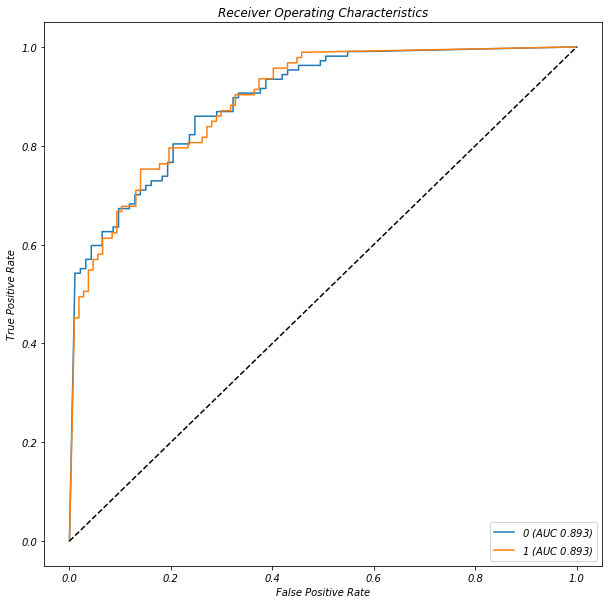

knn  Regions:


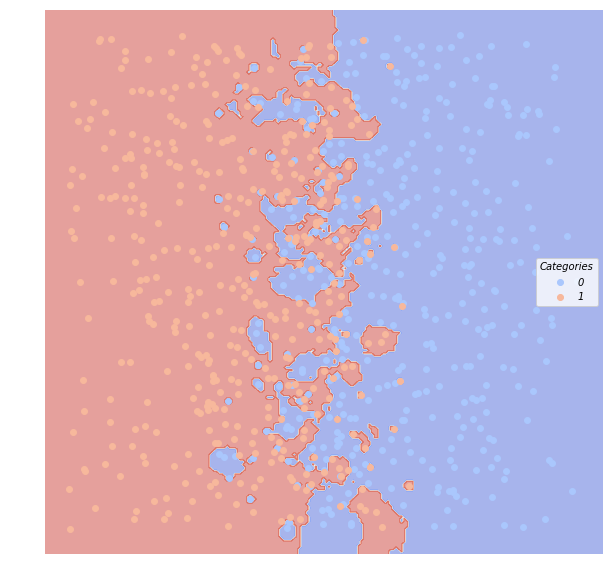

classical_reg  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.780324           0.745079        0.22   0.805825  0.775701
1         0.780324           0.690733        0.22   0.752577  0.784946
classical_reg  Confusion Matrix:


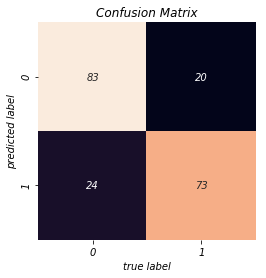

classical_reg  ROC:


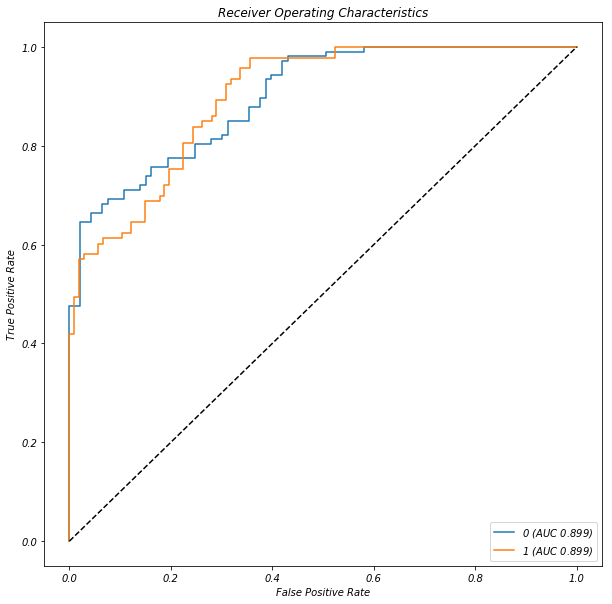

classical_reg  Regions:


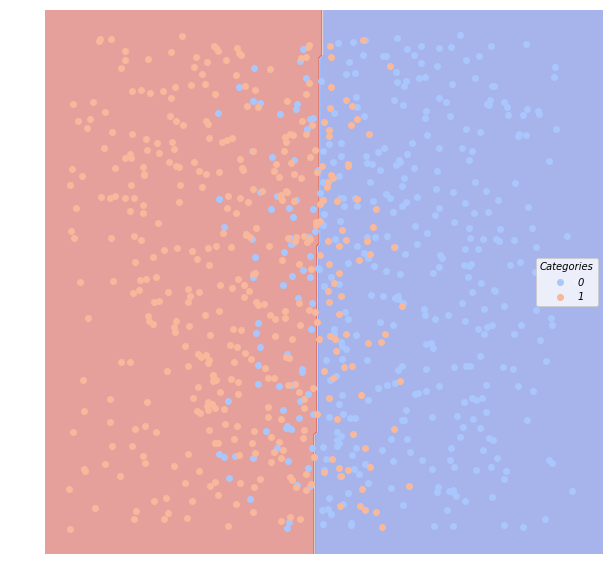

decision_tree  Evaluation:
              AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                             
0         0.77962           0.743037        0.22   0.800000  0.785047
1         0.77962           0.691757        0.22   0.757895  0.774194
decision_tree  Confusion Matrix:


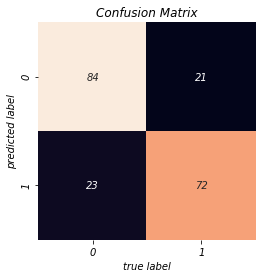

decision_tree  ROC:


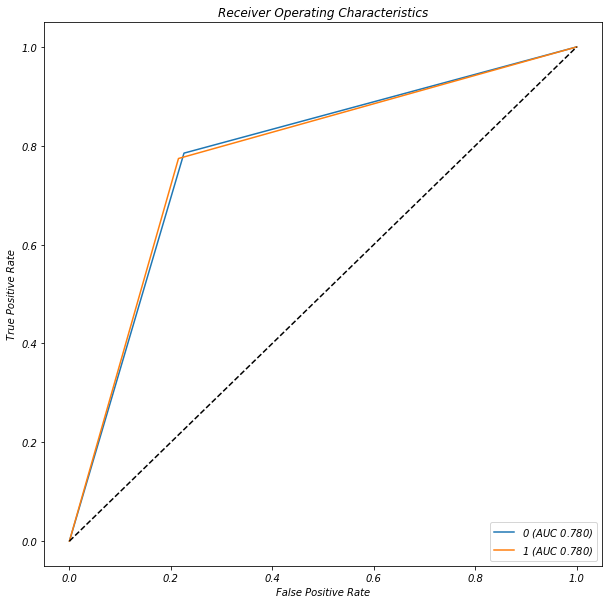

decision_tree  Regions:


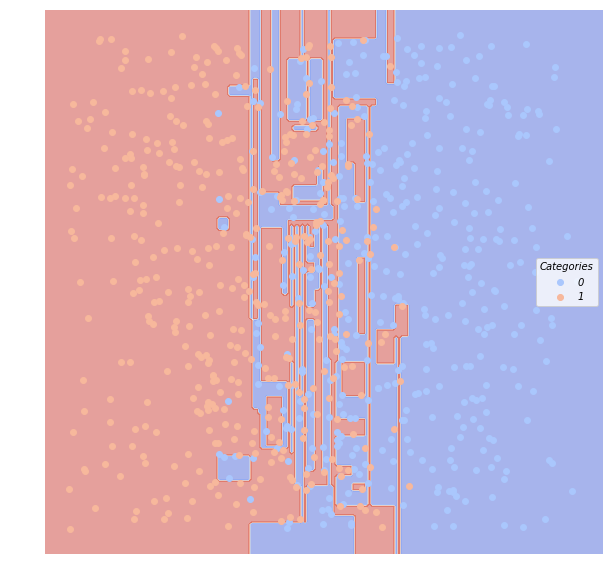

random_forest  Evaluation:
              AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                             
0         0.78359           0.745014       0.215   0.796296  0.803738
1         0.78359           0.699177       0.215   0.771739  0.763441
random_forest  Confusion Matrix:


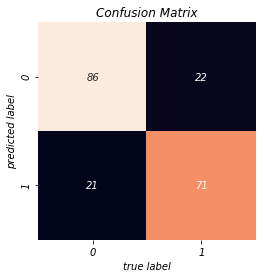

random_forest  ROC:


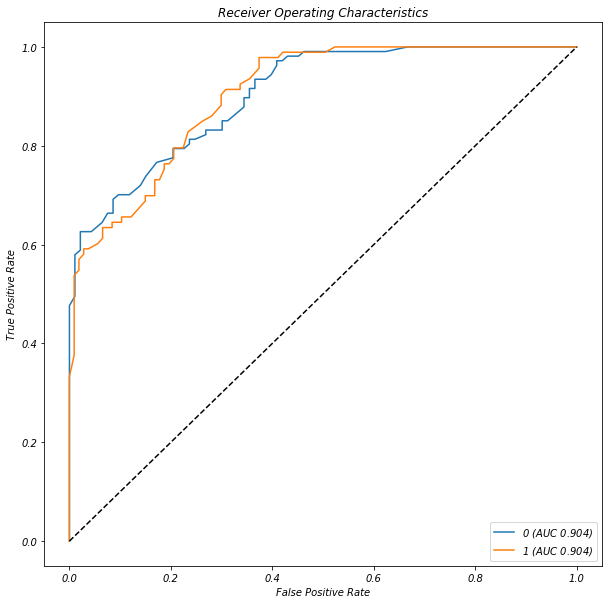

random_forest  Regions:


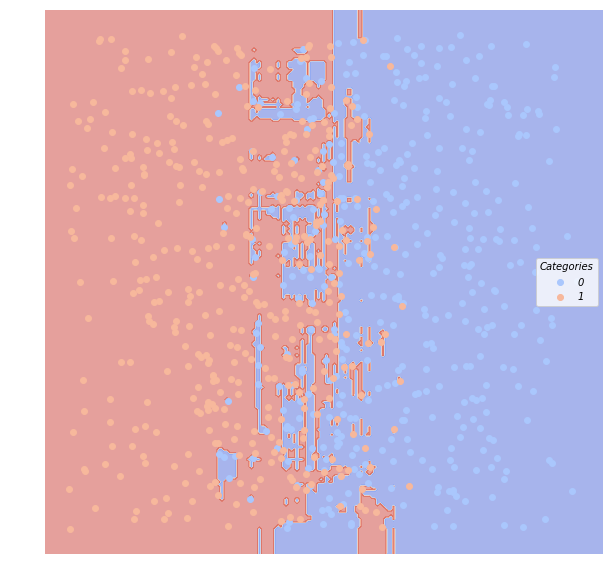

neural_network  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.774244           0.737113       0.225   0.792453  0.785047
1         0.774244           0.686642       0.225   0.755319  0.763441
neural_network  Confusion Matrix:


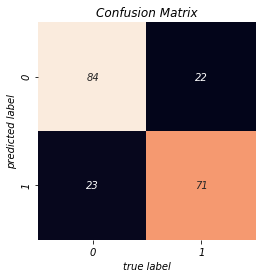

neural_network  ROC:


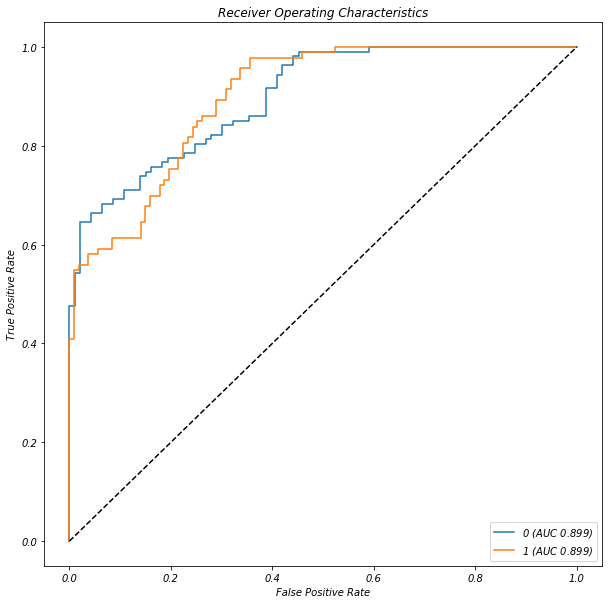

neural_network  Regions:


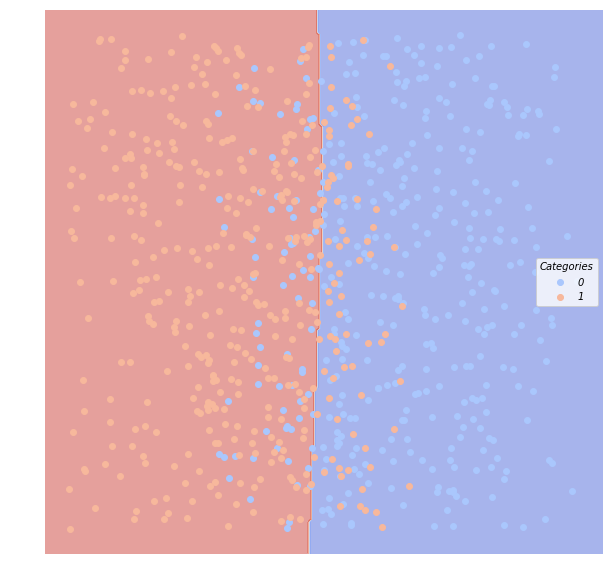

boosting  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.767008           0.735175       0.235   0.806122  0.738318
1         0.767008           0.672272       0.235   0.725490  0.795699
boosting  Confusion Matrix:


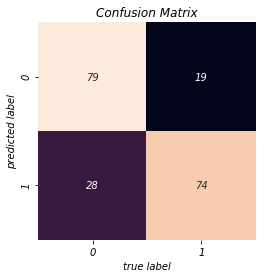

boosting  ROC:


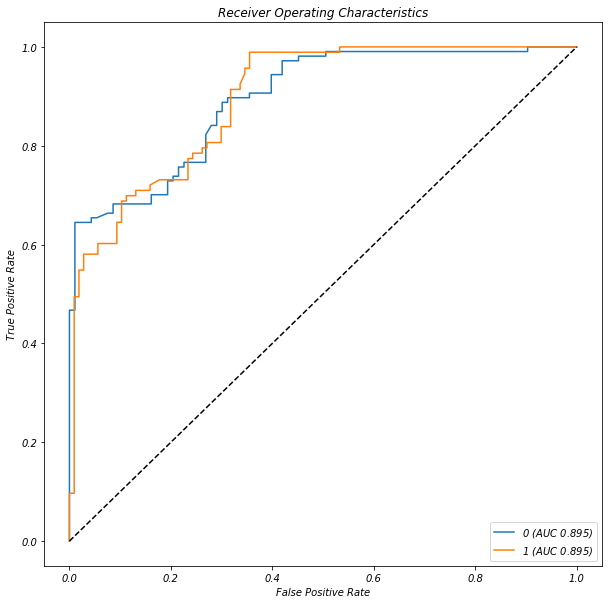

boosting  Regions:


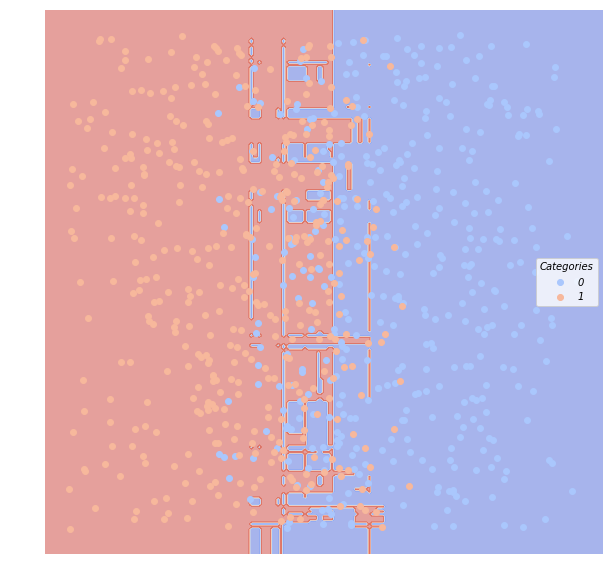

In [13]:
eval6 = all_model_classify(dfTrain6, dfTest6)

#### (3) xorSplit

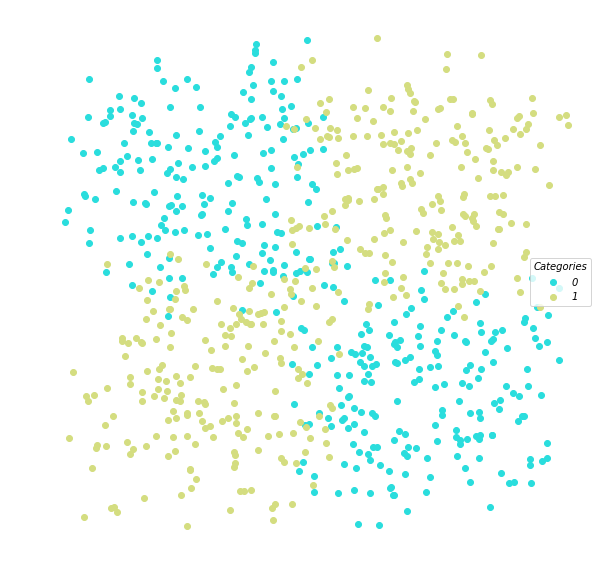

In [14]:
lucem_illud.plotter(dfTrain2)

bayes  Evaluation:
             AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                            
0         0.4387           0.510296       0.575   0.433333  0.242991
1         0.4387           0.437358       0.575   0.421429  0.634409
bayes  Confusion Matrix:


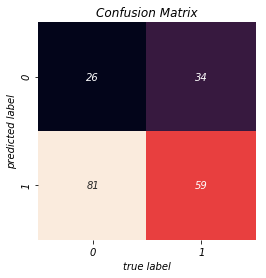

bayes  ROC:


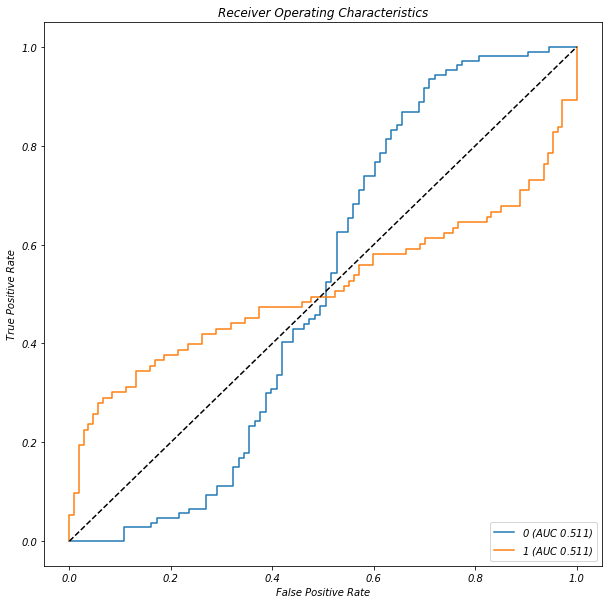

bayes  Regions:


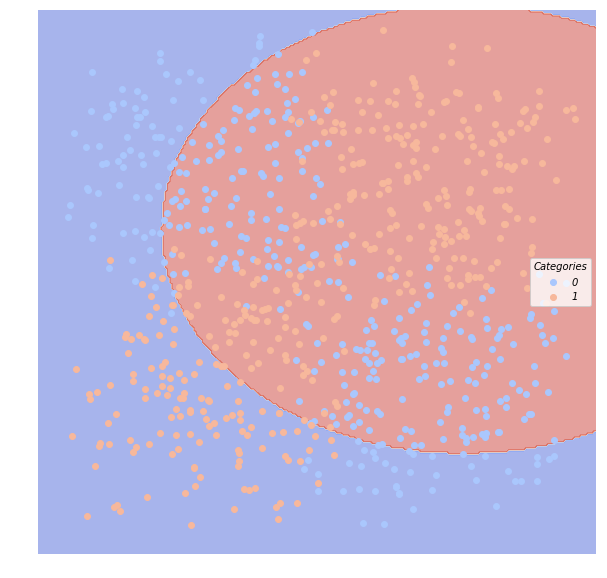

svm_linear  Evaluation:
          AUC  Average_Precision  Error_Rate  Precision  Recall
Category                                                       
0         0.5              0.535       0.535      0.000     0.0
1         0.5              0.465       0.535      0.465     1.0
svm_linear  Confusion Matrix:


/Users/gaomingtao/anaconda3/lib/python3.6/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


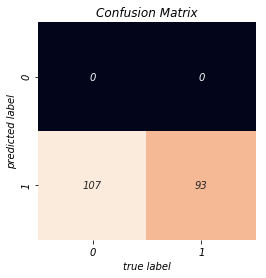

svm_linear  ROC:


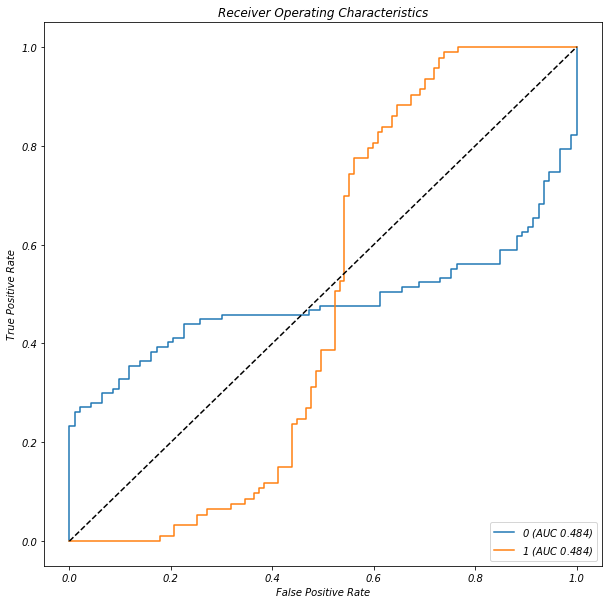

svm_linear  Regions:


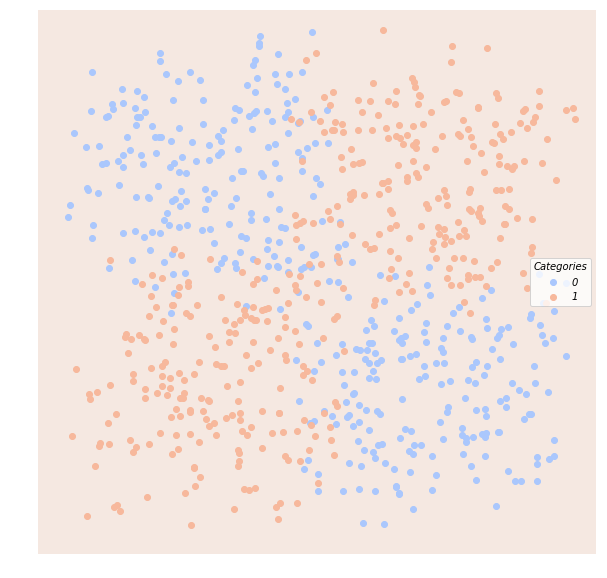

svm_poly  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.693197           0.684267        0.32   0.830769  0.504673
1         0.693197           0.590564        0.32   0.607407  0.881720
svm_poly  Confusion Matrix:


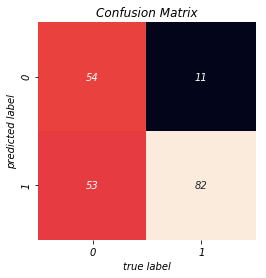

svm_poly  ROC:


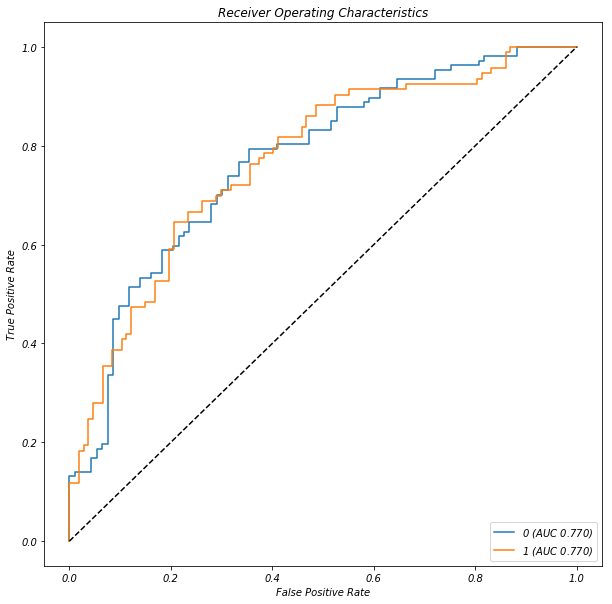

svm_poly  Regions:


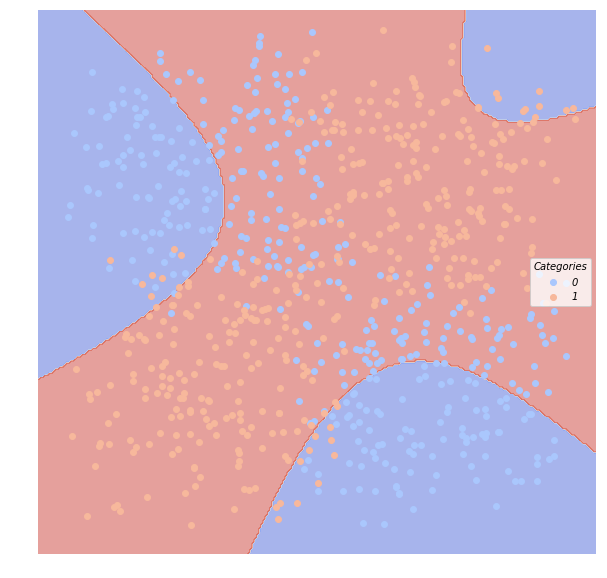

knn  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.890162           0.863293        0.11   0.904762  0.887850
1         0.890162           0.829740        0.11   0.873684  0.892473
knn  Confusion Matrix:


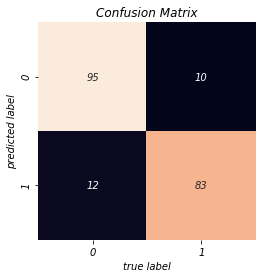

knn  ROC:


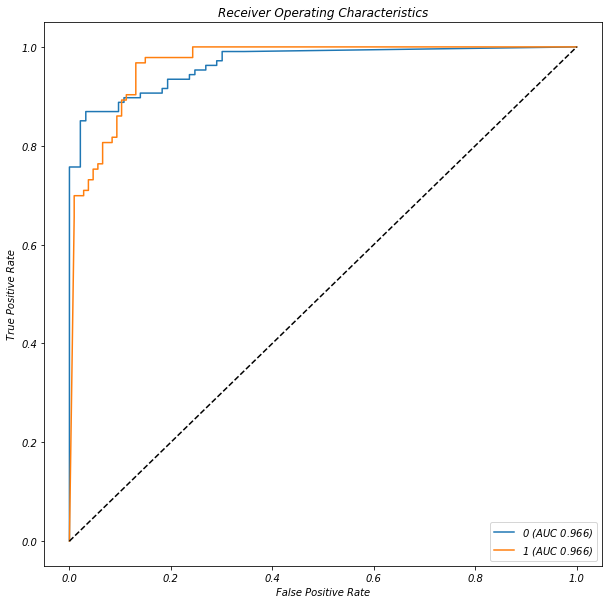

knn  Regions:


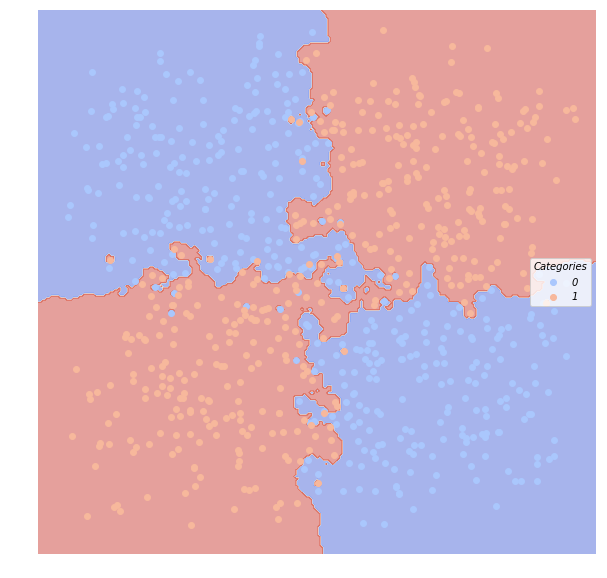

classical_reg  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.328861           0.496582       0.685   0.241379  0.130841
1         0.328861           0.401811       0.685   0.345070  0.526882
classical_reg  Confusion Matrix:


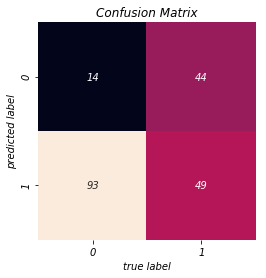

classical_reg  ROC:


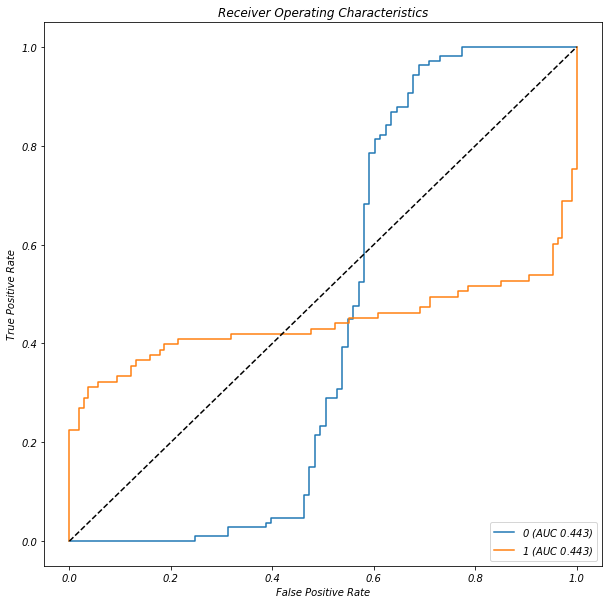

classical_reg  Regions:


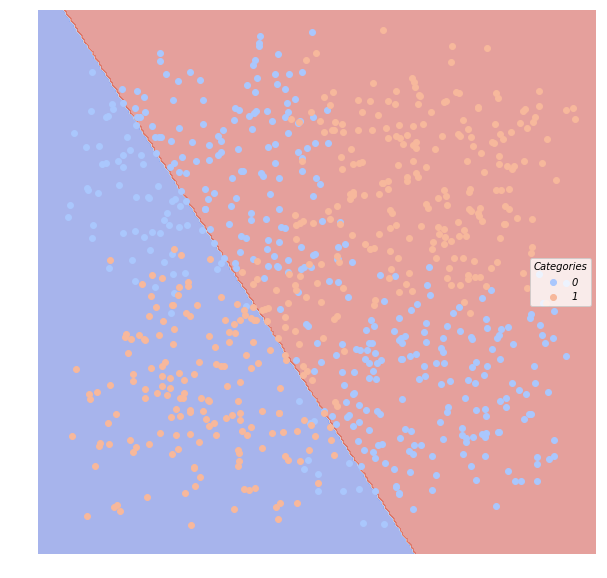

decision_tree  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.843182           0.804834       0.155   0.845455  0.869159
1         0.843182           0.775084       0.155   0.844444  0.817204
decision_tree  Confusion Matrix:


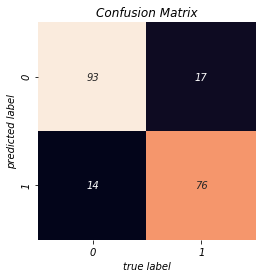

decision_tree  ROC:


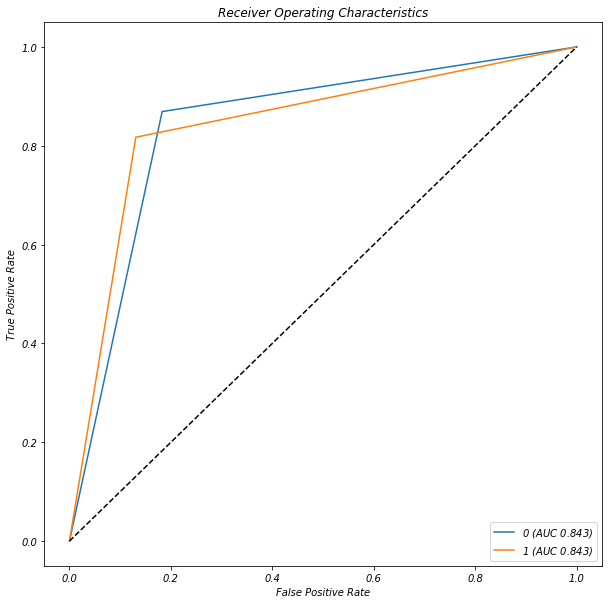

decision_tree  Regions:


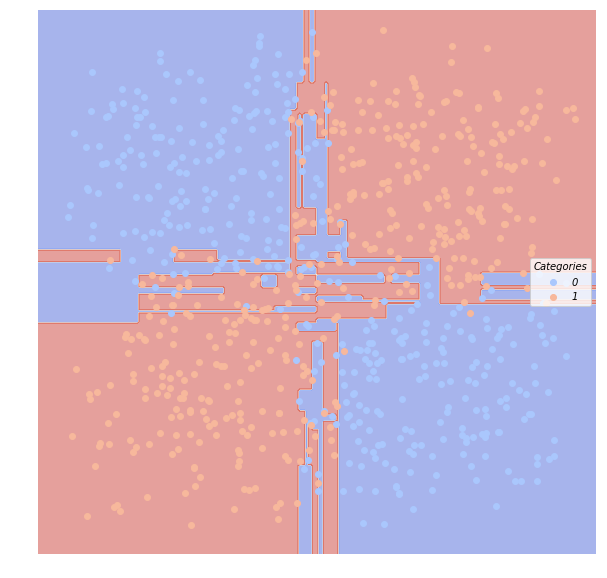

random_forest  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.896945           0.878318       0.105       0.93  0.869159
1         0.896945           0.830269       0.105       0.86  0.924731
random_forest  Confusion Matrix:


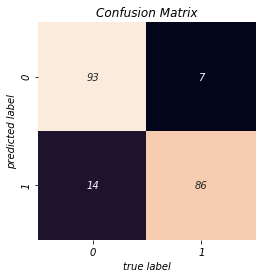

random_forest  ROC:


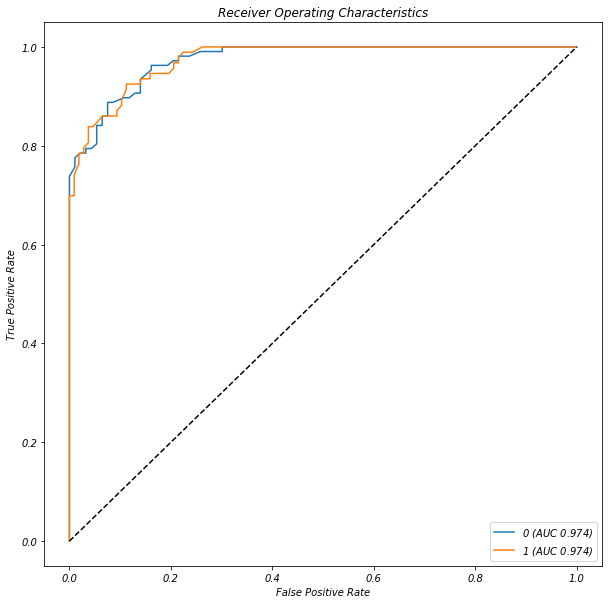

random_forest  Regions:


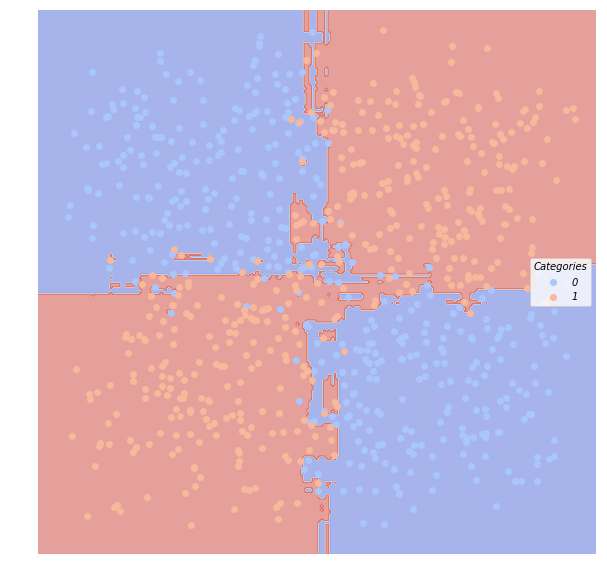

neural_network  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.913526           0.884618       0.085   0.909091  0.934579
1         0.913526           0.873059       0.085   0.922222  0.892473
neural_network  Confusion Matrix:


/Users/gaomingtao/anaconda3/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:617: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


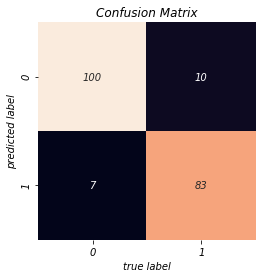

neural_network  ROC:


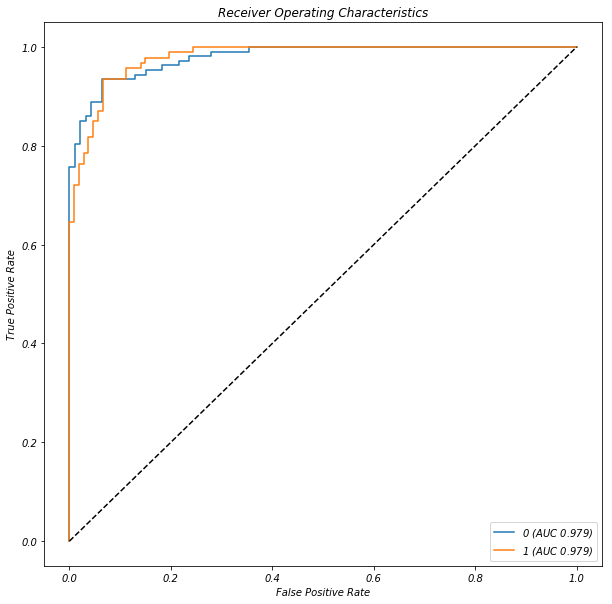

neural_network  Regions:


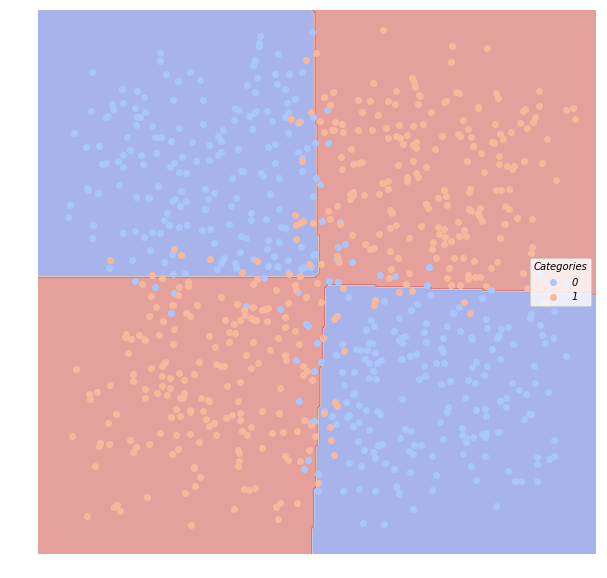

boosting  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.910964           0.891222        0.09   0.932039  0.897196
1         0.910964           0.854865        0.09   0.886598  0.924731
boosting  Confusion Matrix:


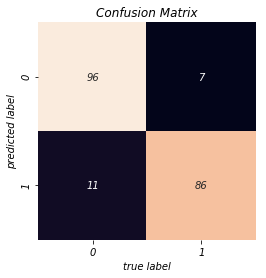

boosting  ROC:


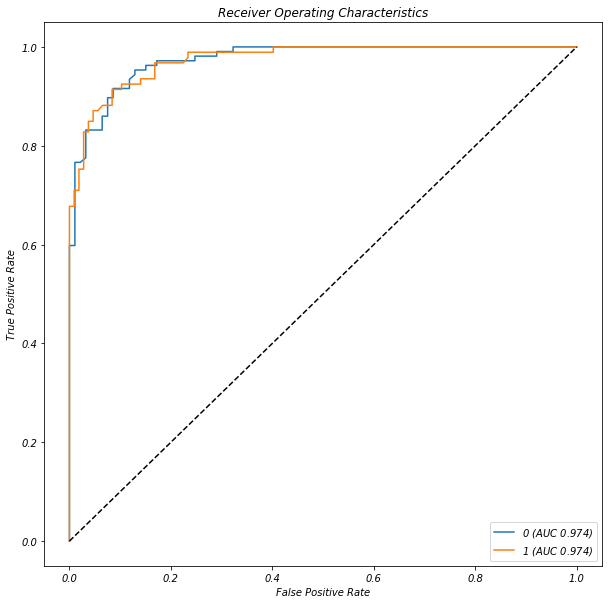

boosting  Regions:


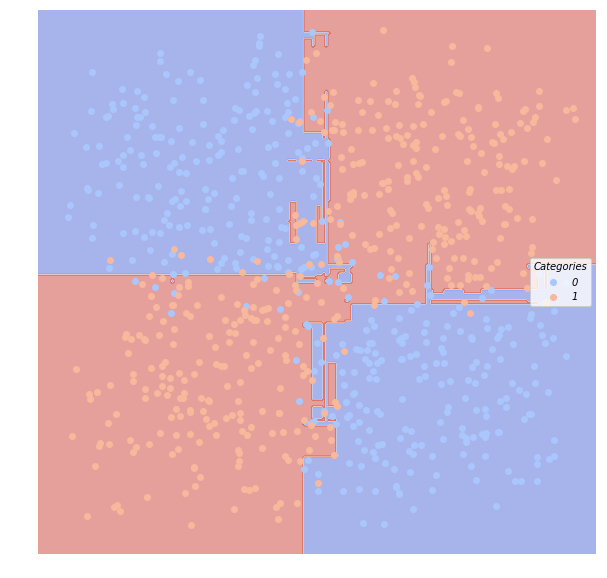

In [15]:
eval2 = all_model_classify(dfTrain2, dfTest2)

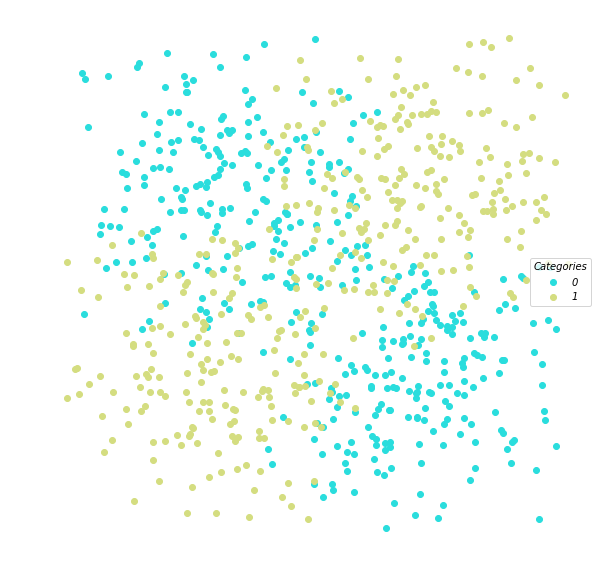

In [16]:
lucem_illud.plotter(dfTrain7)

bayes  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.516058           0.478227        0.49   0.483333  0.617021
1         0.516058           0.538302        0.49   0.550000  0.415094
bayes  Confusion Matrix:


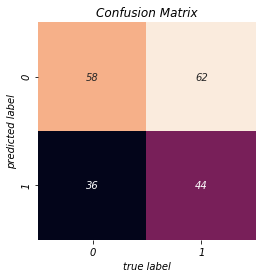

bayes  ROC:


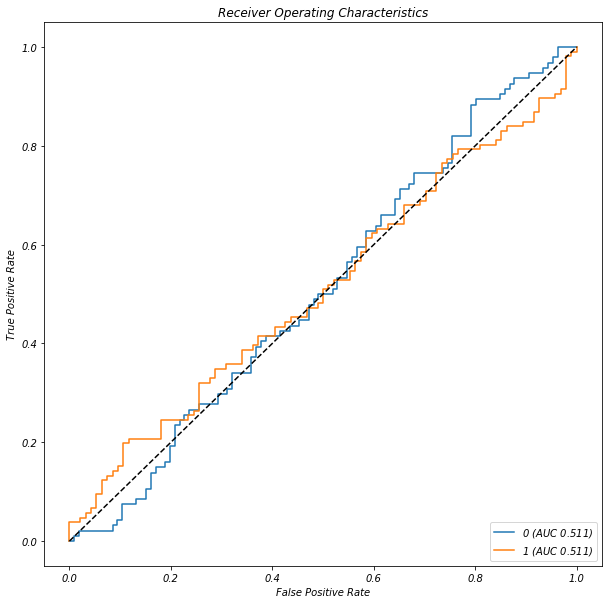

bayes  Regions:


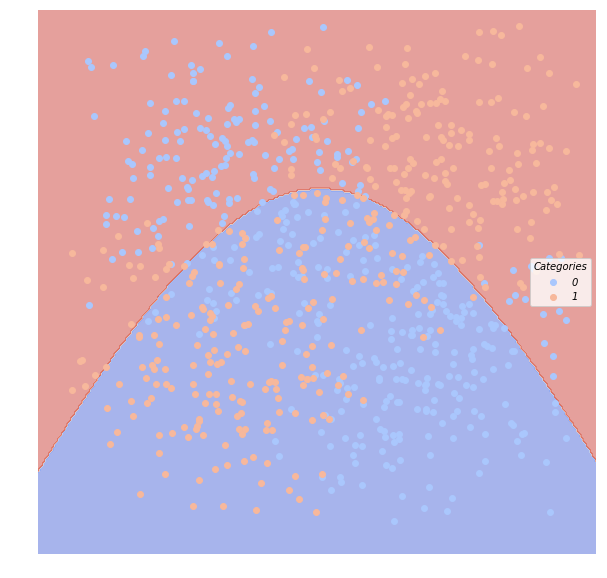

svm_linear  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.541449           0.492150       0.465   0.504132  0.648936
1         0.541449           0.552687       0.465   0.582278  0.433962
svm_linear  Confusion Matrix:


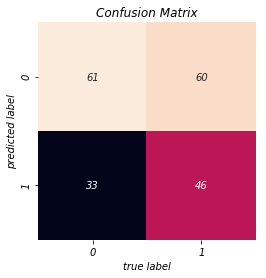

svm_linear  ROC:


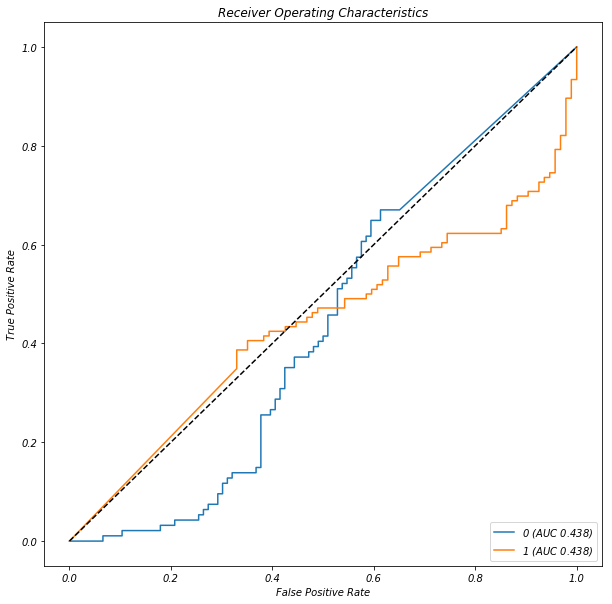

svm_linear  Regions:


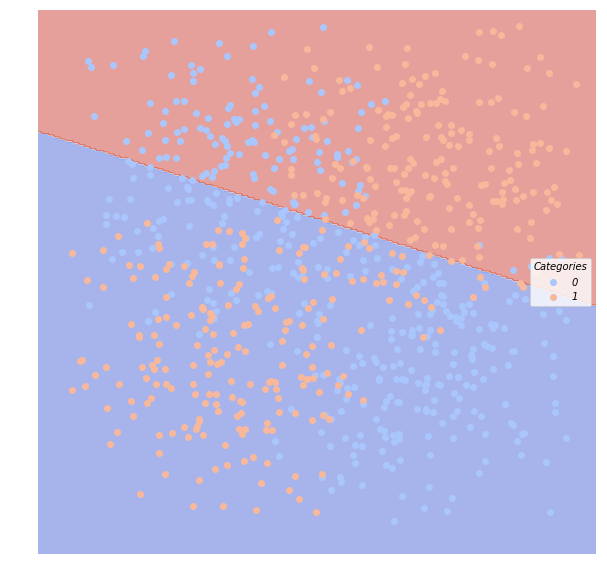

svm_poly  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.705741           0.661915        0.28   0.880000  0.468085
1         0.705741           0.658931        0.28   0.666667  0.943396
svm_poly  Confusion Matrix:


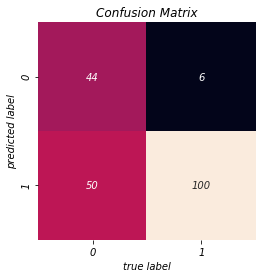

svm_poly  ROC:


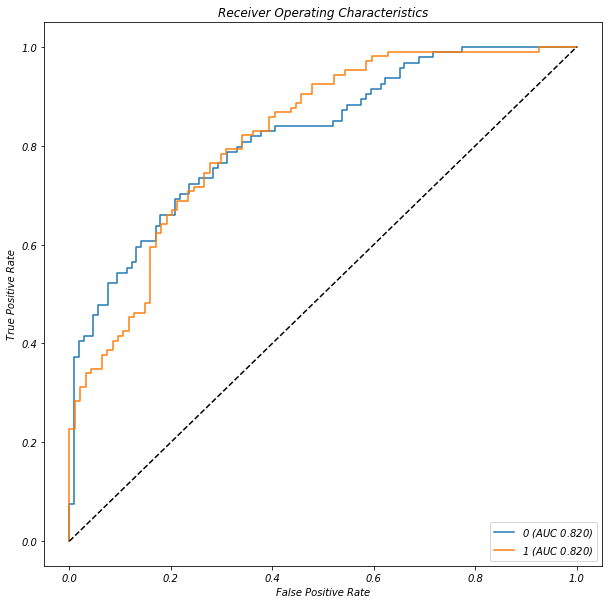

svm_poly  Regions:


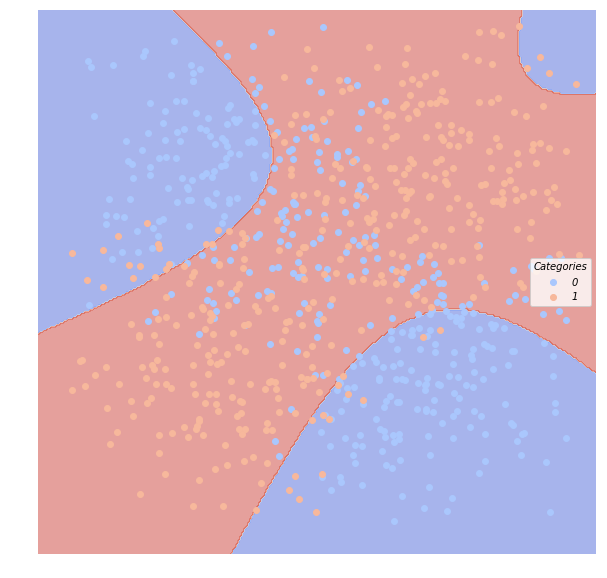

knn  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.743175           0.659784       0.255   0.736264  0.712766
1         0.743175           0.701963       0.255   0.752294  0.773585
knn  Confusion Matrix:


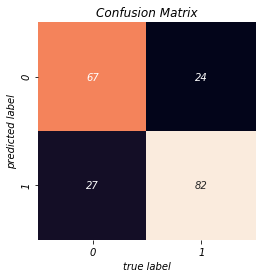

knn  ROC:


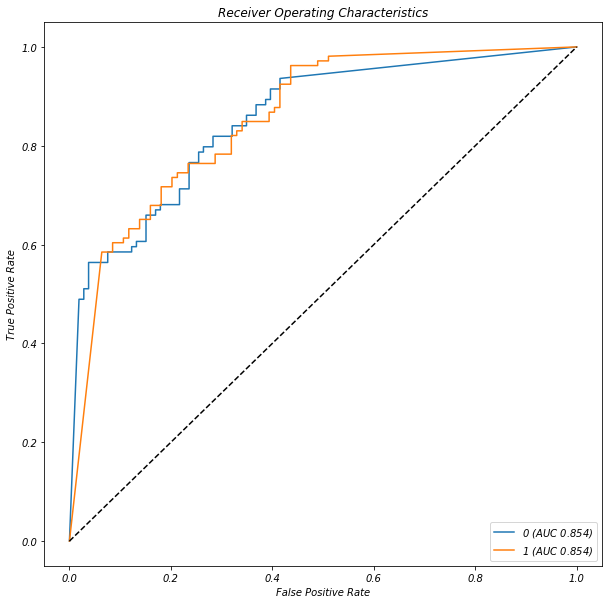

knn  Regions:


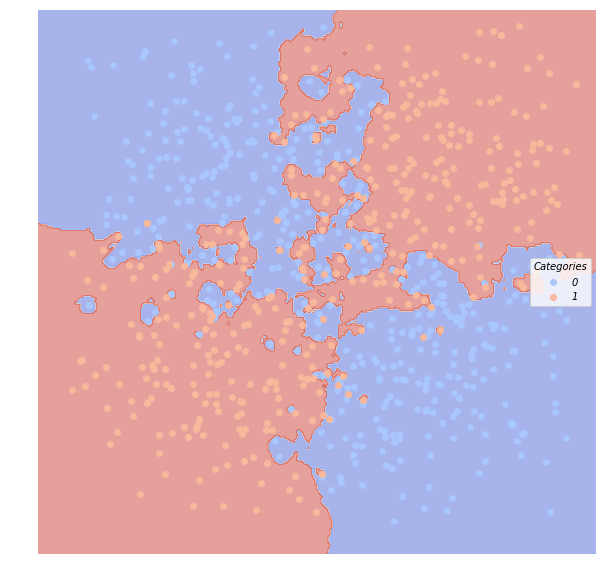

classical_reg  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.518968           0.479786       0.485   0.486726  0.585106
1         0.518968           0.539837       0.485   0.551724  0.452830
classical_reg  Confusion Matrix:


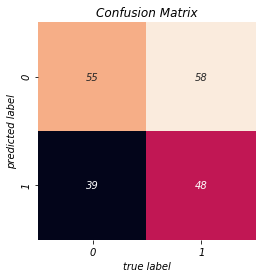

classical_reg  ROC:


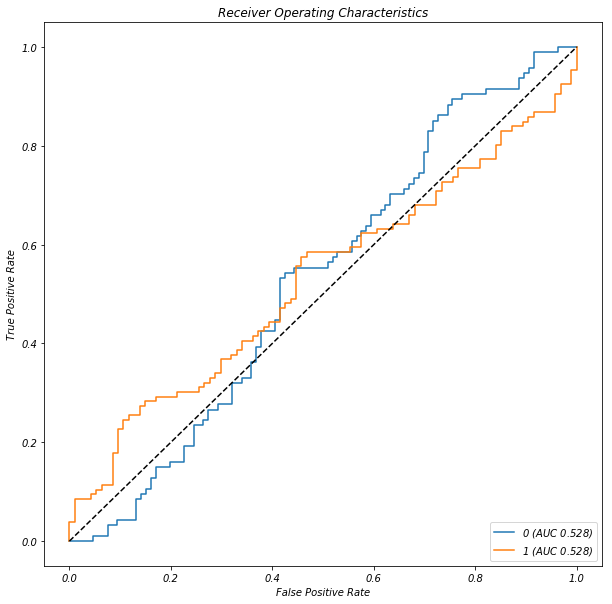

classical_reg  Regions:


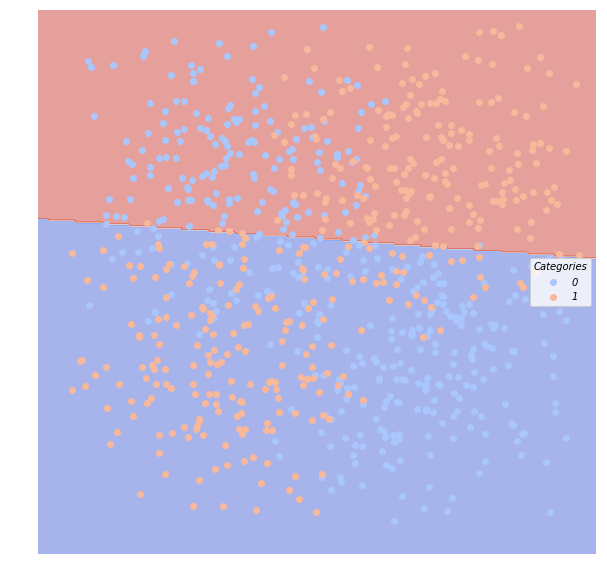

decision_tree  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.749699           0.662996        0.25   0.729167  0.744681
1         0.749699           0.710552        0.25   0.769231  0.754717
decision_tree  Confusion Matrix:


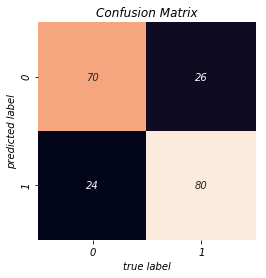

decision_tree  ROC:


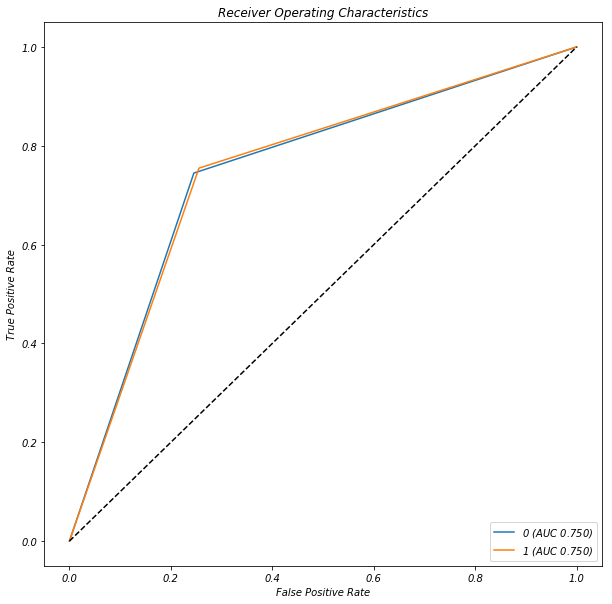

decision_tree  Regions:


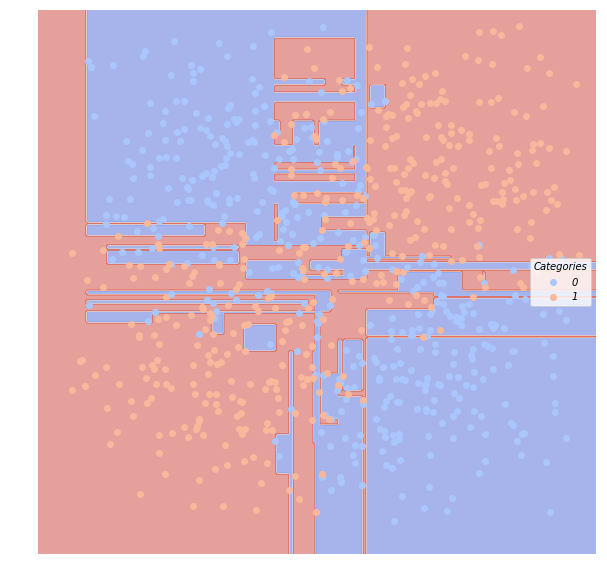

random_forest  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.737856           0.654894        0.26   0.733333  0.702128
1         0.737856           0.696672        0.26   0.745455  0.773585
random_forest  Confusion Matrix:


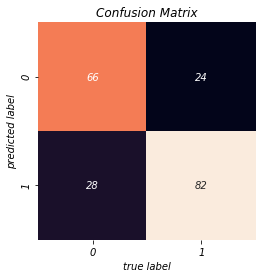

random_forest  ROC:


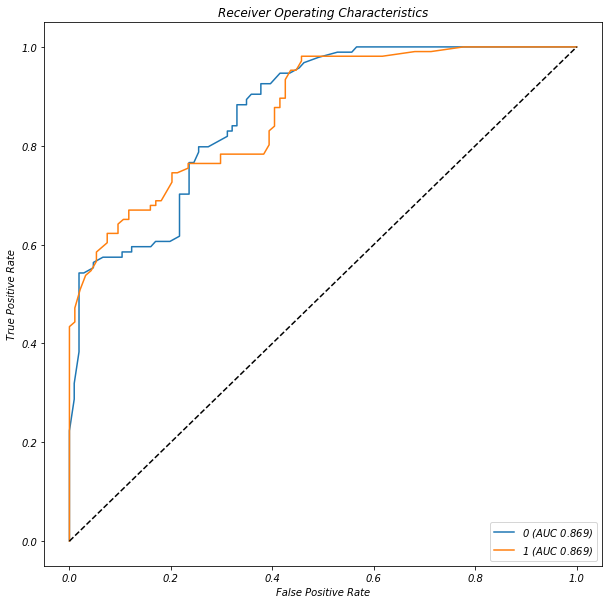

random_forest  Regions:


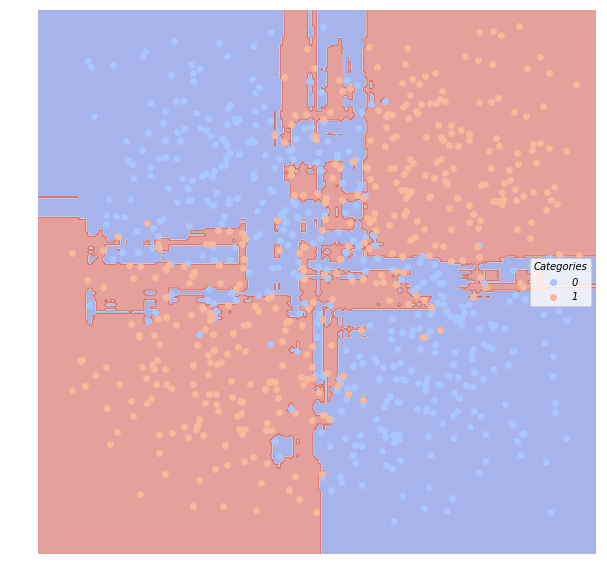

neural_network  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.767363           0.688994        0.23   0.772727  0.723404
1         0.767363           0.722978        0.23   0.767857  0.811321
neural_network  Confusion Matrix:


/Users/gaomingtao/anaconda3/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:617: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


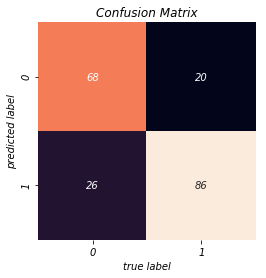

neural_network  ROC:


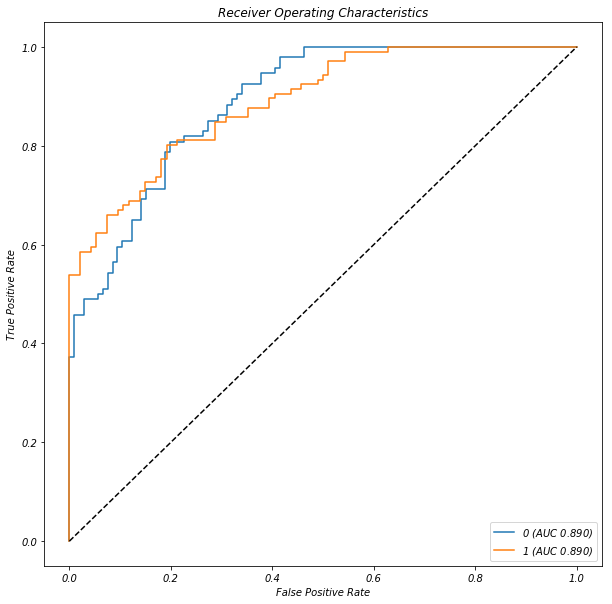

neural_network  Regions:


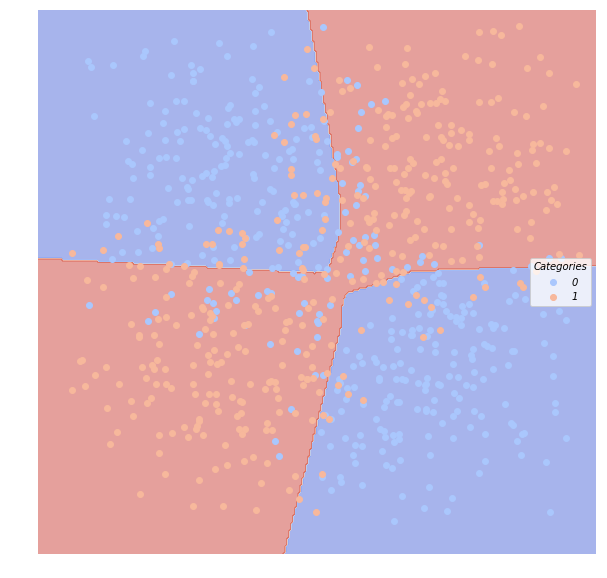

boosting  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.759133           0.674550        0.24   0.744681  0.744681
1         0.759133           0.718434        0.24   0.773585  0.773585
boosting  Confusion Matrix:


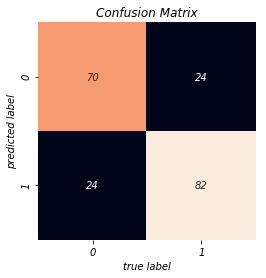

boosting  ROC:


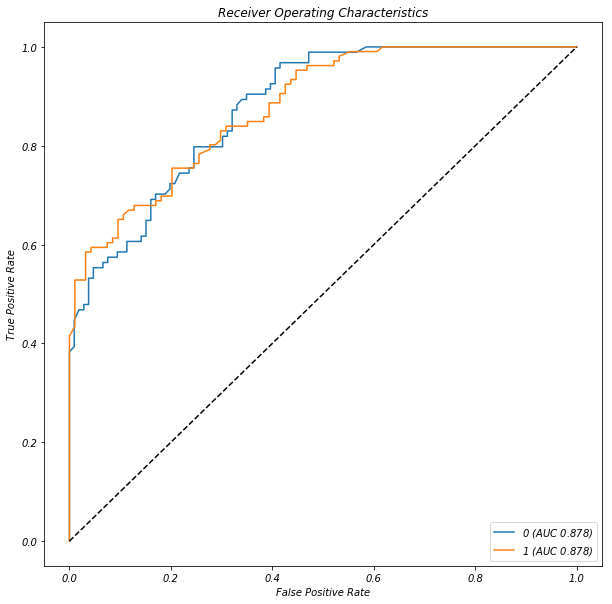

boosting  Regions:


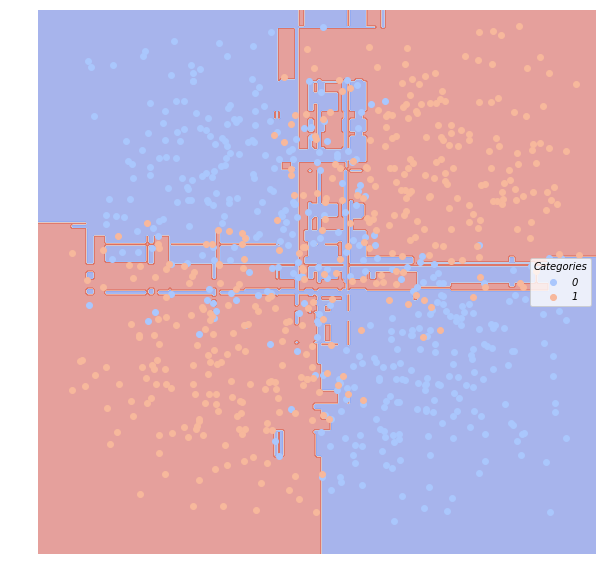

In [17]:
eval7 = all_model_classify(dfTrain7, dfTest7)

#### (4) targetSplit

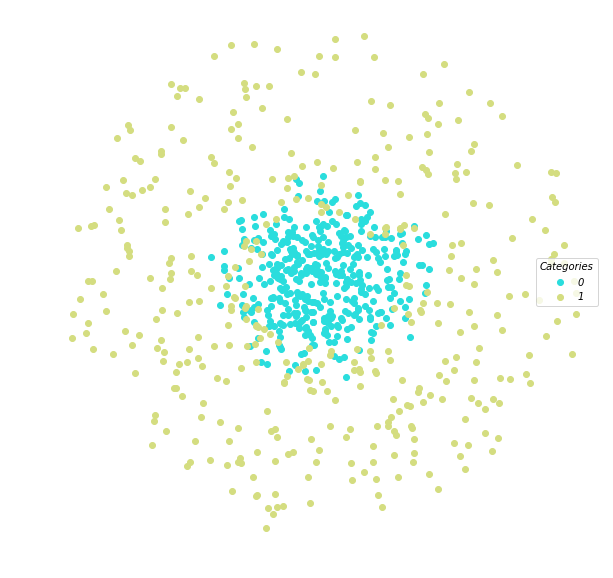

In [18]:
lucem_illud.plotter(dfTrain3)

bayes  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.880492           0.822583        0.12   0.861386  0.896907
1         0.880492           0.846797        0.12   0.898990  0.864078
bayes  Confusion Matrix:


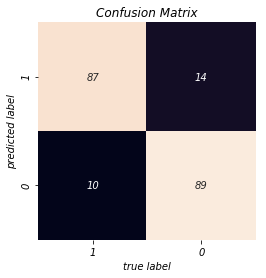

bayes  ROC:


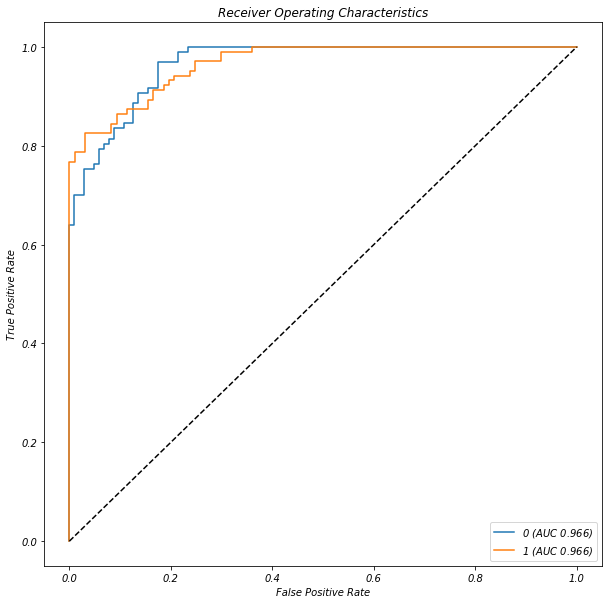

bayes  Regions:


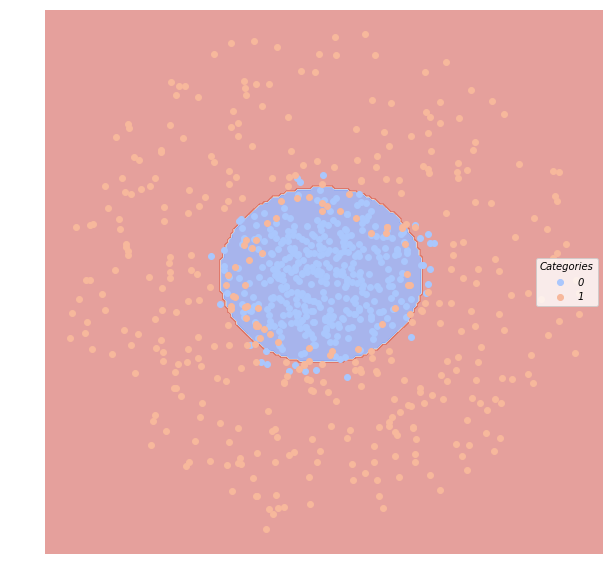

svm_linear  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.608948           0.547107         0.4   0.553459  0.907216
1         0.608948           0.597482         0.4   0.780488  0.310680
svm_linear  Confusion Matrix:


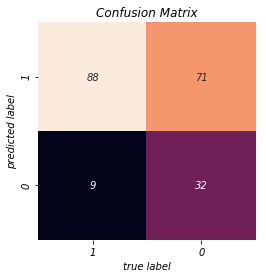

svm_linear  ROC:


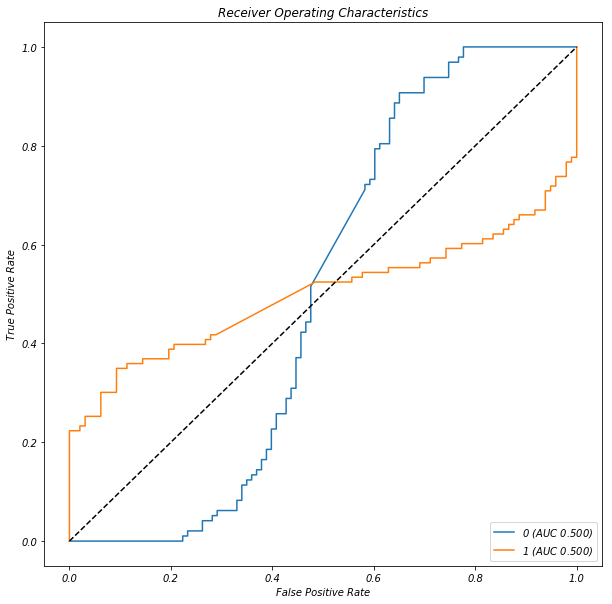

svm_linear  Regions:


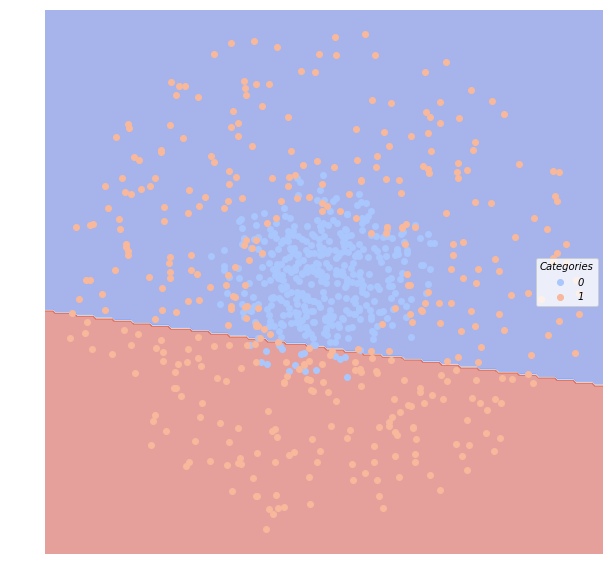

svm_poly  Evaluation:
              AUC  Average_Precision  Error_Rate  Precision   Recall
Category                                                            
0         0.57767           0.527174       0.435   0.527174  1.00000
1         0.57767           0.590340       0.435   1.000000  0.15534
svm_poly  Confusion Matrix:


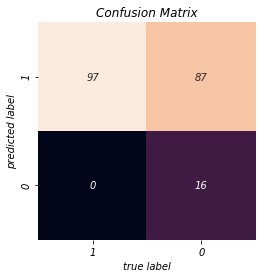

svm_poly  ROC:


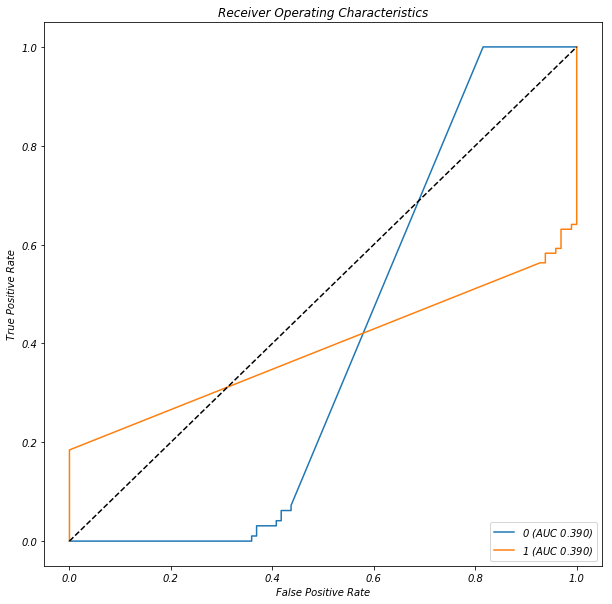

svm_poly  Regions:


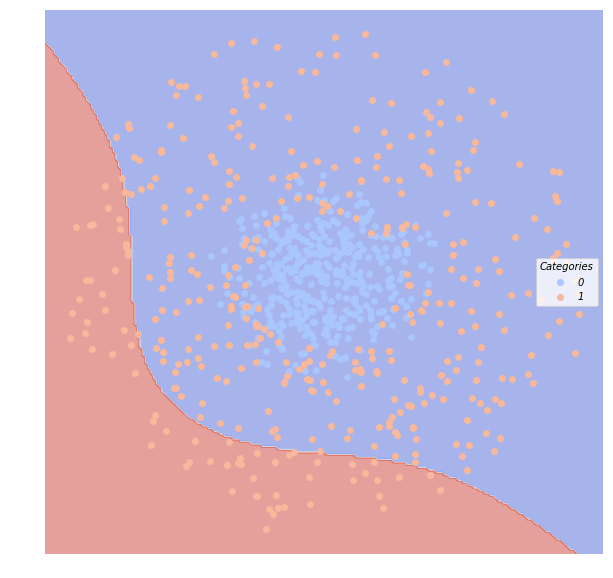

knn  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.875338           0.817474       0.125       0.86  0.886598
1         0.875338           0.839029       0.125       0.89  0.864078
knn  Confusion Matrix:


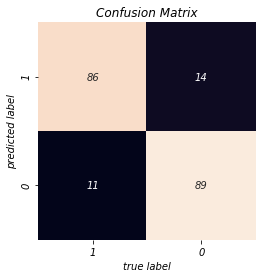

knn  ROC:


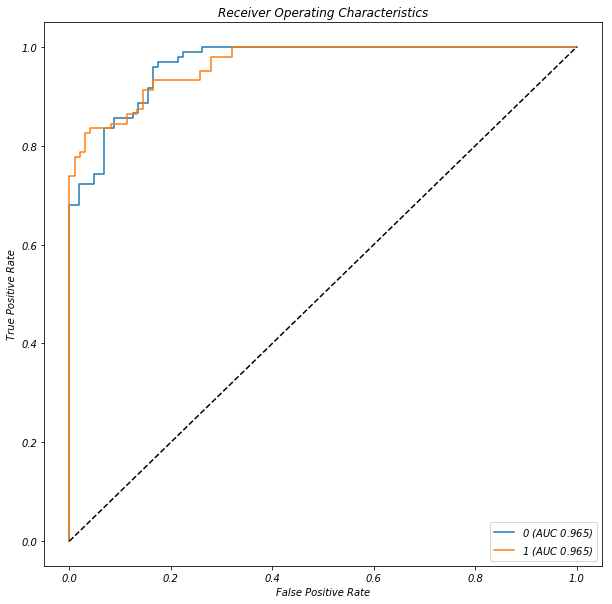

knn  Regions:


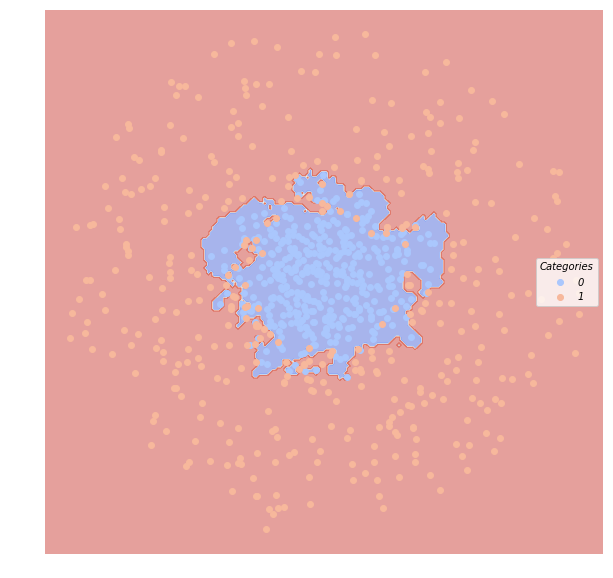

classical_reg  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.531979           0.501906        0.47   0.513274  0.597938
1         0.531979           0.532114        0.47   0.551724  0.466019
classical_reg  Confusion Matrix:


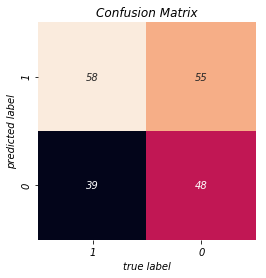

classical_reg  ROC:


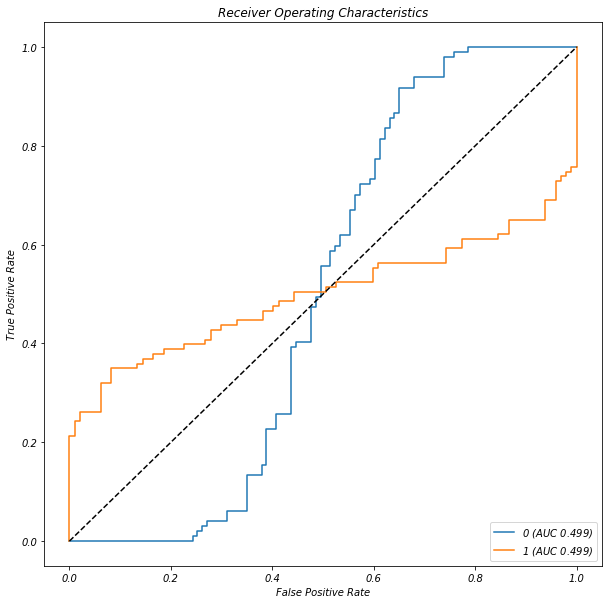

classical_reg  Regions:


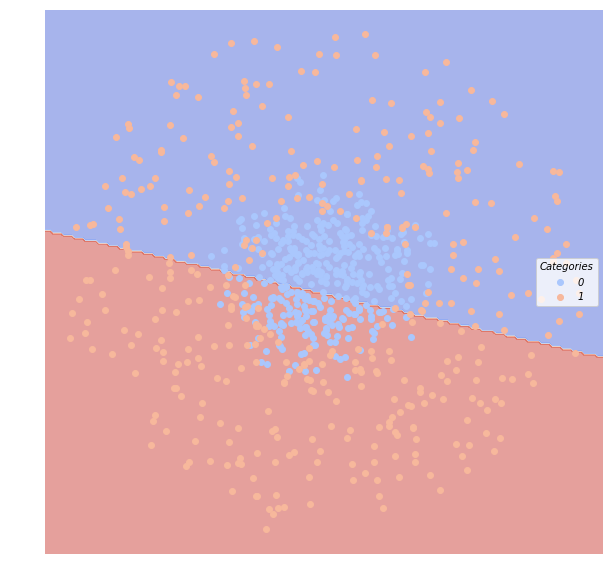

decision_tree  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.864428           0.812442       0.135   0.872340  0.845361
1         0.864428           0.818472       0.135   0.858491  0.883495
decision_tree  Confusion Matrix:


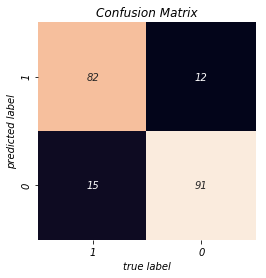

decision_tree  ROC:


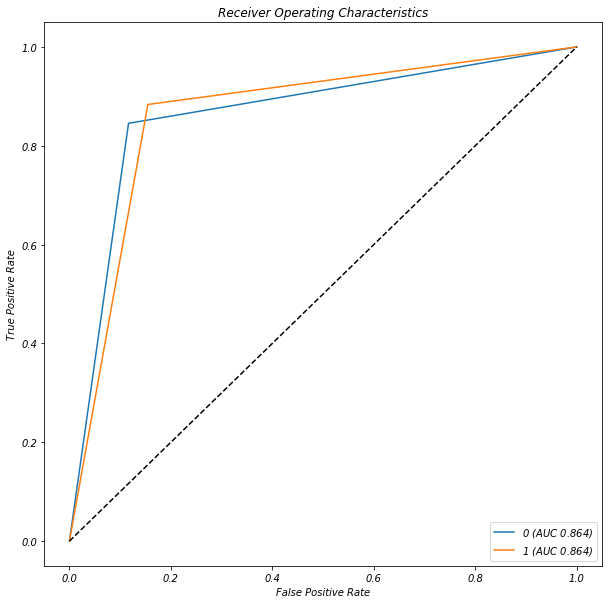

decision_tree  Regions:


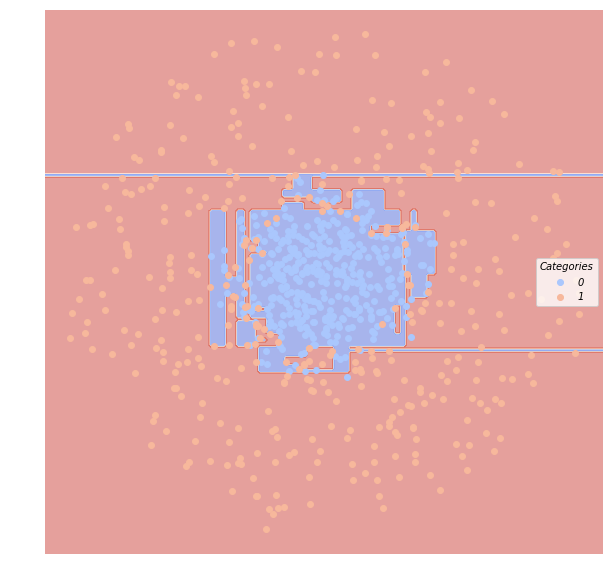

random_forest  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.878991           0.836754        0.12   0.901099  0.845361
1         0.878991           0.832031        0.12   0.862385  0.912621
random_forest  Confusion Matrix:


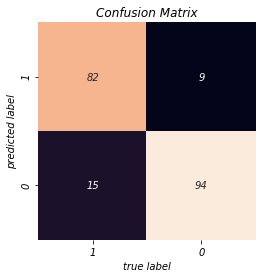

random_forest  ROC:


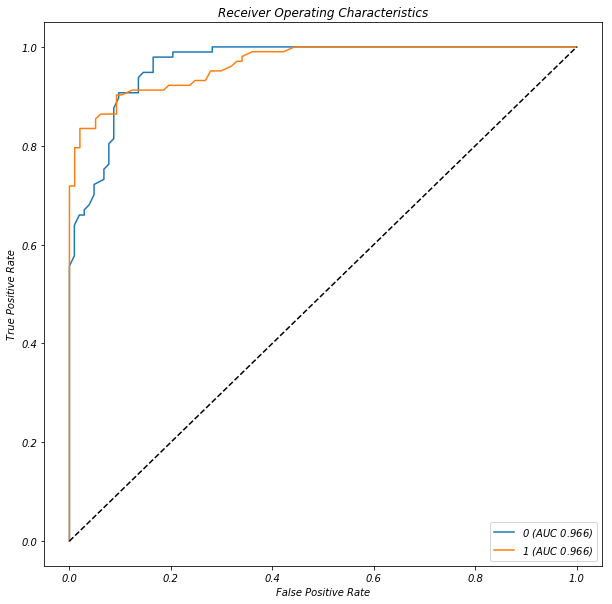

random_forest  Regions:


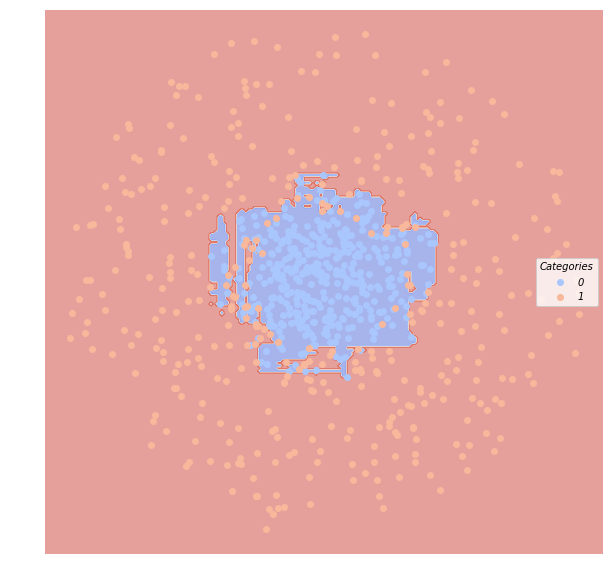

neural_network  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.881694           0.813221        0.12   0.834862  0.938144
1         0.881694           0.860831        0.12   0.934066  0.825243
neural_network  Confusion Matrix:


/Users/gaomingtao/anaconda3/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:617: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


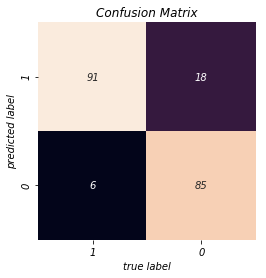

neural_network  ROC:


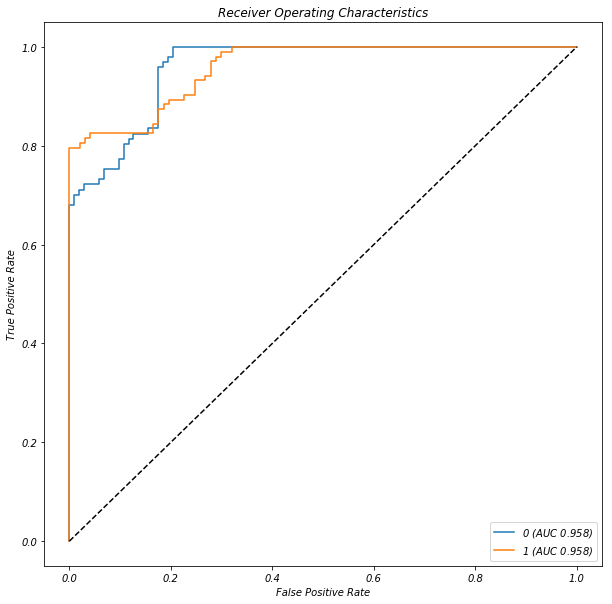

neural_network  Regions:


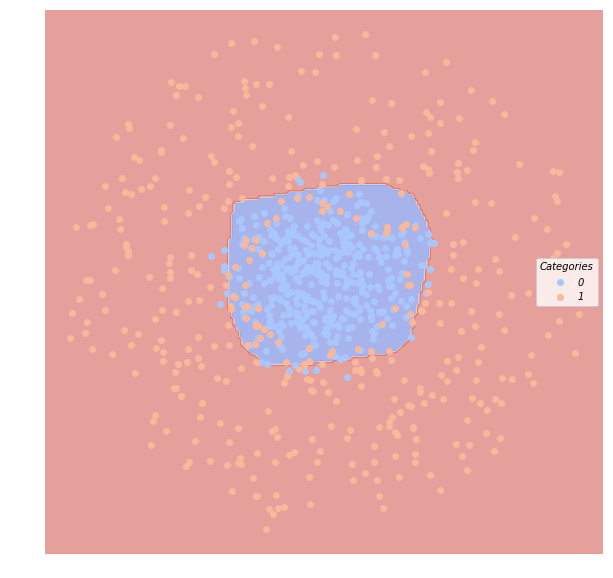

boosting  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.864428           0.812442       0.135   0.872340  0.845361
1         0.864428           0.818472       0.135   0.858491  0.883495
boosting  Confusion Matrix:


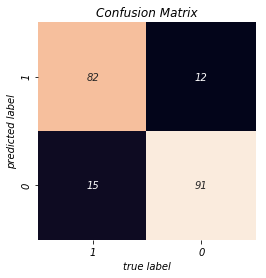

boosting  ROC:


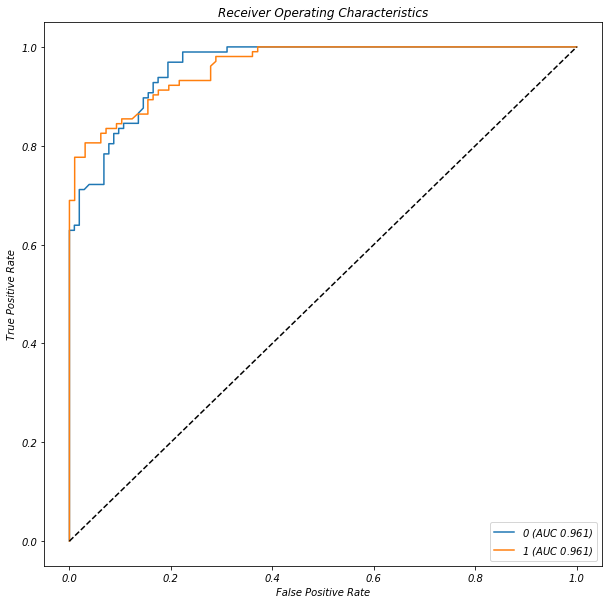

boosting  Regions:


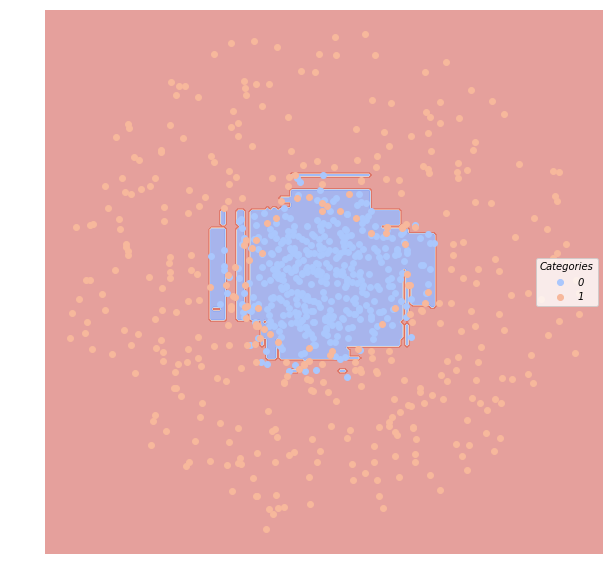

In [19]:
eval3 = all_model_classify(dfTrain3, dfTest3)

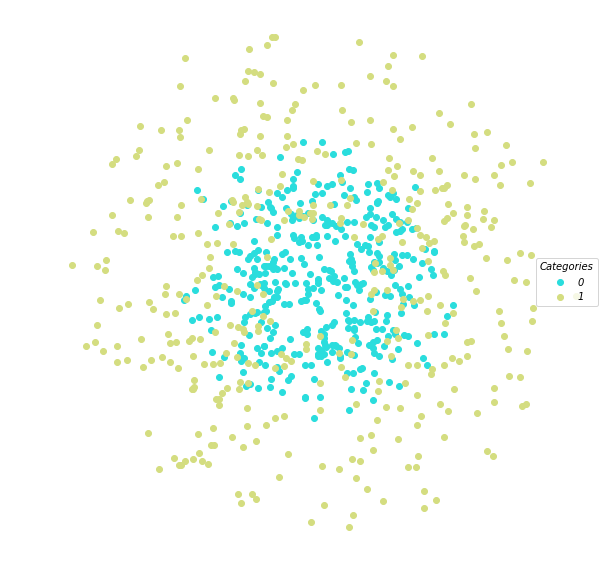

In [20]:
lucem_illud.plotter(dfTrain8)

bayes  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.826631           0.747839       0.175   0.773913  0.908163
1         0.826631           0.796205       0.175   0.894118  0.745098
bayes  Confusion Matrix:


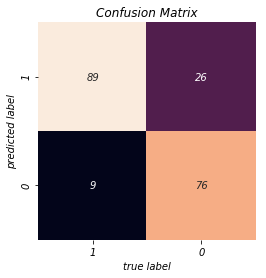

bayes  ROC:


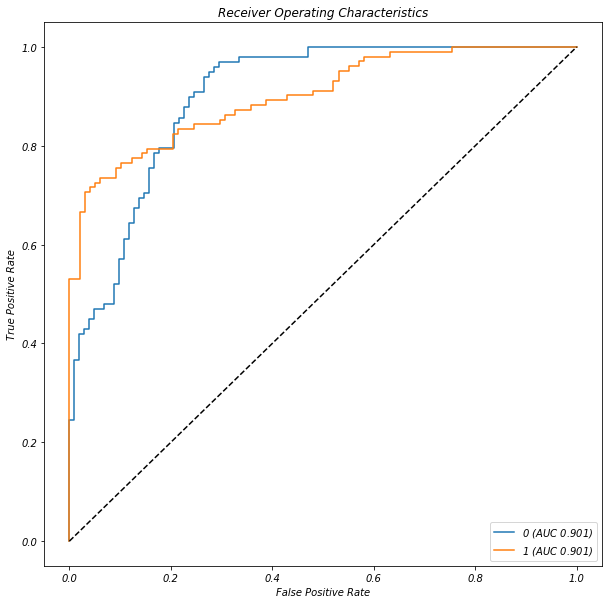

bayes  Regions:


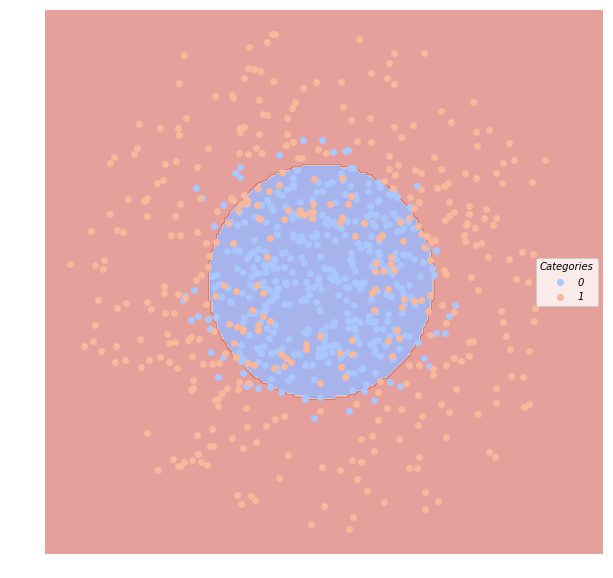

svm_linear  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.579132           0.534078       0.425   0.546099  0.785714
1         0.579132           0.559947       0.425   0.644068  0.372549
svm_linear  Confusion Matrix:


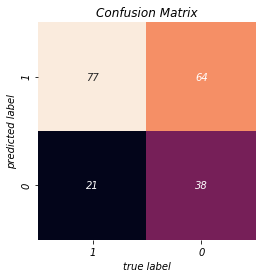

svm_linear  ROC:


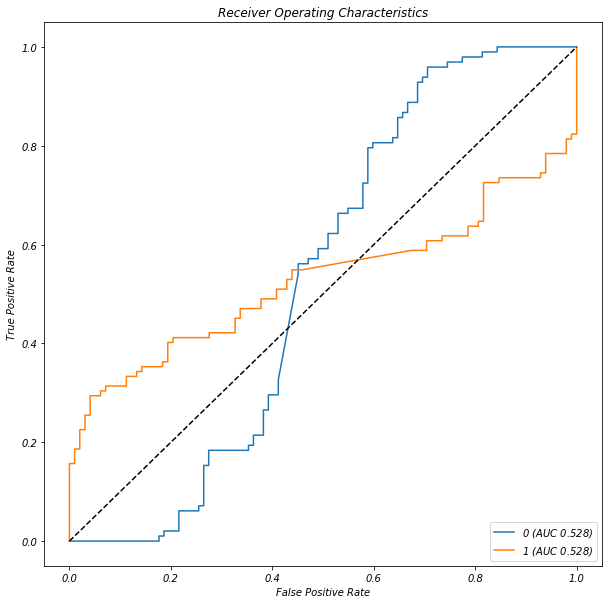

svm_linear  Regions:


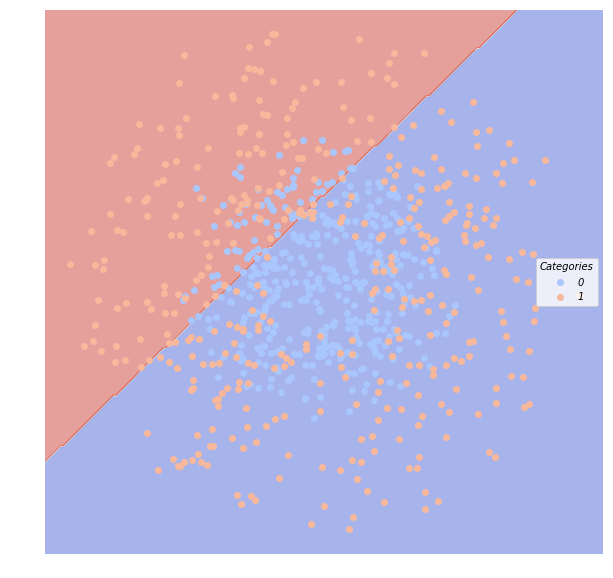

svm_poly  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.539216           0.510417        0.47   0.510417  1.000000
1         0.539216           0.548431        0.47   1.000000  0.078431
svm_poly  Confusion Matrix:


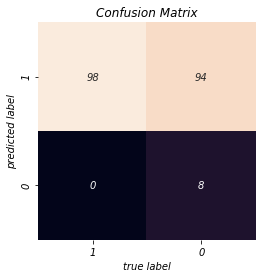

svm_poly  ROC:


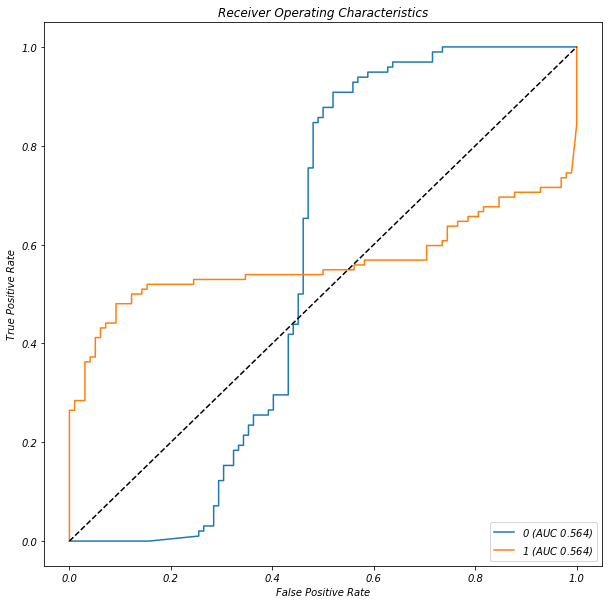

svm_poly  Regions:


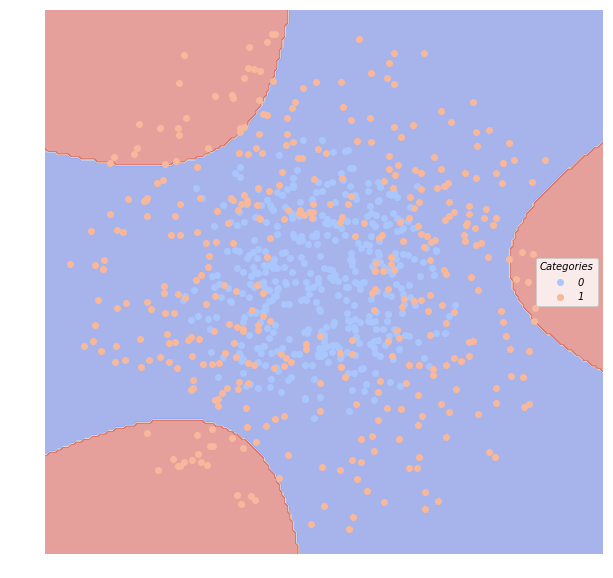

knn  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.756403           0.677469       0.245   0.716814  0.826531
1         0.756403           0.712175       0.245   0.804598  0.686275
knn  Confusion Matrix:


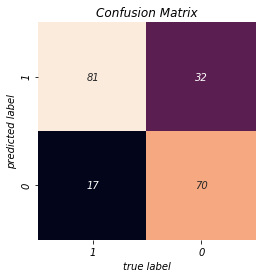

knn  ROC:


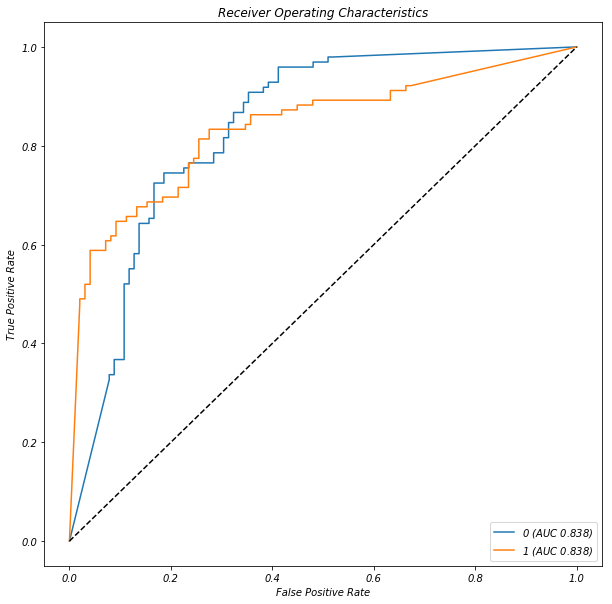

knn  Regions:


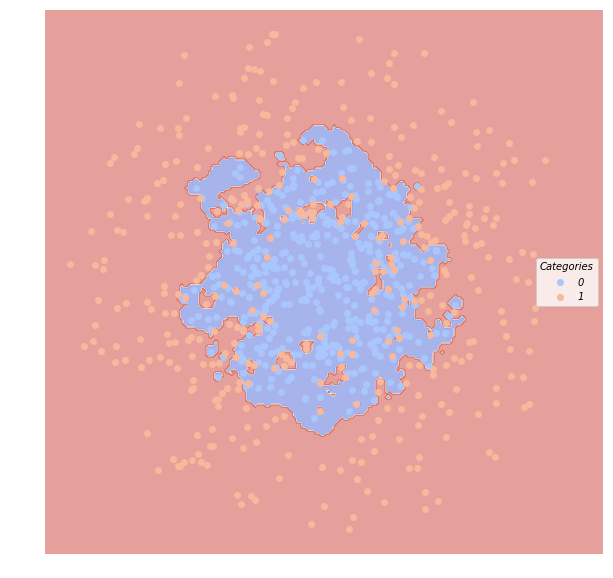

classical_reg  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.486094           0.483228       0.515   0.477477  0.540816
1         0.486094           0.503263       0.515   0.494382  0.431373
classical_reg  Confusion Matrix:


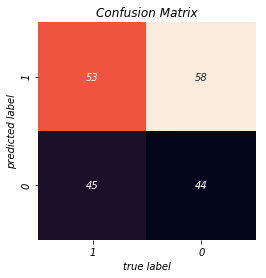

classical_reg  ROC:


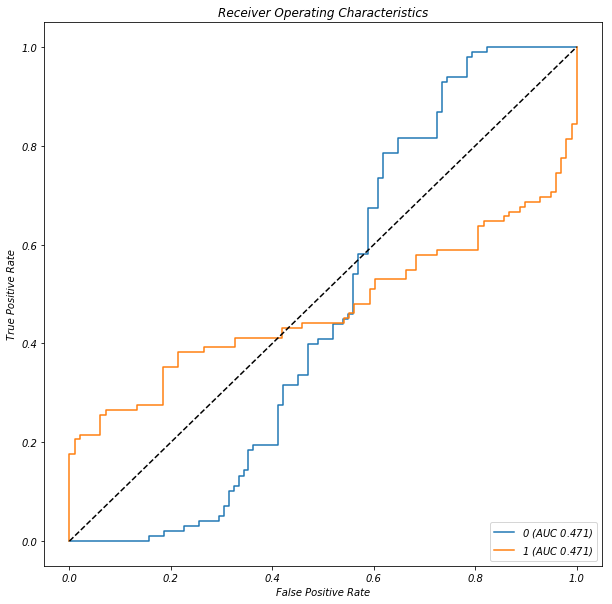

classical_reg  Regions:


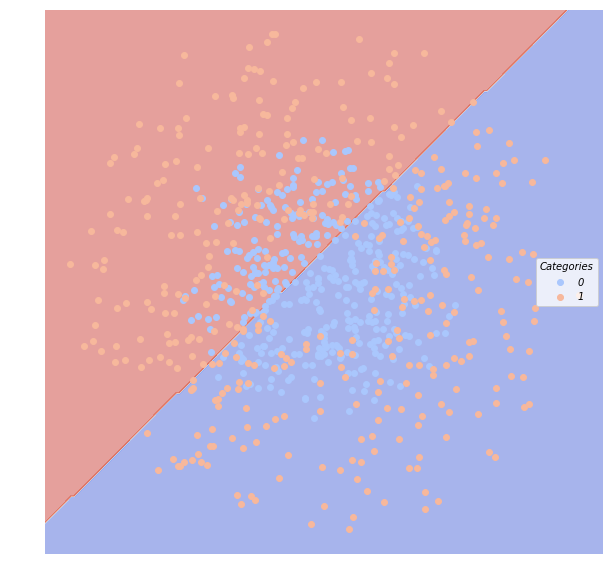

decision_tree  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.755602           0.681190       0.245   0.733333  0.785714
1         0.755602           0.705119       0.245   0.778947  0.725490
decision_tree  Confusion Matrix:


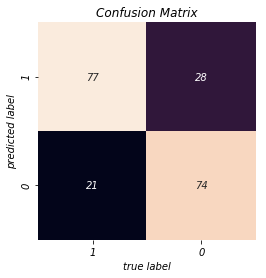

decision_tree  ROC:


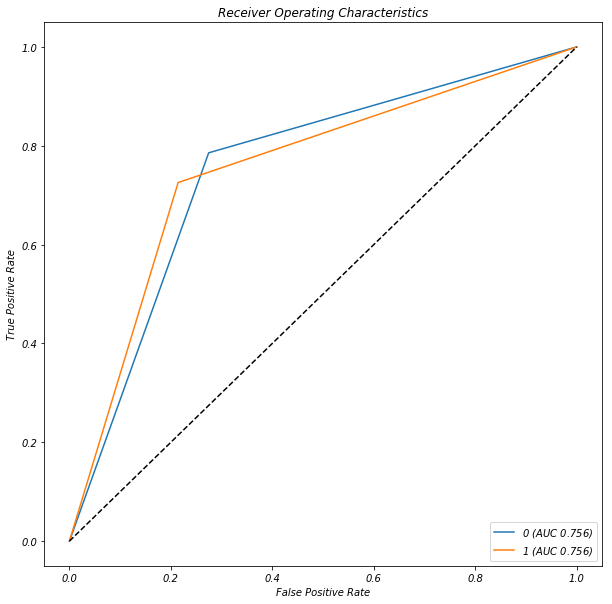

decision_tree  Regions:


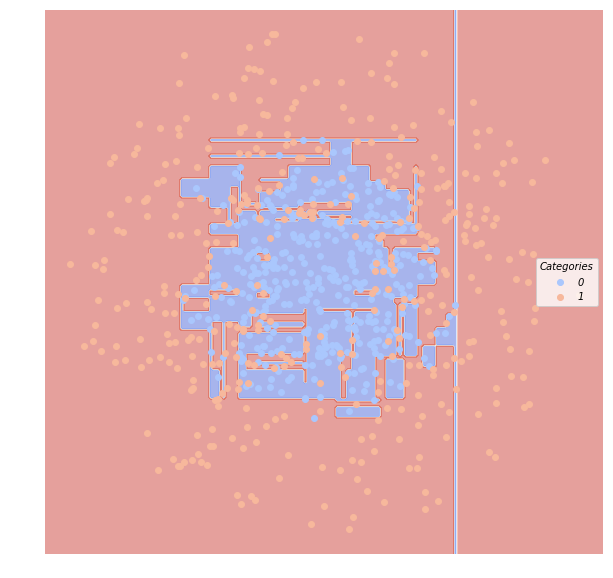

random_forest  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.801921           0.719664         0.2   0.745763  0.897959
1         0.801921           0.769799         0.2   0.878049  0.705882
random_forest  Confusion Matrix:


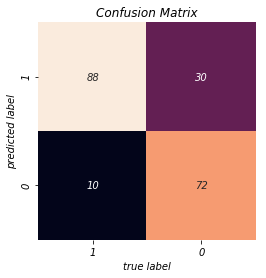

random_forest  ROC:


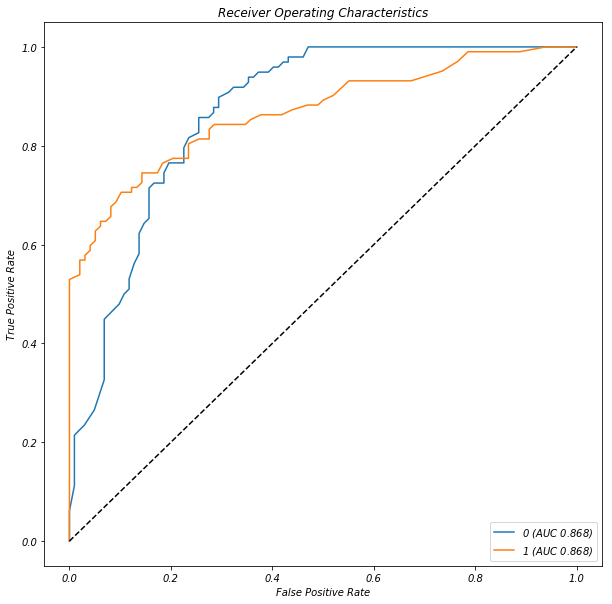

random_forest  Regions:


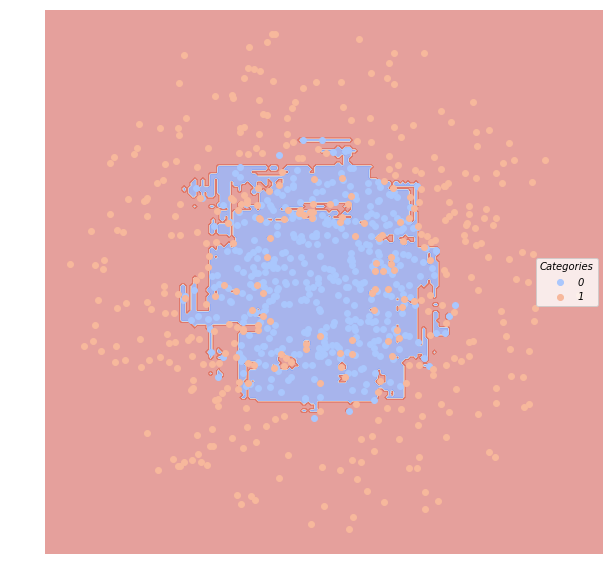

neural_network  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.836635           0.758722       0.165   0.782609  0.918367
1         0.836635           0.808852       0.165   0.905882  0.754902
neural_network  Confusion Matrix:


/Users/gaomingtao/anaconda3/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:617: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


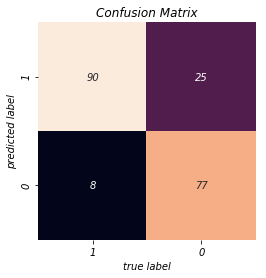

neural_network  ROC:


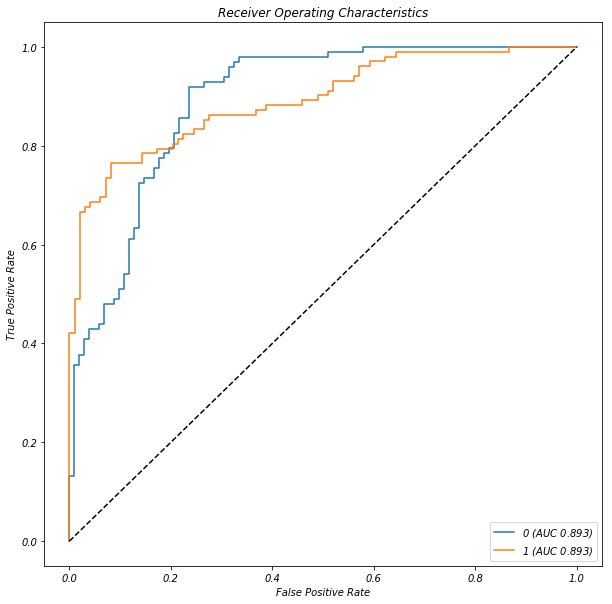

neural_network  Regions:


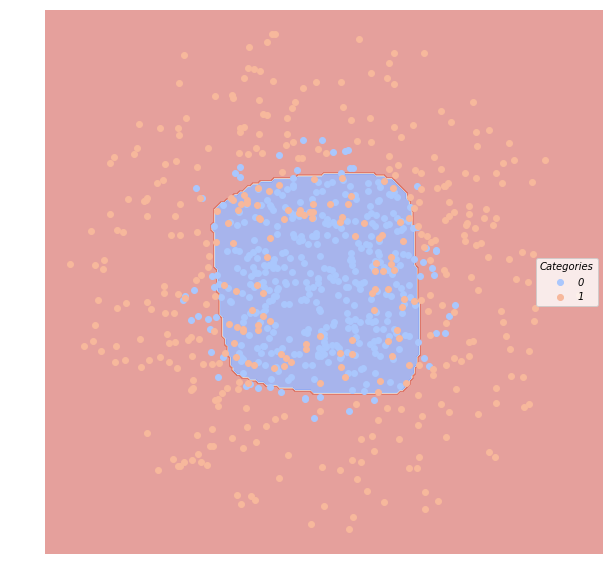

boosting  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.821929           0.740450        0.18   0.762712  0.918367
1         0.821929           0.794711        0.18   0.902439  0.725490
boosting  Confusion Matrix:


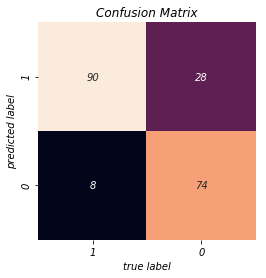

boosting  ROC:


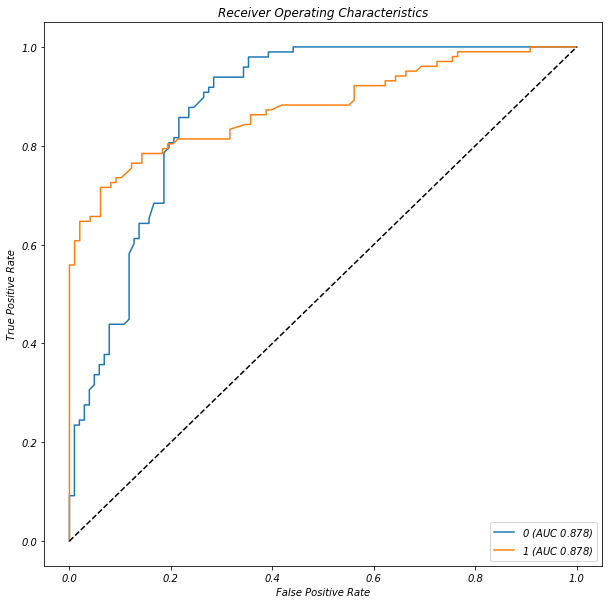

boosting  Regions:


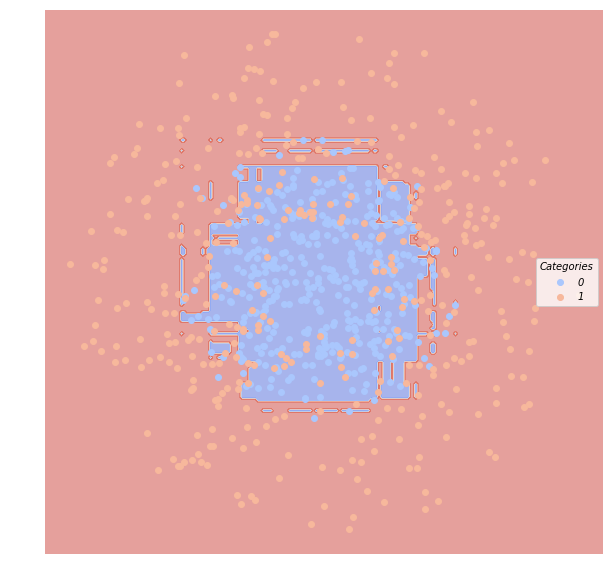

In [21]:
eval8 = all_model_classify(dfTrain8, dfTest8)

#### (5) multiBlobs

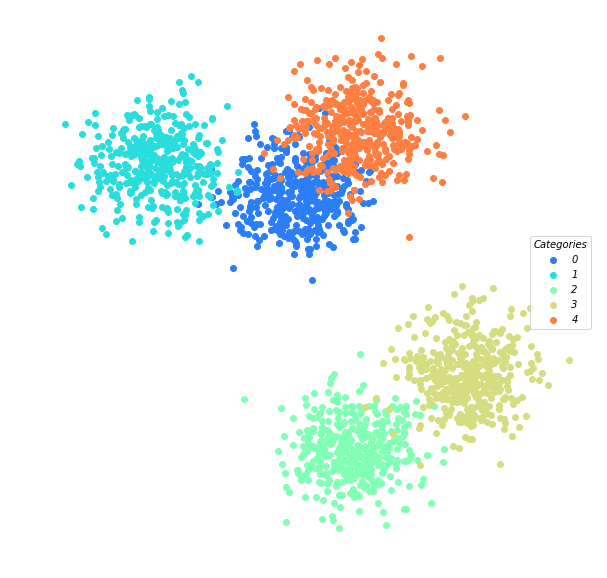

In [22]:
lucem_illud.plotter(dfTrain4)

bayes  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.921970           0.790830       0.046   0.880435  0.870968
1         0.994505           0.991011       0.002   1.000000  0.989011
2         0.983916           0.961283       0.010   0.981818  0.972973
3         0.986914           0.958468       0.010   0.972477  0.981481
4         0.933565           0.808191       0.044   0.878788  0.896907
bayes  Confusion Matrix:


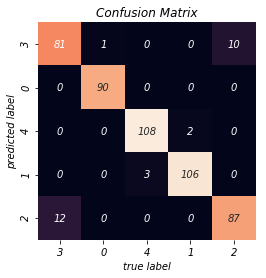

bayes  ROC:


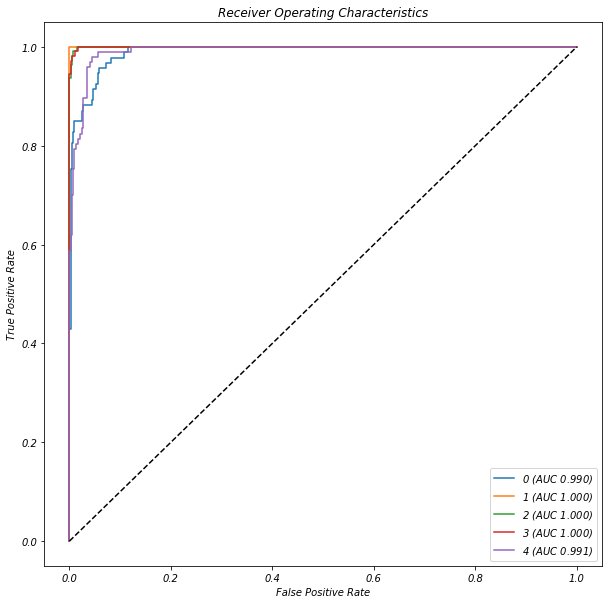

bayes  Regions:


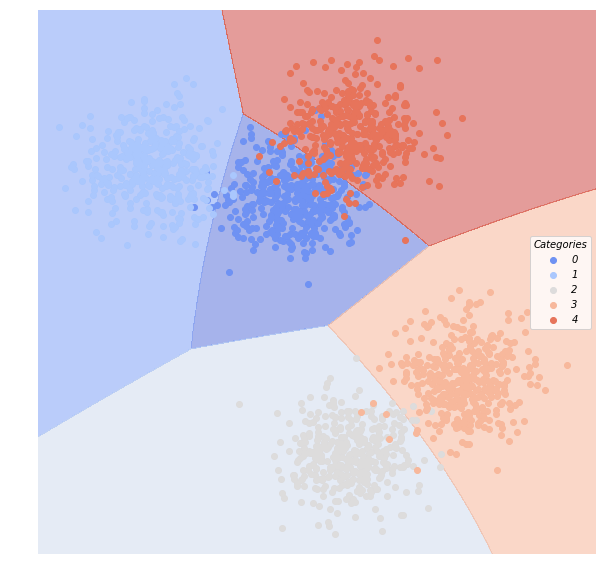

svm_linear  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.926118           0.791160       0.046   0.872340  0.881720
1         0.989011           0.982022       0.004   1.000000  0.978022
2         0.987135           0.959679       0.010   0.973214  0.981982
3         0.983560           0.960050       0.010   0.981308  0.972222
4         0.934806           0.816234       0.042   0.887755  0.896907
svm_linear  Confusion Matrix:


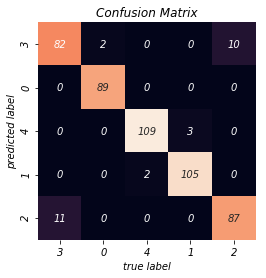

svm_linear  ROC:


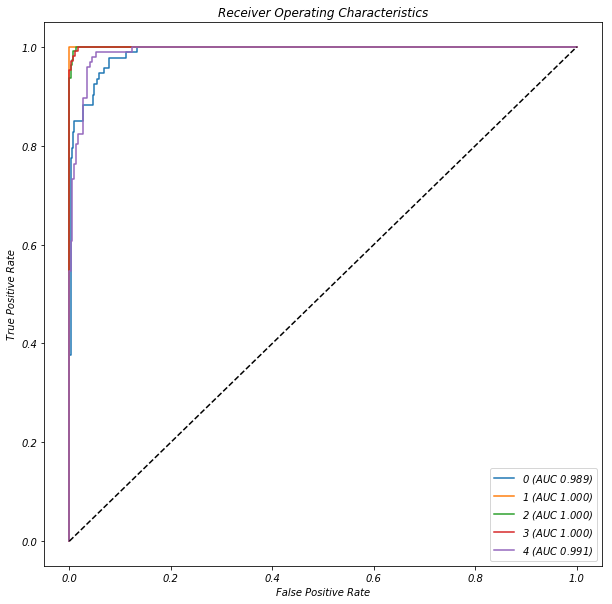

svm_linear  Regions:


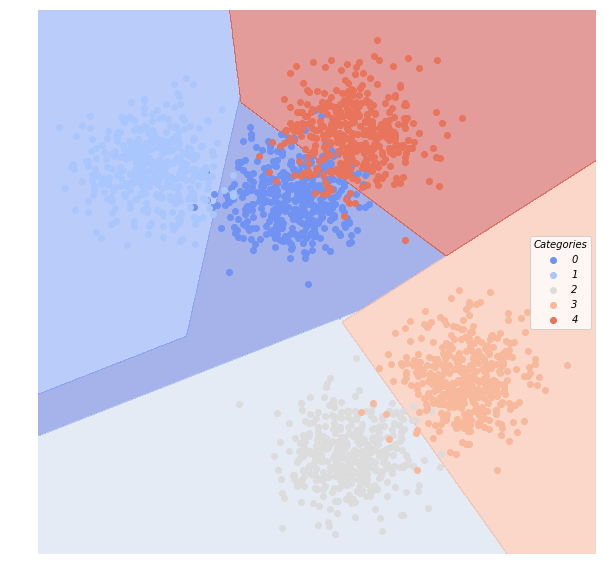

svm_poly  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.927347           0.799431       0.044   0.881720  0.881720
1         0.994505           0.991011       0.002   1.000000  0.989011
2         0.987135           0.959679       0.010   0.973214  0.981982
3         0.983560           0.960050       0.010   0.981308  0.972222
4         0.934806           0.816234       0.042   0.887755  0.896907
svm_poly  Confusion Matrix:


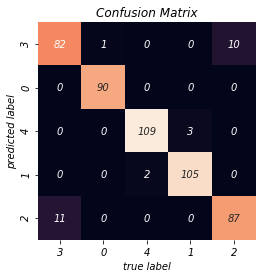

svm_poly  ROC:


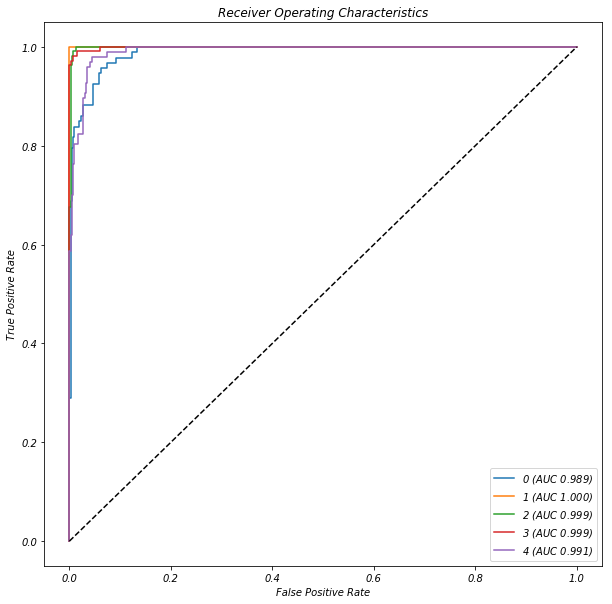

svm_poly  Regions:


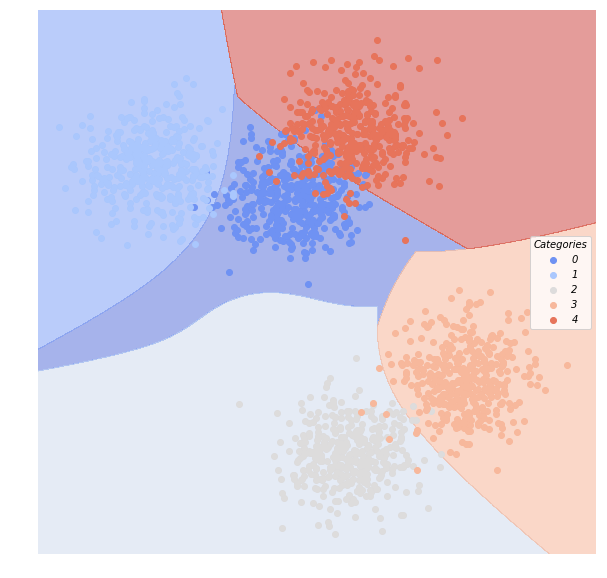

knn  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.927347           0.799431       0.044   0.881720  0.881720
1         0.994505           0.991011       0.002   1.000000  0.989011
2         0.981345           0.944224       0.014   0.964286  0.972973
3         0.977655           0.943964       0.014   0.971963  0.962963
4         0.934806           0.816234       0.042   0.887755  0.896907
knn  Confusion Matrix:


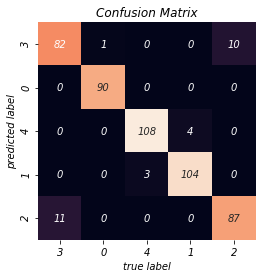

knn  ROC:


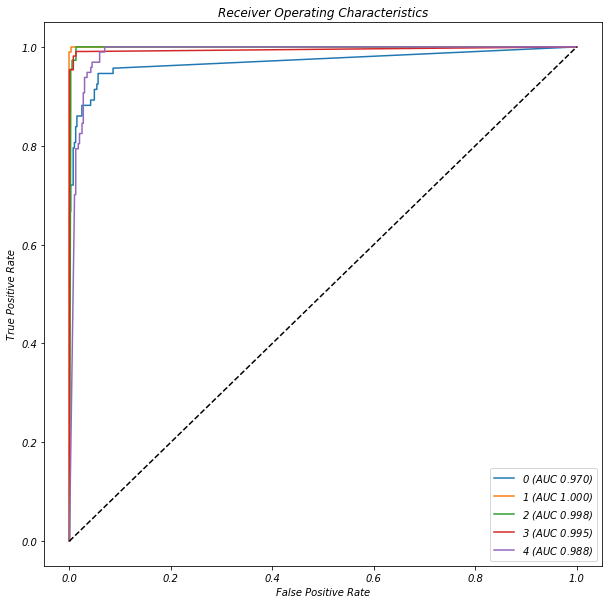

knn  Regions:


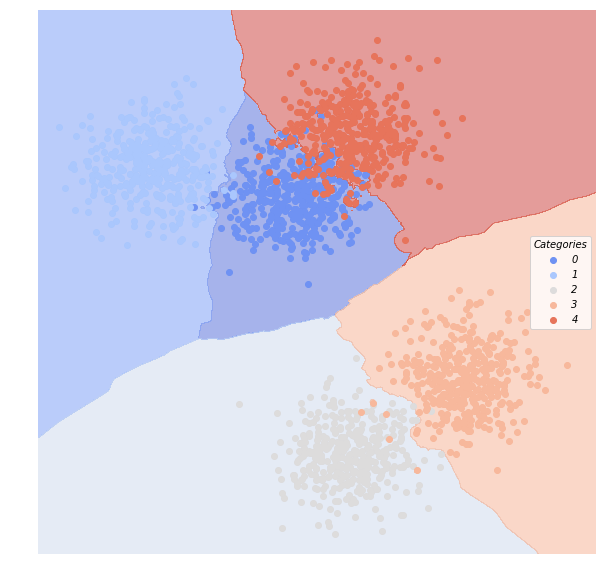

classical_reg  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.920742           0.782585       0.048   0.870968  0.870968
1         0.989011           0.982022       0.004   1.000000  0.978022
2         0.982630           0.952676       0.012   0.972973  0.972973
3         0.982285           0.951216       0.012   0.972222  0.972222
4         0.933565           0.808191       0.044   0.878788  0.896907
classical_reg  Confusion Matrix:


/Users/gaomingtao/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


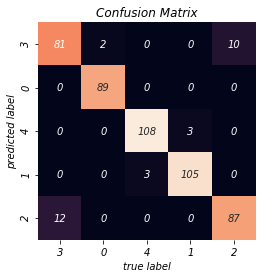

classical_reg  ROC:


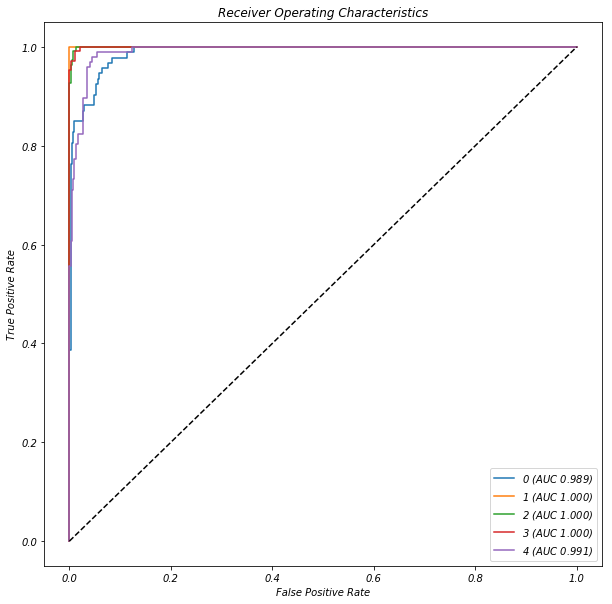

classical_reg  Regions:


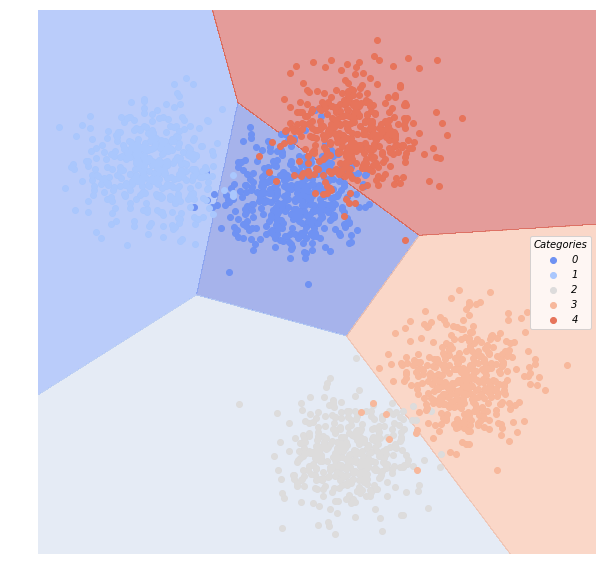

decision_tree  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.884798           0.708043       0.066   0.833333  0.806452
1         0.993283           0.980143       0.004   0.989011  0.989011
2         0.971051           0.921939       0.020   0.954955  0.954955
3         0.975104           0.926790       0.018   0.954128  0.962963
4         0.907984           0.745380       0.060   0.838384  0.855670
decision_tree  Confusion Matrix:


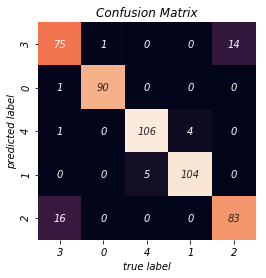

decision_tree  ROC:


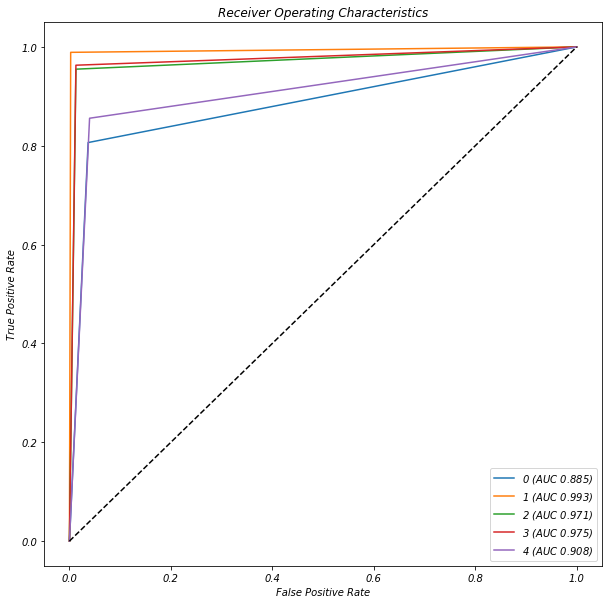

decision_tree  Regions:


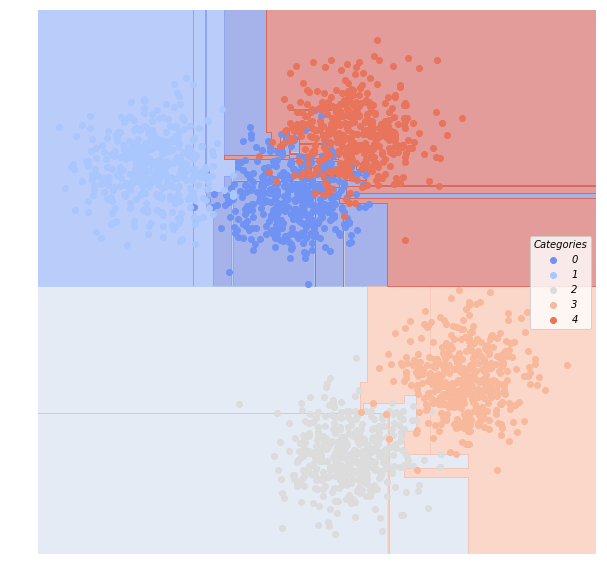

random_forest  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.918285           0.766615       0.052   0.852632  0.870968
1         0.994505           0.991011       0.002   1.000000  0.989011
2         0.976841           0.937227       0.016   0.963964  0.963964
3         0.981009           0.942544       0.014   0.963303  0.972222
4         0.919342           0.791708       0.048   0.884211  0.865979
random_forest  Confusion Matrix:


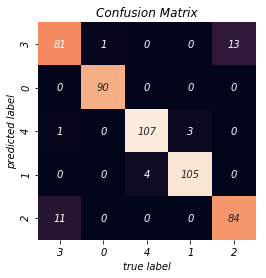

random_forest  ROC:


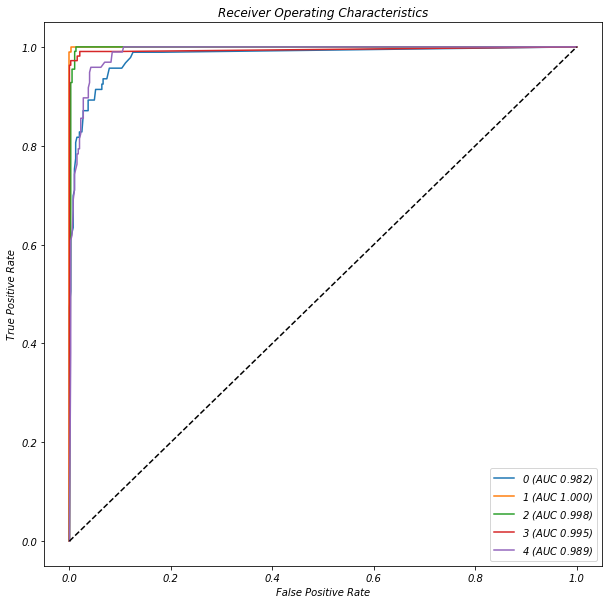

random_forest  Regions:


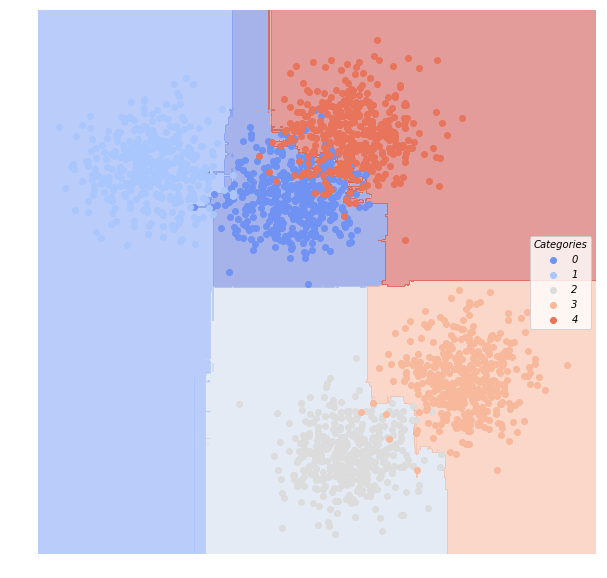

neural_network  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.928575           0.807881       0.042   0.891304  0.881720
1         1.000000           1.000000       0.000   1.000000  1.000000
2         0.987135           0.959679       0.010   0.973214  0.981982
3         0.983560           0.960050       0.010   0.981308  0.972222
4         0.934806           0.816234       0.042   0.887755  0.896907
neural_network  Confusion Matrix:


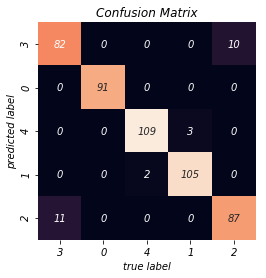

neural_network  ROC:


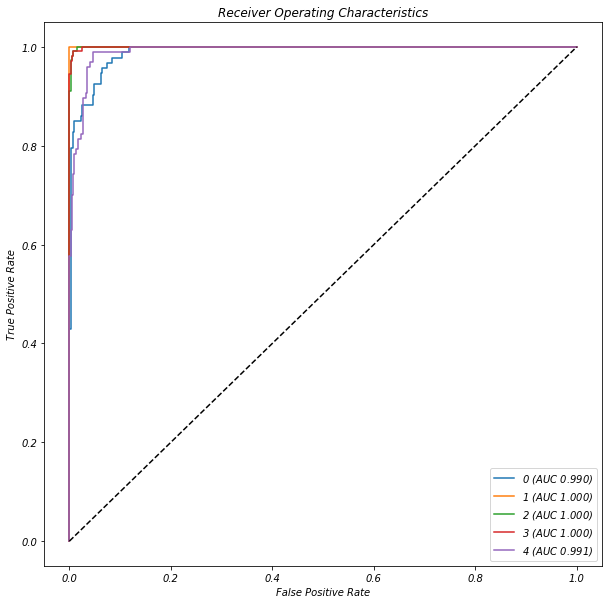

neural_network  Regions:


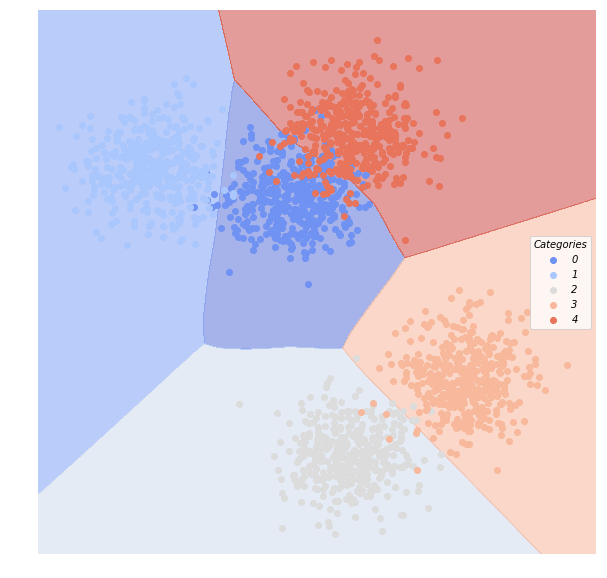

boosting  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.902156           0.741080       0.058   0.847826  0.838710
1         0.993283           0.980143       0.004   0.989011  0.989011
2         0.988420           0.968289       0.008   0.981982  0.981982
3         0.983560           0.960050       0.010   0.981308  0.972222
4         0.920775           0.776369       0.052   0.858586  0.876289
boosting  Confusion Matrix:


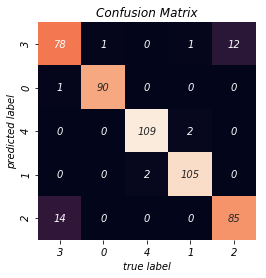

boosting  ROC:


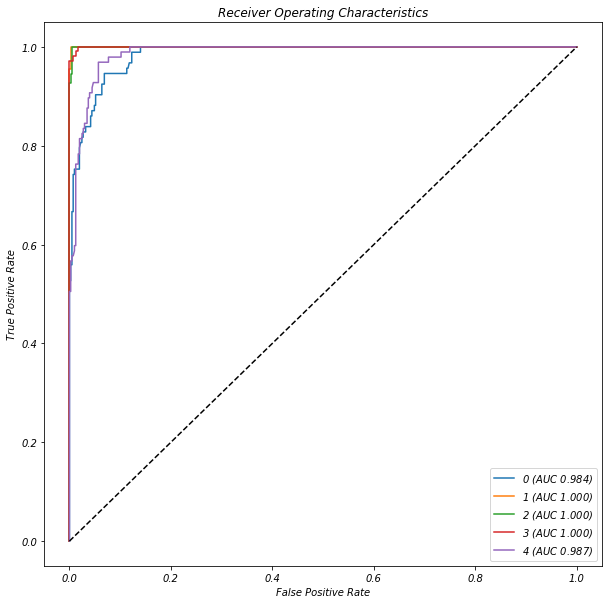

boosting  Regions:


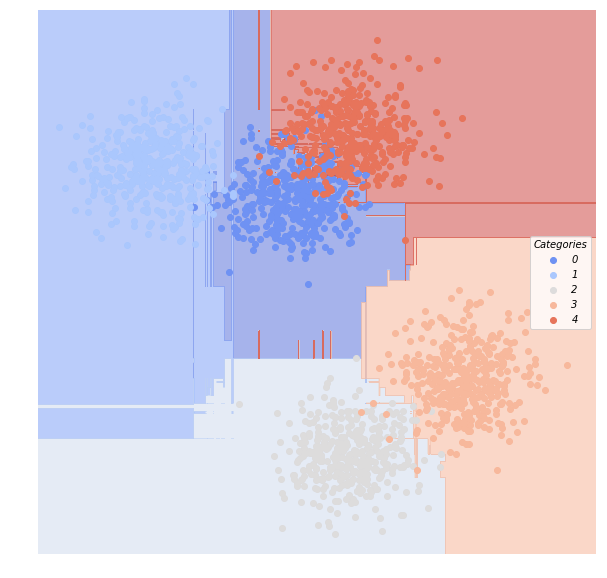

In [23]:
eval4 = all_model_classify(dfTrain4, dfTest4)

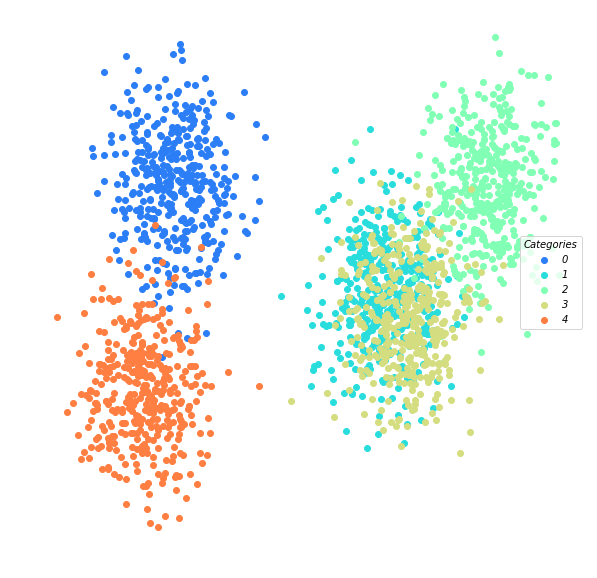

In [ ]:
lucem_illud.plotter(dfTrain9)

bayes  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.981546           0.921784       0.018   0.935780  0.980769
1         0.810268           0.480900       0.126   0.606061  0.714286
2         0.981973           0.922802       0.016   0.938776  0.978723
3         0.764409           0.514134       0.138   0.719101  0.592593
4         0.965618           0.932528       0.018   0.980952  0.936364
bayes  Confusion Matrix:


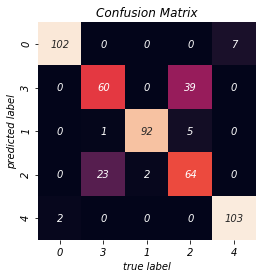

bayes  ROC:


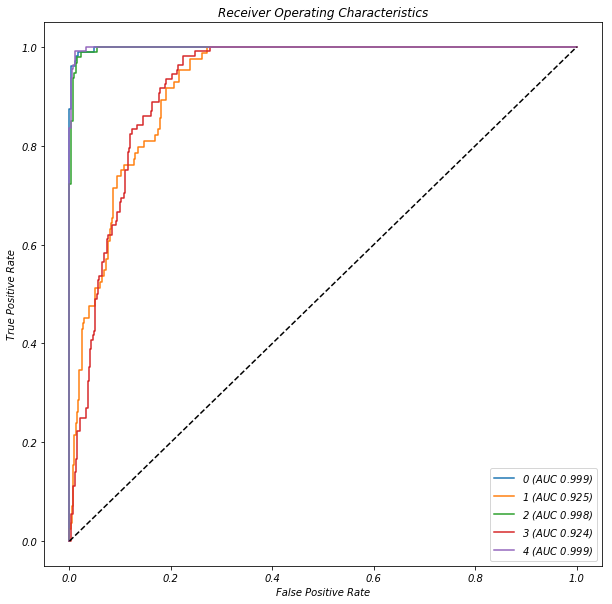

bayes  Regions:


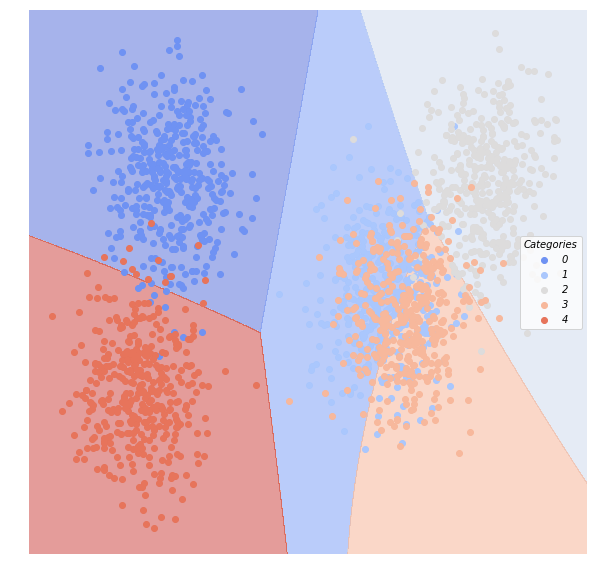

svm_linear  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.986354           0.929360       0.016   0.936364  0.990385
1         0.804315           0.472862       0.128   0.602041  0.702381
2         0.976653           0.914204       0.018   0.938144  0.968085
3         0.767763           0.515894       0.138   0.714286  0.601852
4         0.966900           0.941360       0.016   0.990385  0.936364
svm_linear  Confusion Matrix:


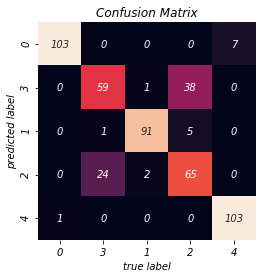

svm_linear  ROC:


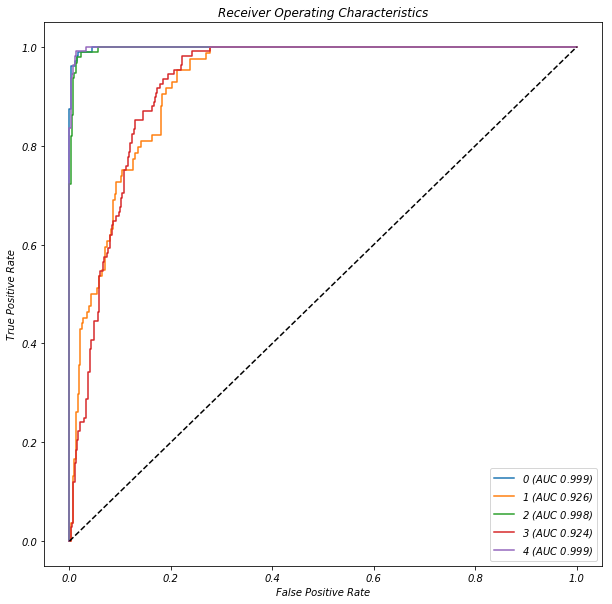

svm_linear  Regions:


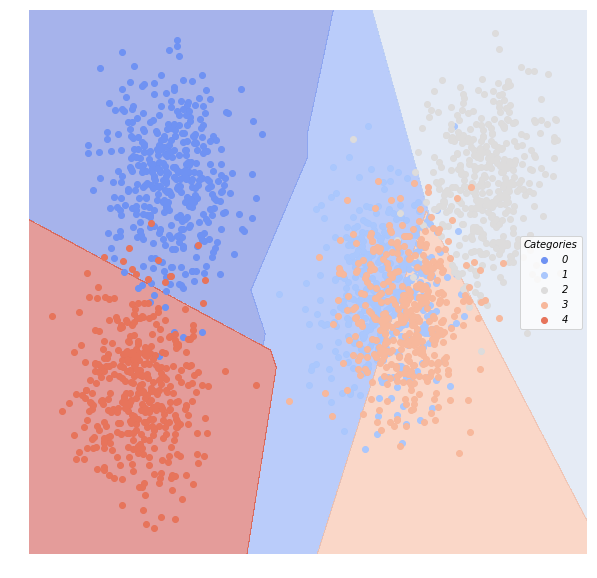

svm_poly  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.969406           0.890145       0.026   0.917431  0.961538
1         0.820685           0.438852       0.164   0.507576  0.797619
2         0.977885           0.923664       0.016   0.947917  0.968085
3         0.680745           0.417128       0.164   0.709677  0.407407
4         0.953263           0.920090       0.022   0.990099  0.909091
svm_poly  Confusion Matrix:


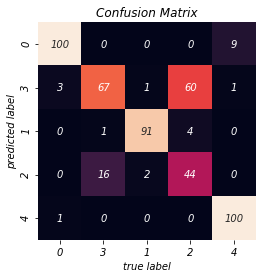

svm_poly  ROC:


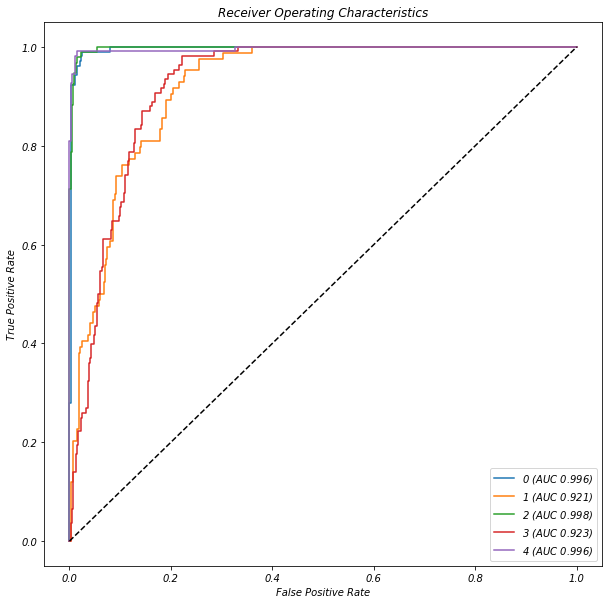

svm_poly  Regions:


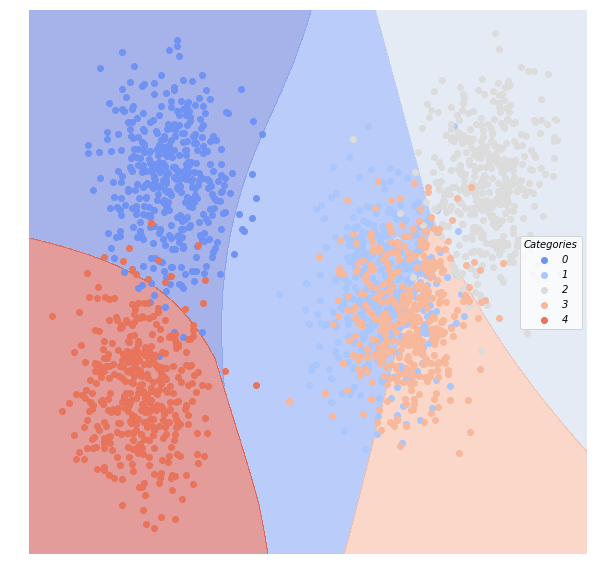

knn  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.976739           0.914209       0.020   0.935185  0.971154
1         0.769746           0.417879       0.146   0.556701  0.642857
2         0.964784           0.887770       0.024   0.927083  0.946809
3         0.729781           0.444575       0.166   0.634409  0.546296
4         0.964336           0.923863       0.020   0.971698  0.936364
knn  Confusion Matrix:


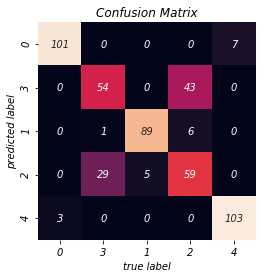

knn  ROC:


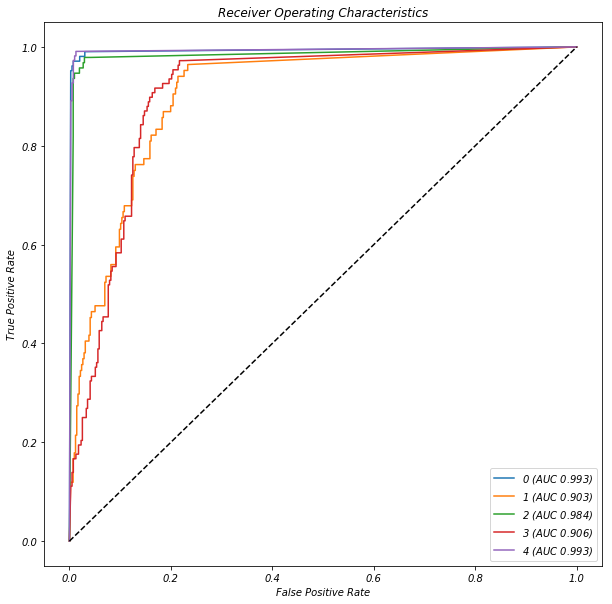

knn  Regions:


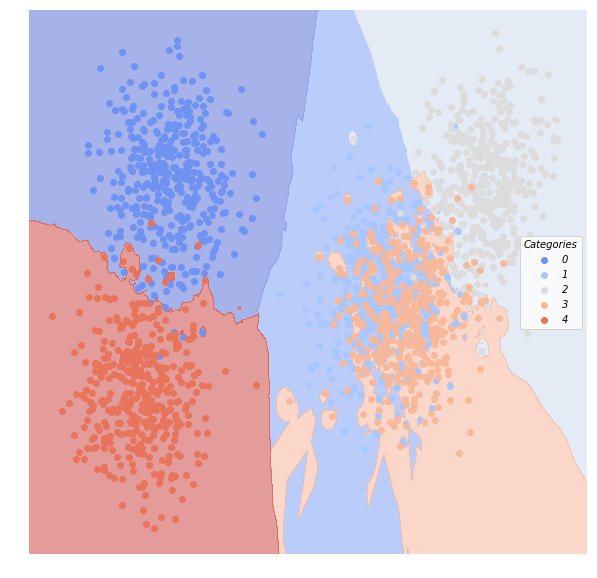

classical_reg  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.986354           0.929360       0.016   0.936364  0.990385
1         0.801912           0.464405       0.132   0.590000  0.702381
2         0.981973           0.922802       0.016   0.938776  0.978723
3         0.753874           0.496461       0.144   0.704545  0.574074
4         0.966900           0.941360       0.016   0.990385  0.936364
classical_reg  Confusion Matrix:


/Users/gaomingtao/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


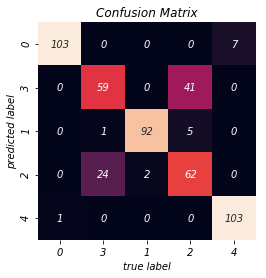

classical_reg  ROC:


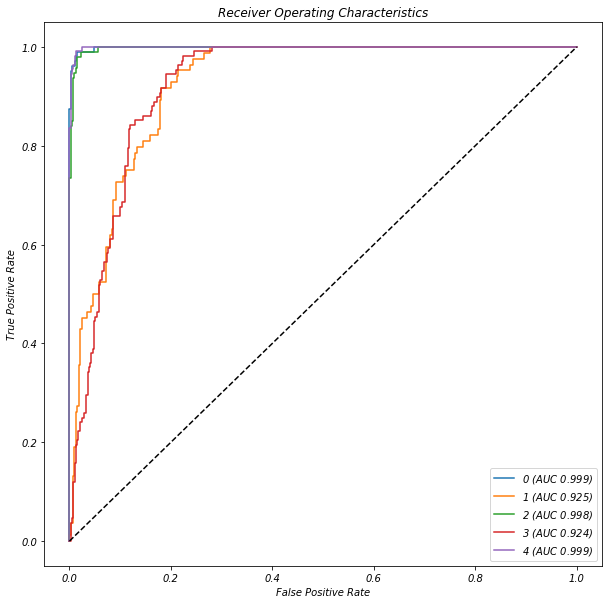

classical_reg  Regions:


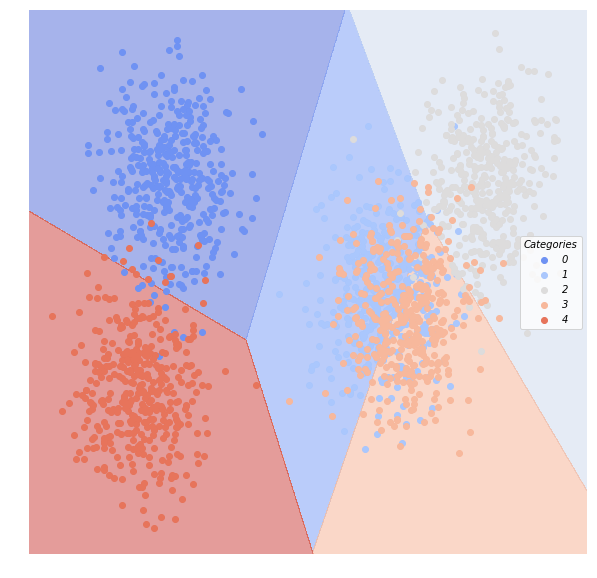

decision_tree  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.971931           0.906634       0.022   0.934579  0.961538
1         0.773352           0.429301       0.140   0.574468  0.642857
2         0.963552           0.878721       0.026   0.917526  0.946809
3         0.744945           0.466659       0.158   0.652632  0.574074
4         0.963054           0.915359       0.022   0.962617  0.936364
decision_tree  Confusion Matrix:


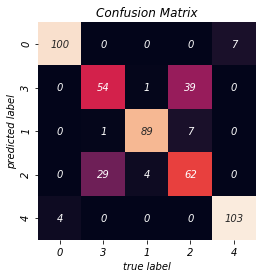

decision_tree  ROC:


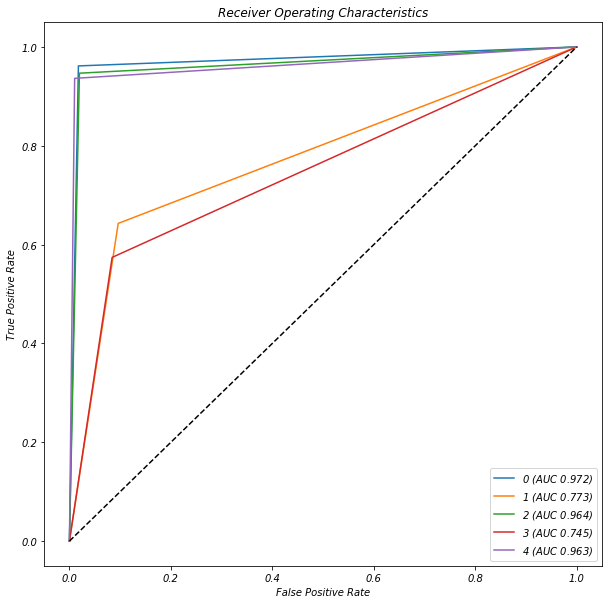

decision_tree  Regions:


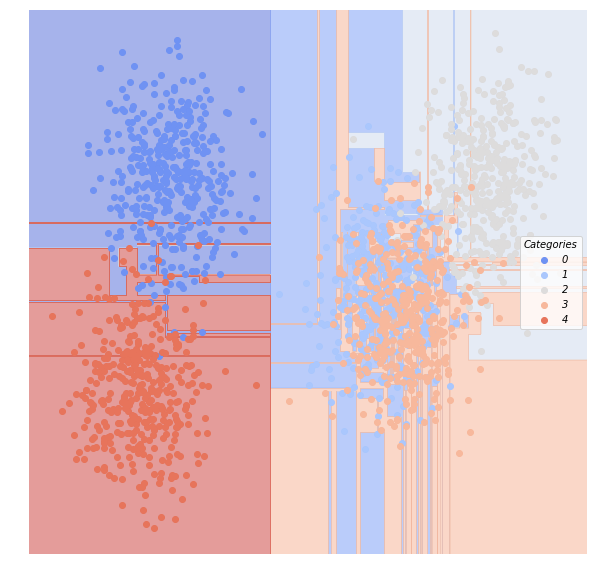

random_forest  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.976739           0.914209       0.020   0.935185  0.971154
1         0.745936           0.388020       0.154   0.537634  0.595238
2         0.966015           0.897010       0.022   0.936842  0.946809
3         0.729308           0.436136       0.172   0.612245  0.555556
4         0.964336           0.923863       0.020   0.971698  0.936364
random_forest  Confusion Matrix:


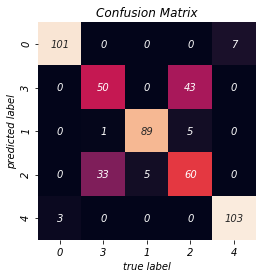

random_forest  ROC:


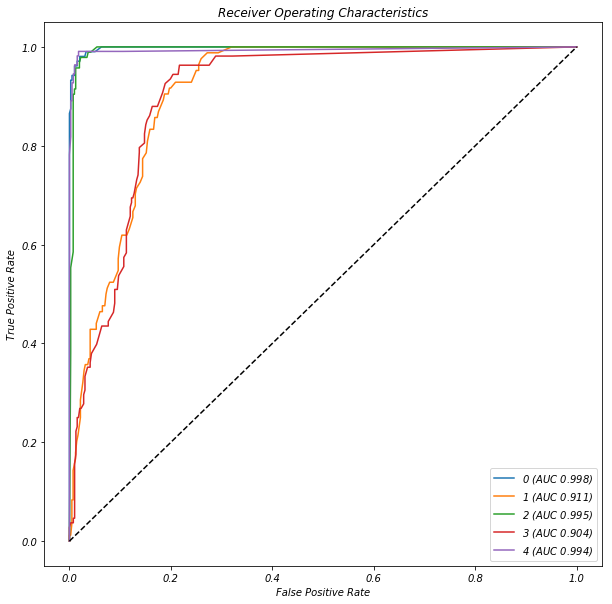

random_forest  Regions:


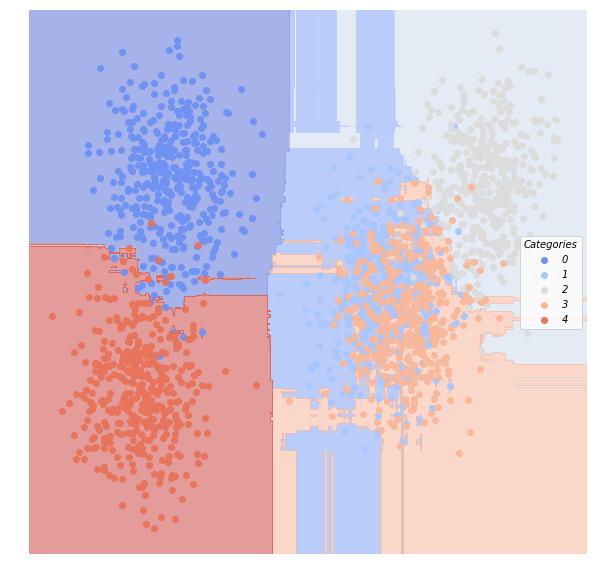

neural_network  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.982809           0.930282       0.016   0.944444  0.980769
1         0.811413           0.471939       0.132   0.586538  0.726190
2         0.976653           0.914204       0.018   0.938144  0.968085
3         0.745890           0.488157       0.146   0.705882  0.555556
4         0.970163           0.939616       0.016   0.981132  0.945455
neural_network  Confusion Matrix:


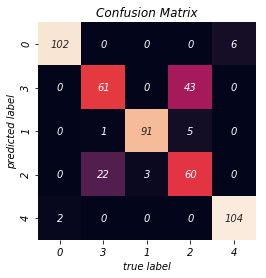

neural_network  ROC:


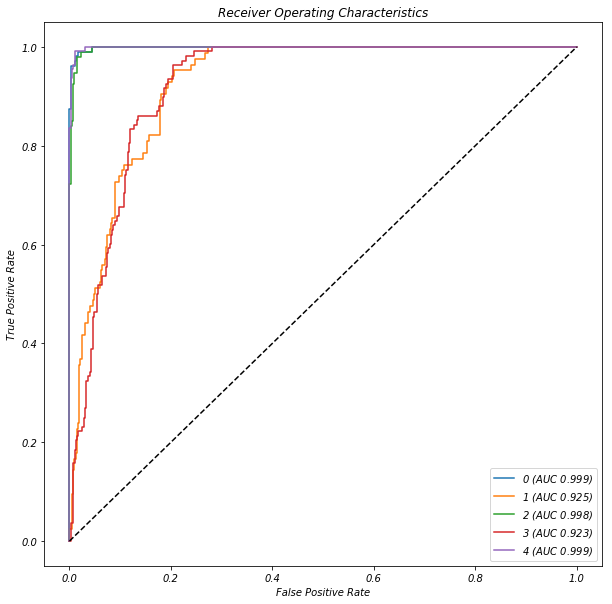

neural_network  Regions:


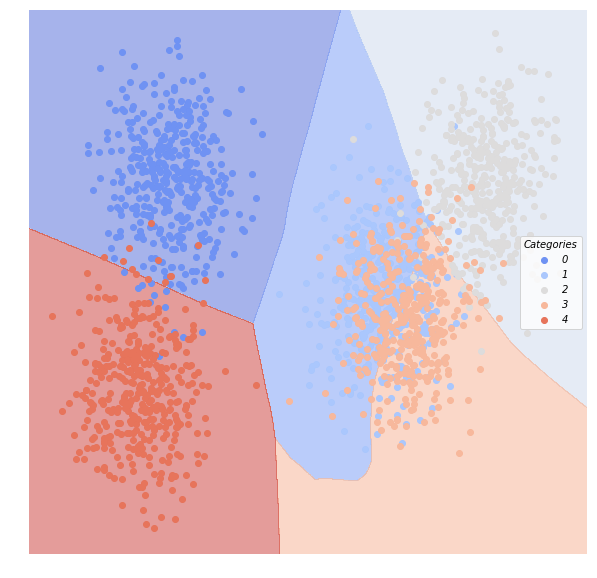

boosting  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.970668           0.898313       0.024   0.925926  0.961538
1         0.786458           0.448982       0.134   0.589474  0.666667
2         0.963552           0.878721       0.026   0.917526  0.946809
3         0.752126           0.480957       0.152   0.670213  0.583333
4         0.958508           0.908281       0.024   0.962264  0.927273
boosting  Confusion Matrix:


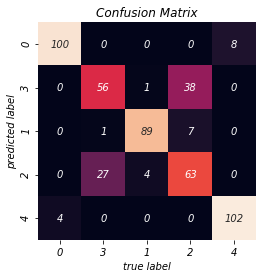

boosting  ROC:


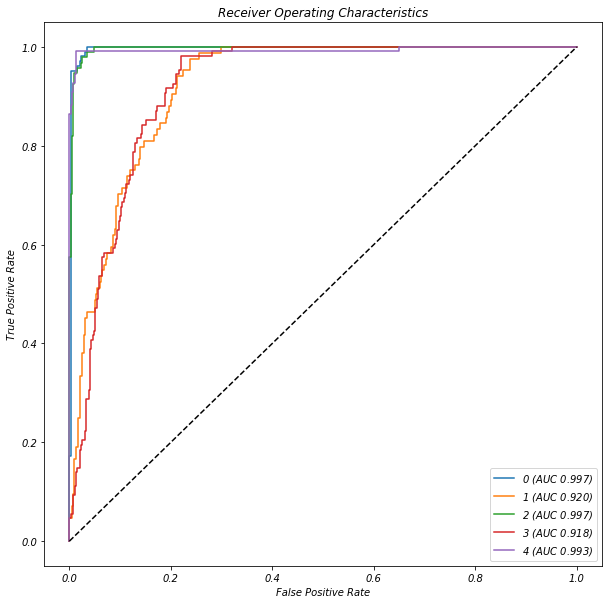

boosting  Regions:


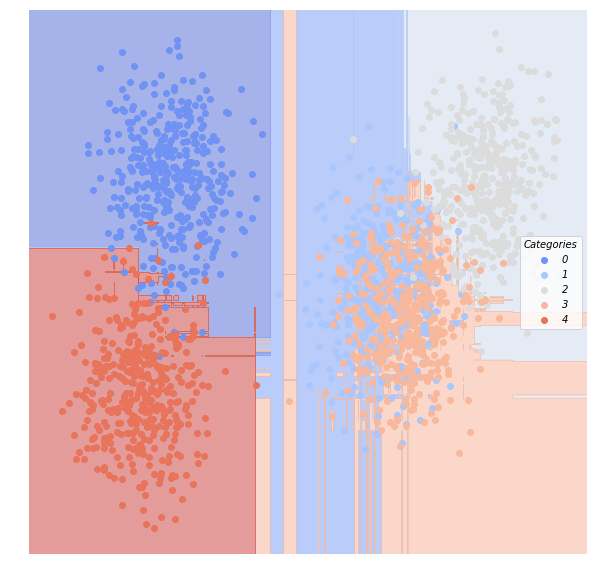

In [ ]:
eval9 = all_model_classify(dfTrain9, dfTest9)

#### Conclusion

I generated 10 distinct artifical datasets using the random, xorSplit, andSplit, targetsplit, and multiBlobs functions, with two noise parameters: 0.2 and 0.4. Error rate produced by each classifer will be used to measure which classifier is the best one to capture the pattern.

The random data generator produces a pattern that two classes are randomly distributed across all dimensions. Since there is no data pattern associated with random points, it hard to find the precise decision boundary according to any rules. All the classifiers produce an error rate at around 0.5. When the noise parameter is set at 0.2, polynomial SVM, knn, decision tree, and random forest produced an error rate slightly below 0.5. When the noise parameter is set to 0.4, knn model has the lowest error rate. Overall, there is no "best" model for random datasets.

The data points generated by andSplit are linearly split along one of the dimensions with some overlap in the middle. Therefore, a linear classification model works best in this case. For both 0.2 and o.4 noise levels, logistic regression (linear SVM and classic regression) produced the lowest error rate. All classifiers have close performance with roughly 0.1-0.2 error rate.

The xorSplit dataset shows a pattern that the two classes are split and distributed oppositely at each quadrant. Therefore, linear models did not perform well in this case. SVM_poly, knn, decision tree, random forest, neural network and boosting perform much better classification compared with bayes, SVM_linear and classical regression. For both 0.2 and o.4 noise levels, neural network classifers produced the lowest error rate. knn, decision tree, and random forest classifers also worked well when the noise parameter is 0.2, but they generated higher error rate when noise level is higher.

The targetSplit dataset has one class nested within the other class of data points. Since data points form concentric circles, linear classifiers cannot capture the pattern. For both 0.2 and o.4 noise levels, gaussian, knn, and neural network produced the lowest error rate. With less noise, neural network is the best model while with more noise, boosting is the best model. By looking at the decision boundaries of these classifiers, it is clear that these methods group data points into circles, which ensures high accuracy and density of points in the circles.

The multiBlobs dataset separates 5 classes as bivariate Gaussians and places them at random locations. All classifiers performed well in this case. Decision tree has the worst performance and other classifiers have similar performance on the classification task. When noise level increases to 0.4, the method produced higher error rates. At both noise levels, neural network and boosting classifier worked well and produced relatively low error rate.

### Empirical Datasets

#### (1) Newsgroup

In [ ]:
newsgroups_dfTrain, newsgroups_dfTest = lucem_illud.trainTestSplit(lucem_illud.loadNewsGroups())

Loading data for: comp.sys.mac.hardware
Loading data for: comp.windows.x
Loading data for: misc.forsale
Loading data for: rec.autos
Converting to vectors


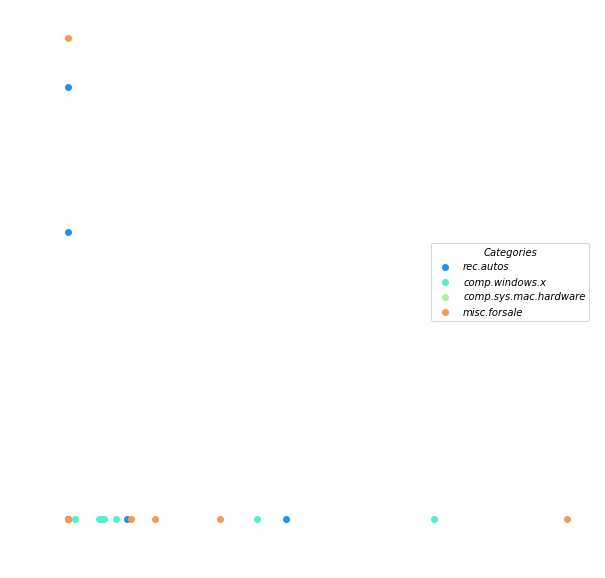

In [ ]:
lucem_illud.plotter(newsgroups_dfTrain)

bayes  Evaluation:
                            AUC  Average_Precision  Error_Rate  Precision  \
Category                                                                    
rec.autos              0.879001           0.711672    0.093617   0.809917   
comp.windows.x         0.909311           0.720910    0.087234   0.772727   
comp.sys.mac.hardware  0.818053           0.627916    0.144681   0.753846   
misc.forsale           0.794793           0.574855    0.121277   0.770115   

                         Recall  
Category                         
rec.autos              0.823529  
comp.windows.x         0.902655  
comp.sys.mac.hardware  0.731343  
misc.forsale           0.644231  
bayes  Confusion Matrix:


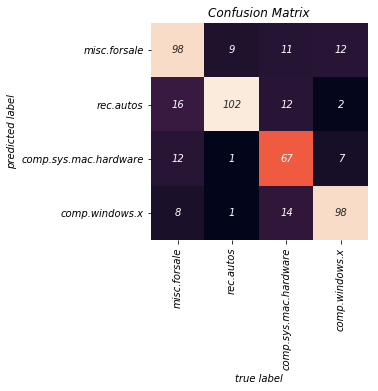

bayes  ROC:


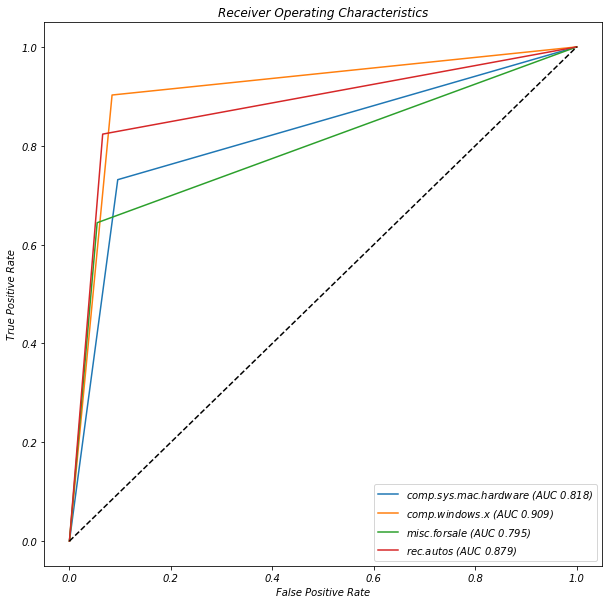

bayes  Regions:


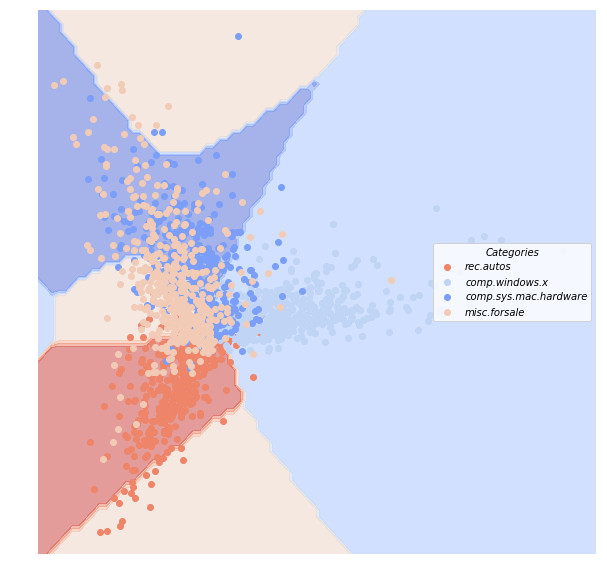

svm_linear  Evaluation:
                            AUC  Average_Precision  Error_Rate  Precision  \
Category                                                                    
rec.autos              0.947724           0.825664    0.053191   0.856061   
comp.windows.x         0.963647           0.901525    0.027660   0.938596   
comp.sys.mac.hardware  0.926150           0.860015    0.051064   0.943548   
misc.forsale           0.925205           0.823910    0.046809   0.910000   

                         Recall  
Category                         
rec.autos              0.949580  
comp.windows.x         0.946903  
comp.sys.mac.hardware  0.873134  
misc.forsale           0.875000  
svm_linear  Confusion Matrix:


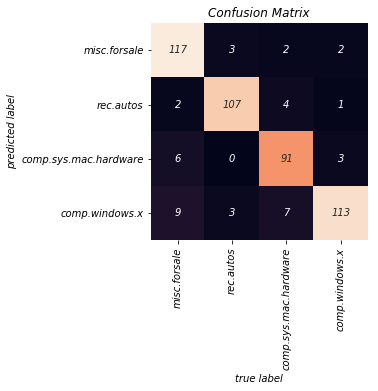

svm_linear  ROC:


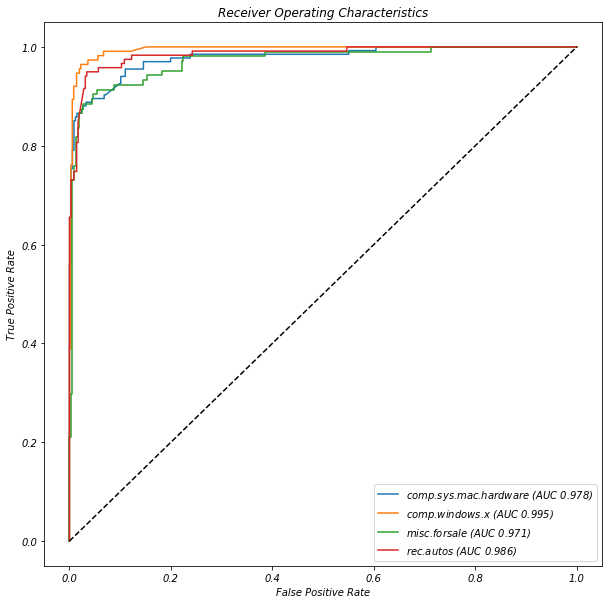

svm_linear  Regions:


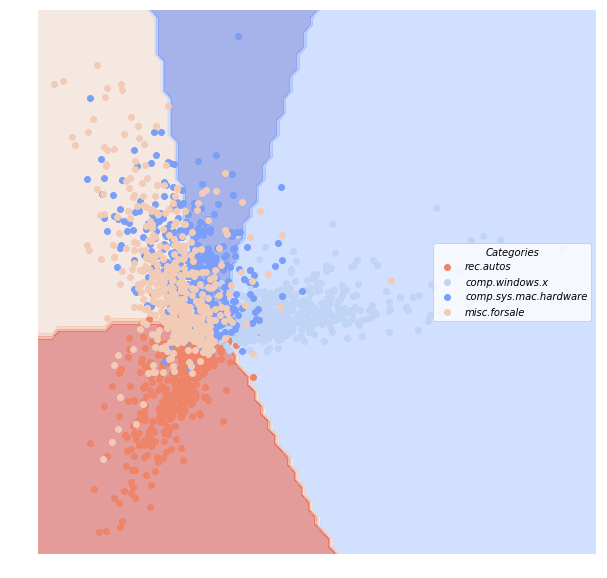

svm_poly  Evaluation:
                            AUC  Average_Precision  Error_Rate  Precision  \
Category                                                                    
rec.autos              0.873435           0.583299    0.176596   0.591837   
comp.windows.x         0.889604           0.812991    0.057447   0.967391   
comp.sys.mac.hardware  0.757485           0.629035    0.144681   0.934211   
misc.forsale           0.873792           0.682611    0.089362   0.792453   

                         Recall  
Category                         
rec.autos              0.974790  
comp.windows.x         0.787611  
comp.sys.mac.hardware  0.529851  
misc.forsale           0.807692  
svm_poly  Confusion Matrix:


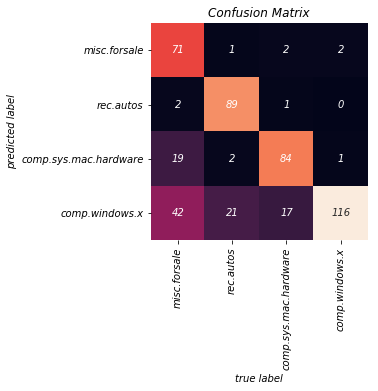

svm_poly  ROC:


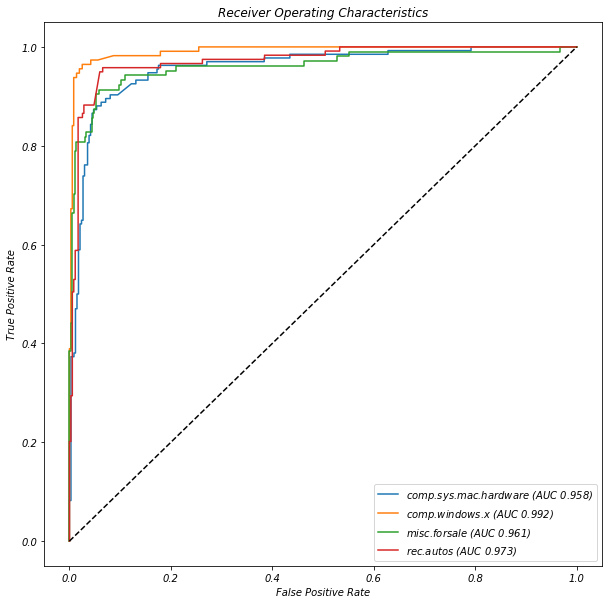

svm_poly  Regions:


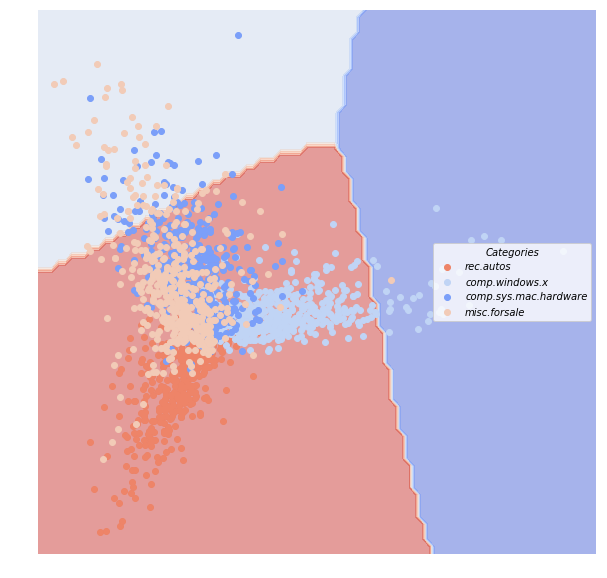

knn  Evaluation:
                            AUC  Average_Precision  Error_Rate  Precision  \
Category                                                                    
rec.autos              0.613493           0.315004    0.357447   0.364641   
comp.windows.x         0.573821           0.346340    0.206383   0.944444   
comp.sys.mac.hardware  0.623045           0.352546    0.404255   0.383333   
misc.forsale           0.550257           0.259151    0.223404   0.483871   

                         Recall  
Category                         
rec.autos              0.554622  
comp.windows.x         0.150442  
comp.sys.mac.hardware  0.686567  
misc.forsale           0.144231  
knn  Confusion Matrix:


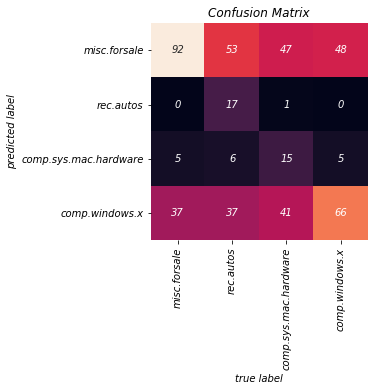

knn  ROC:


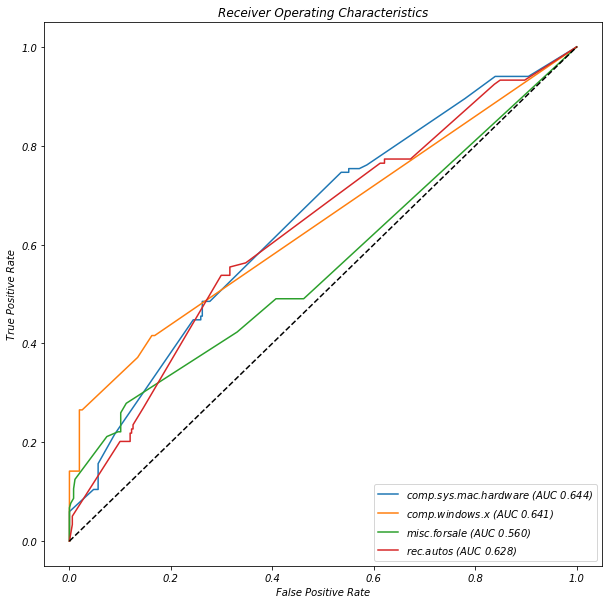

knn  Regions:


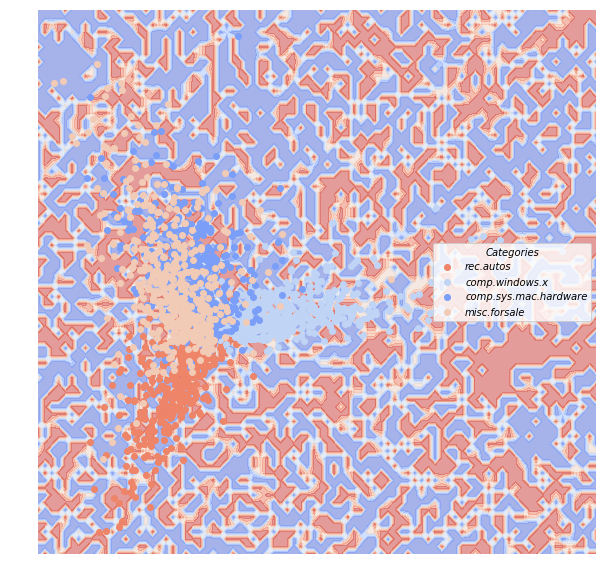

classical_reg  Evaluation:
                            AUC  Average_Precision  Error_Rate  Precision  \
Category                                                                    
rec.autos              0.951854           0.819711    0.055319   0.839416   
comp.windows.x         0.976922           0.921594    0.021277   0.940171   
comp.sys.mac.hardware  0.920176           0.856079    0.053191   0.950413   
misc.forsale           0.907340           0.802263    0.053191   0.915789   

                         Recall  
Category                         
rec.autos              0.966387  
comp.windows.x         0.973451  
comp.sys.mac.hardware  0.858209  
misc.forsale           0.836538  
classical_reg  Confusion Matrix:


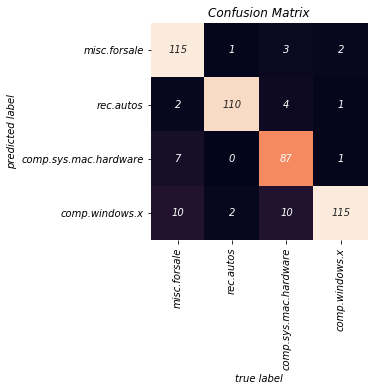

classical_reg  ROC:


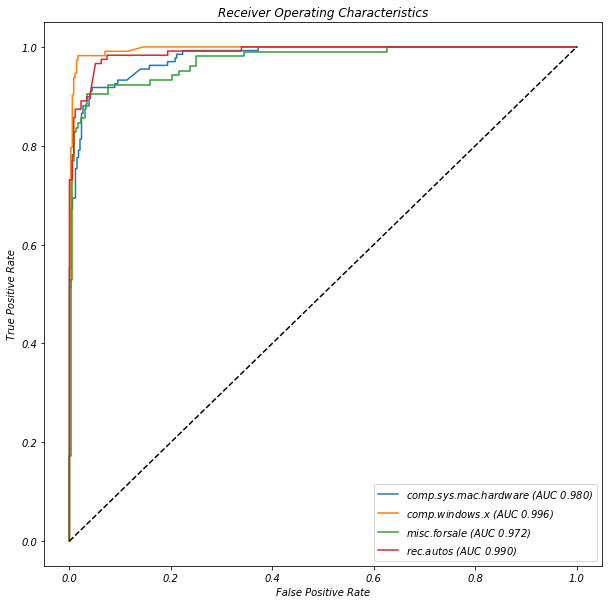

classical_reg  Regions:


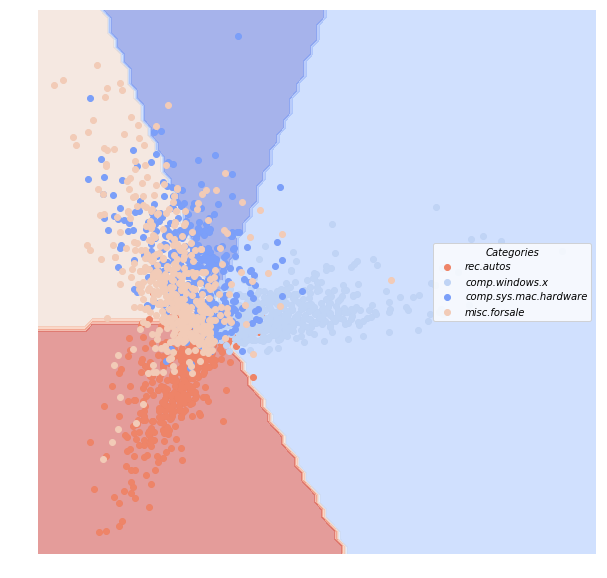

decision_tree  Evaluation:
                            AUC  Average_Precision  Error_Rate  Precision  \
Category                                                                    
rec.autos              0.831071           0.607513    0.136170   0.716535   
comp.windows.x         0.912843           0.771108    0.068085   0.846154   
comp.sys.mac.hardware  0.783693           0.599371    0.155319   0.774775   
misc.forsale           0.812106           0.542518    0.142553   0.660870   

                         Recall  
Category                         
rec.autos              0.764706  
comp.windows.x         0.876106  
comp.sys.mac.hardware  0.641791  
misc.forsale           0.730769  
decision_tree  Confusion Matrix:


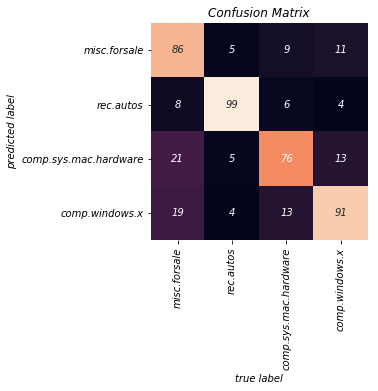

decision_tree  ROC:


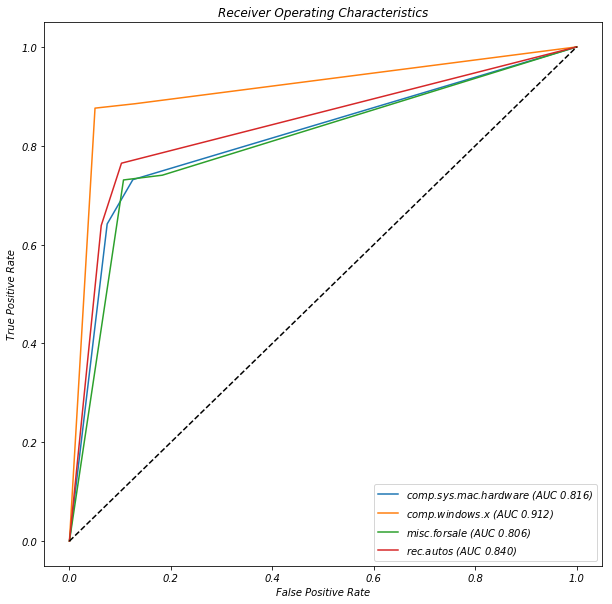

decision_tree  Regions:


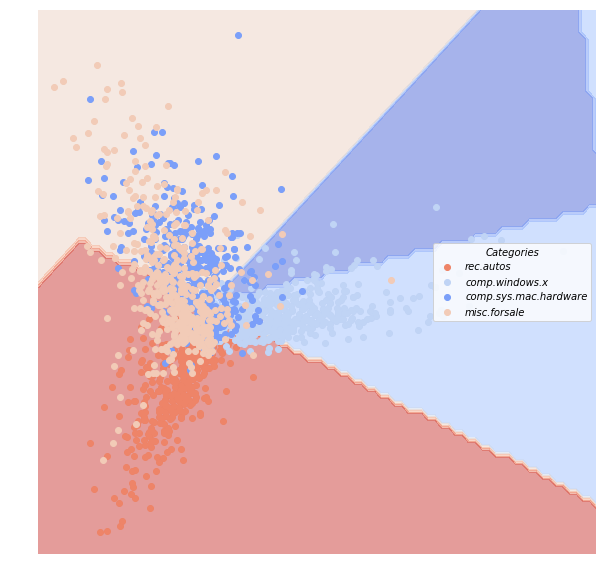

random_forest  Evaluation:
                            AUC  Average_Precision  Error_Rate  Precision  \
Category                                                                    
rec.autos              0.915392           0.759960    0.076596   0.816794   
comp.windows.x         0.948241           0.823315    0.051064   0.856000   
comp.sys.mac.hardware  0.872424           0.779215    0.082979   0.927928   
misc.forsale           0.877890           0.701254    0.082979   0.815534   

                         Recall  
Category                         
rec.autos              0.899160  
comp.windows.x         0.946903  
comp.sys.mac.hardware  0.768657  
misc.forsale           0.807692  
random_forest  Confusion Matrix:


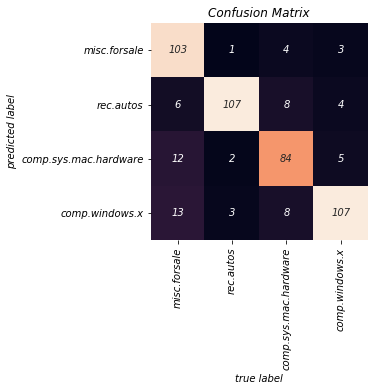

random_forest  ROC:


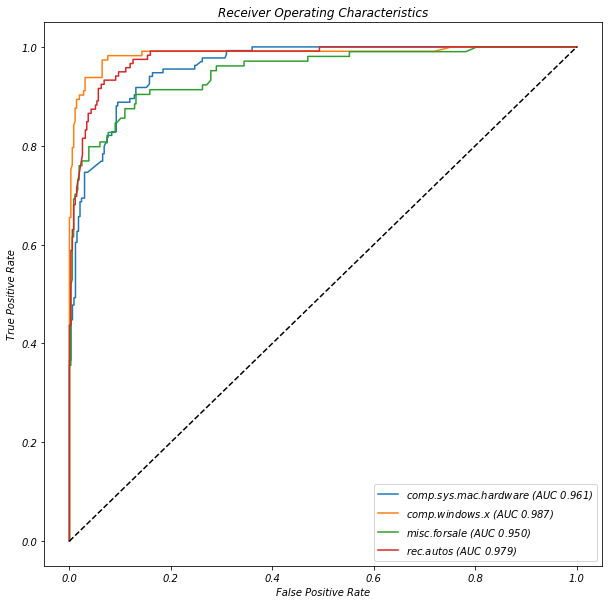

random_forest  Regions:


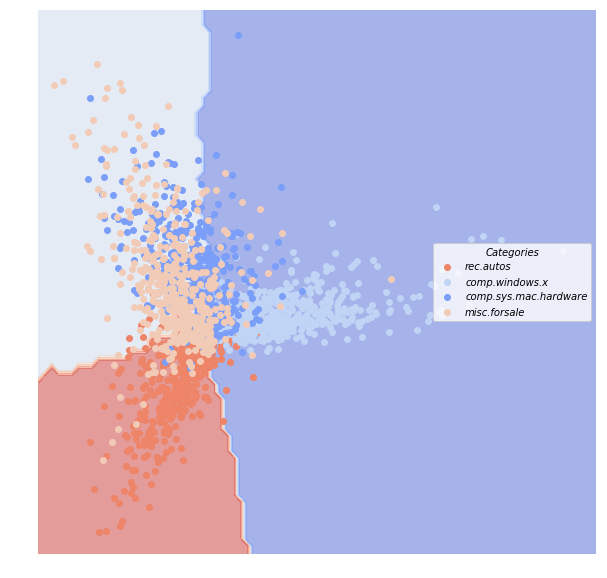

neural_network  Evaluation:
                            AUC  Average_Precision  Error_Rate  Precision  \
Category                                                                    
rec.autos              0.950573           0.838170    0.048936   0.869231   
comp.windows.x         0.965048           0.909391    0.025532   0.946903   
comp.sys.mac.hardware  0.911980           0.831050    0.061702   0.926829   
misc.forsale           0.919740           0.793285    0.055319   0.875000   

                         Recall  
Category                         
rec.autos              0.949580  
comp.windows.x         0.946903  
comp.sys.mac.hardware  0.850746  
misc.forsale           0.875000  
neural_network  Confusion Matrix:


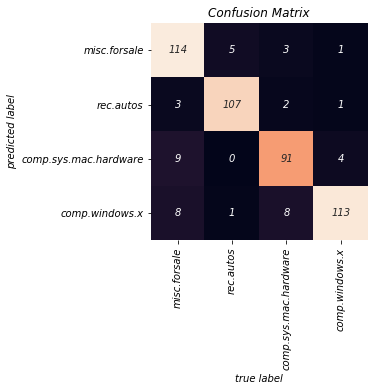

neural_network  ROC:


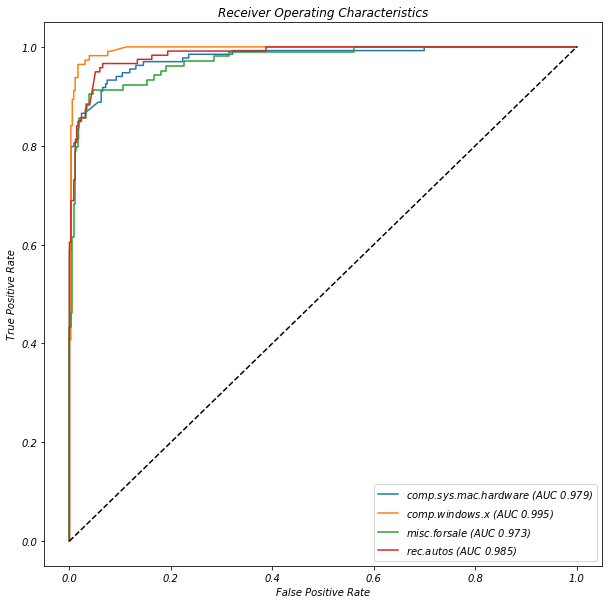

neural_network  Regions:


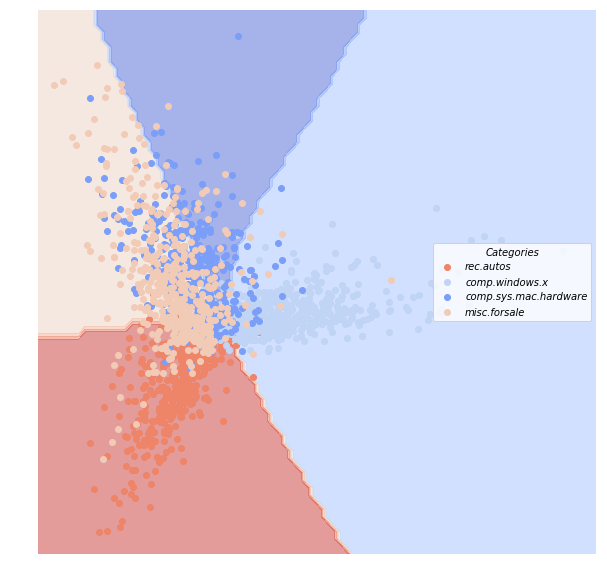

boosting  Evaluation:
                            AUC  Average_Precision  Error_Rate  Precision  \
Category                                                                    
rec.autos              0.894024           0.684505    0.108511   0.732877   
comp.windows.x         0.949419           0.843507    0.044681   0.883333   
comp.sys.mac.hardware  0.856743           0.765746    0.089362   0.942308   
misc.forsale           0.863467           0.679802    0.089362   0.810000   

                         Recall  
Category                         
rec.autos              0.899160  
comp.windows.x         0.938053  
comp.sys.mac.hardware  0.731343  
misc.forsale           0.778846  
boosting  Confusion Matrix:


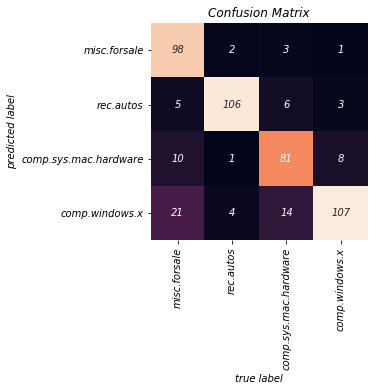

boosting  ROC:


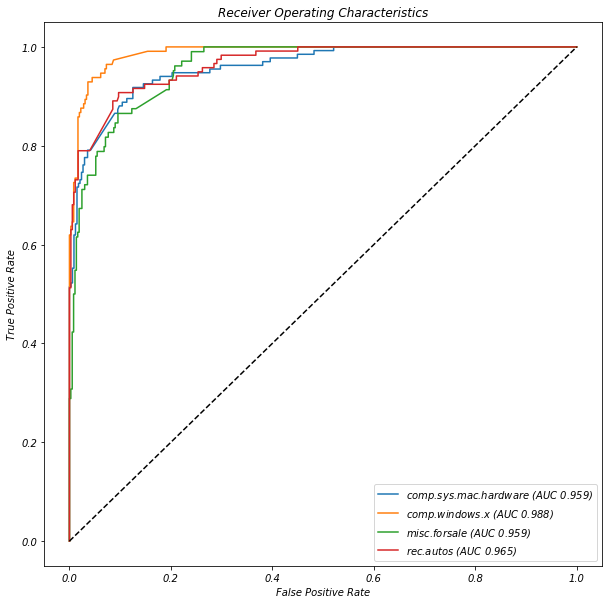

boosting  Regions:


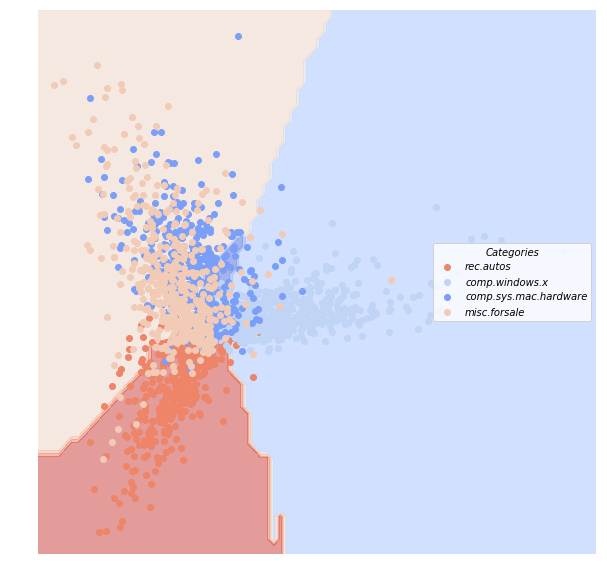

In [ ]:
eval_news = all_model_classify(newsgroups_dfTrain, newsgroups_dfTest)

#### (2) Senate Small

In [ ]:
senate_small_dfTrain, senate_small_dfTest = lucem_illud.trainTestSplit(lucem_illud.loadSenateSmall())

Loading senate data
Converting to vectors


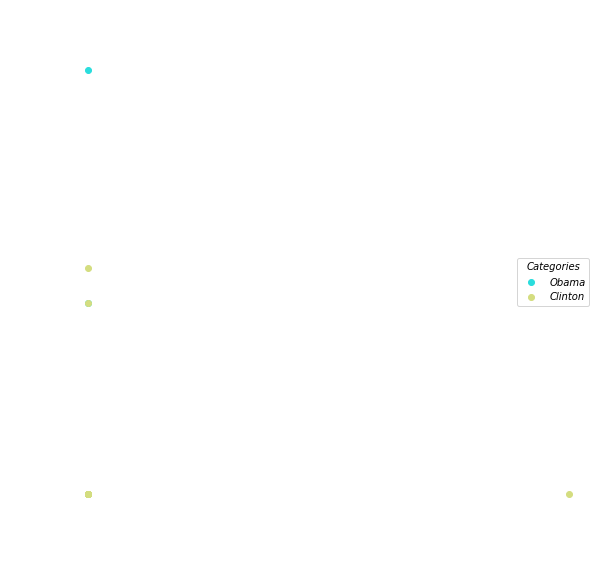

In [ ]:
lucem_illud.plotter(senate_small_dfTrain)

bayes  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
Obama     0.822866           0.738219    0.167155   0.839695  0.753425
Clinton   0.822866           0.800924    0.167155   0.828571  0.892308
bayes  Confusion Matrix:


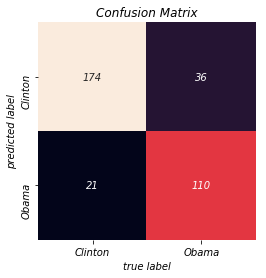

bayes  ROC:


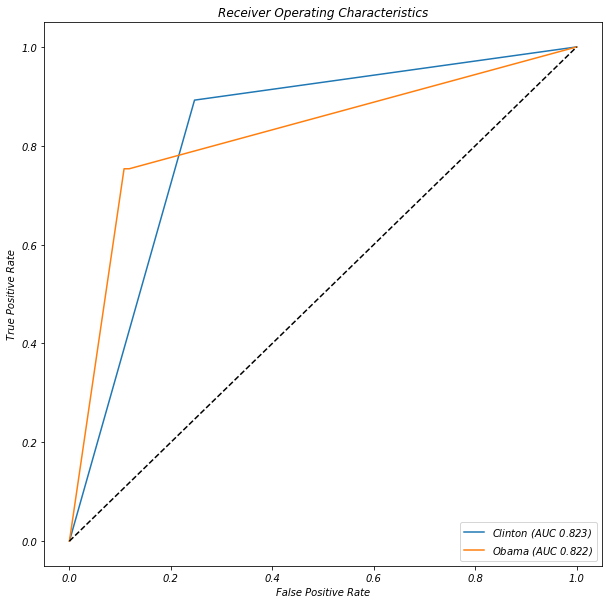

bayes  Regions:


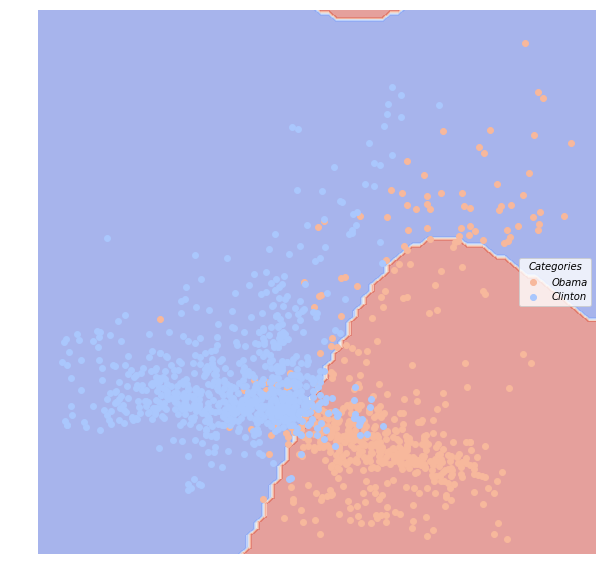

svm_linear  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
Obama     0.994011           0.989281    0.005865   0.993151  0.993151
Clinton   0.994011           0.992702    0.005865   0.994872  0.994872
svm_linear  Confusion Matrix:


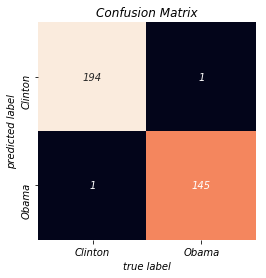

svm_linear  ROC:


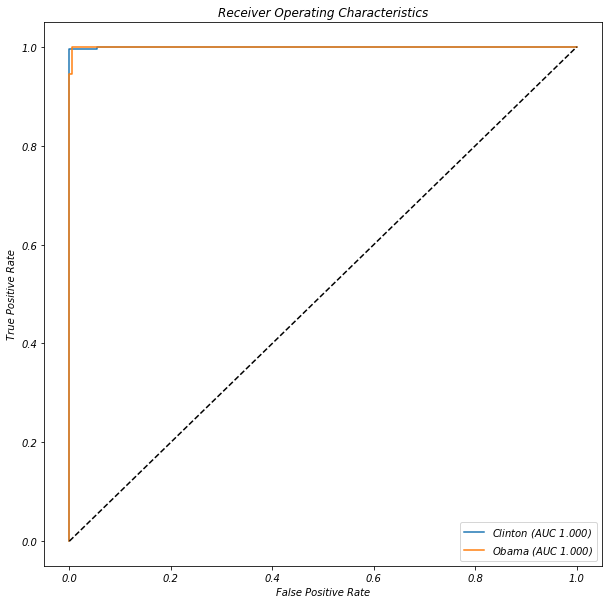

svm_linear  Regions:


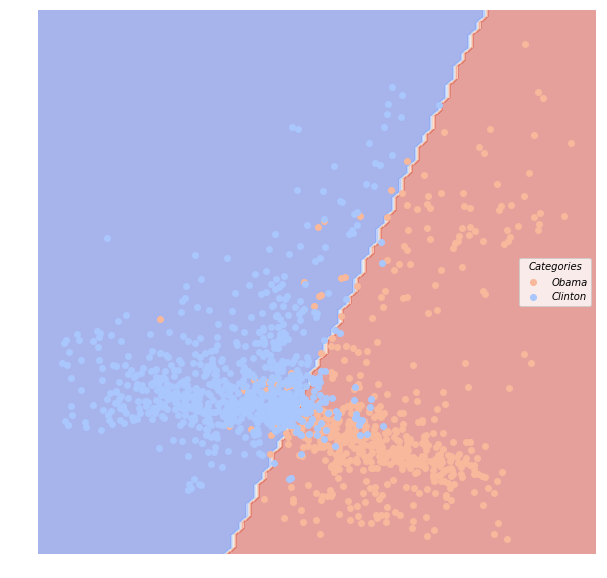

svm_poly  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
Obama     0.803109           0.753806    0.173021   0.939394  0.636986
Clinton   0.803109           0.774557    0.173021   0.780992  0.969231
svm_poly  Confusion Matrix:


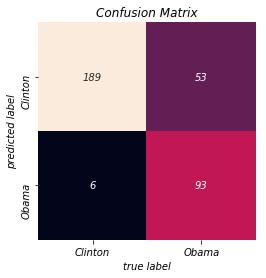

svm_poly  ROC:


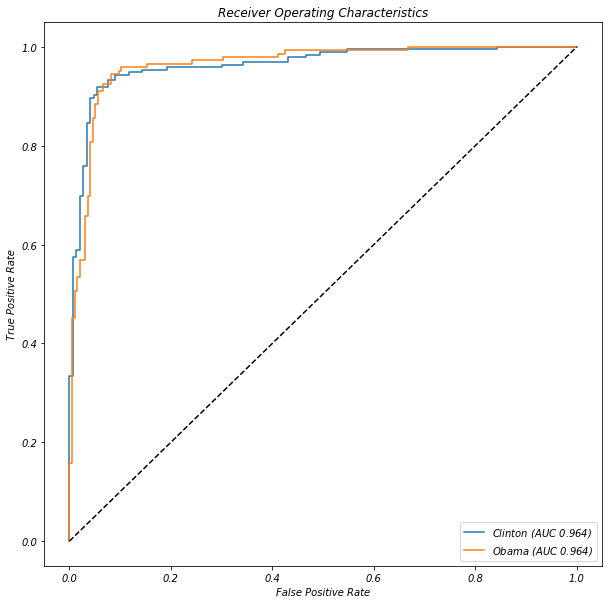

svm_poly  Regions:


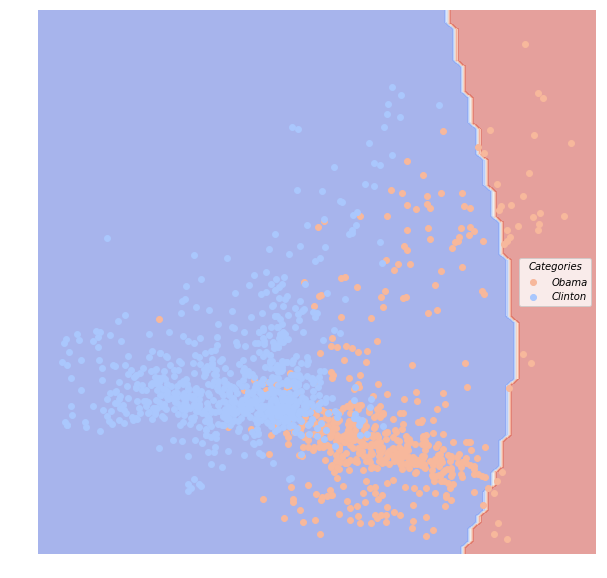

knn  Evaluation:
              AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                             
Obama     0.86484           0.774044    0.134897   0.828947  0.863014
Clinton   0.86484           0.851202    0.134897   0.894180  0.866667
knn  Confusion Matrix:


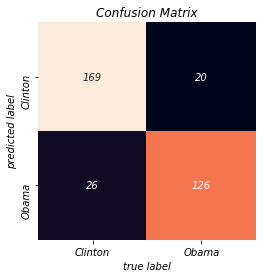

knn  ROC:


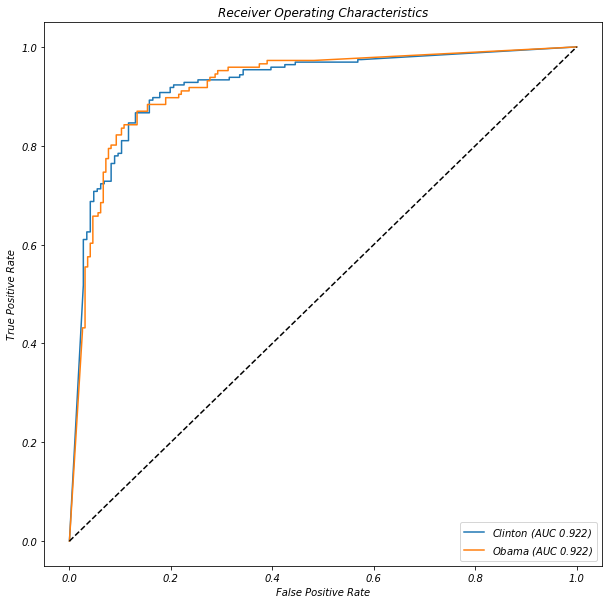

knn  Regions:


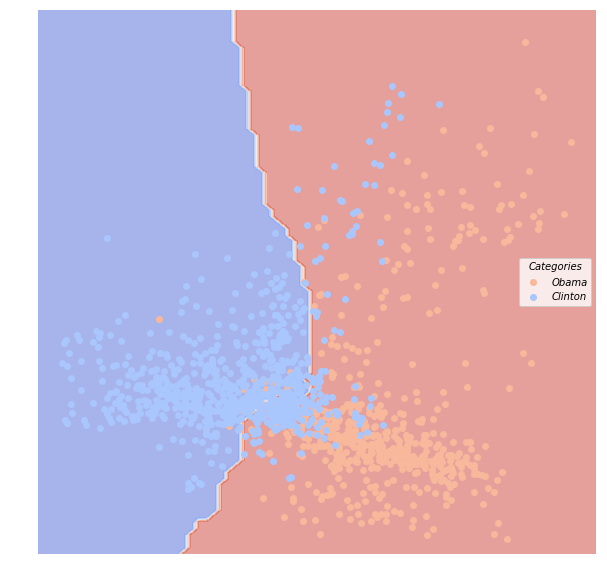

classical_reg  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
Obama     0.989726           0.988250    0.008798   1.000000  0.979452
Clinton   0.989726           0.984848    0.008798   0.984848  1.000000
classical_reg  Confusion Matrix:


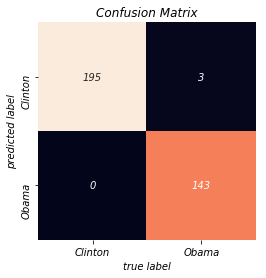

classical_reg  ROC:


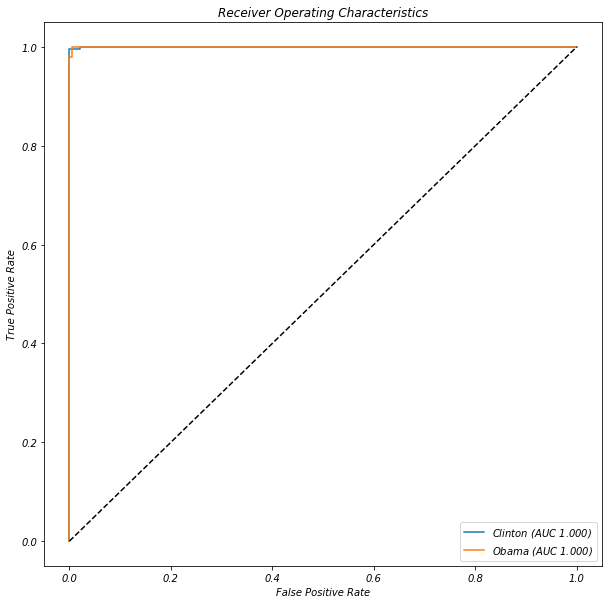

classical_reg  Regions:


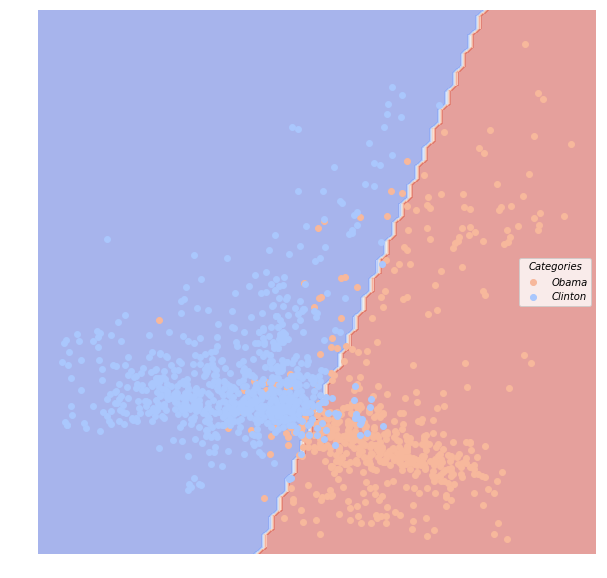

decision_tree  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
Obama     0.997436           0.993197    0.002933   0.993197  1.000000
Clinton   0.997436           0.997804    0.002933   1.000000  0.994872
decision_tree  Confusion Matrix:


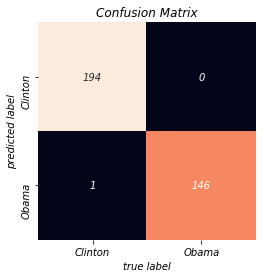

decision_tree  ROC:


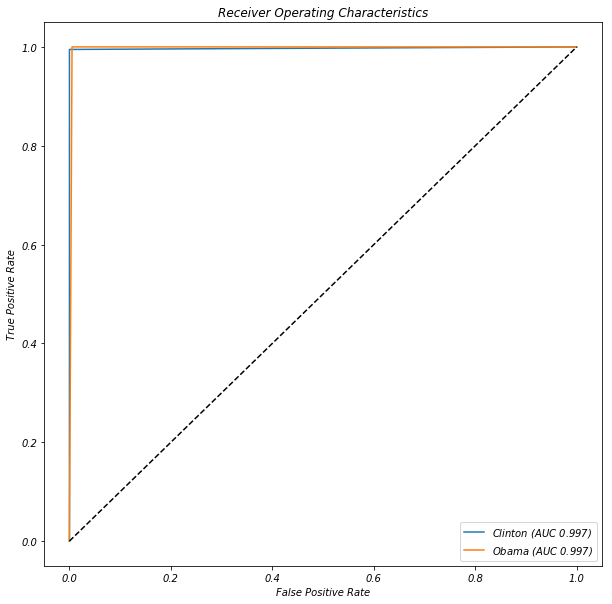

decision_tree  Regions:


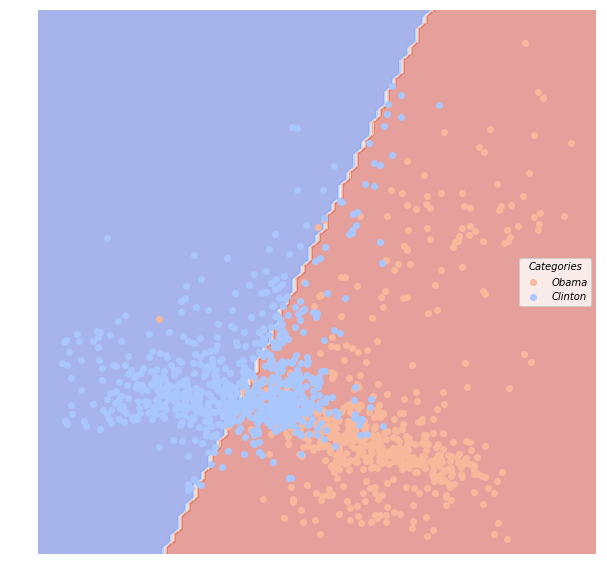

random_forest  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
Obama     0.989726           0.988250    0.008798   1.000000  0.979452
Clinton   0.989726           0.984848    0.008798   0.984848  1.000000
random_forest  Confusion Matrix:


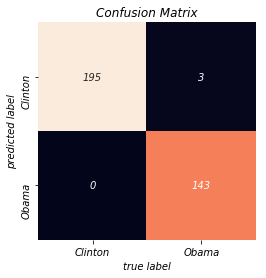

random_forest  ROC:


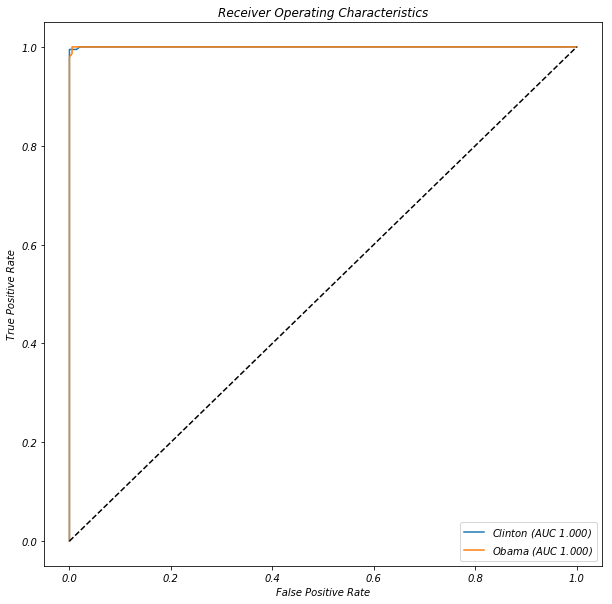

random_forest  Regions:


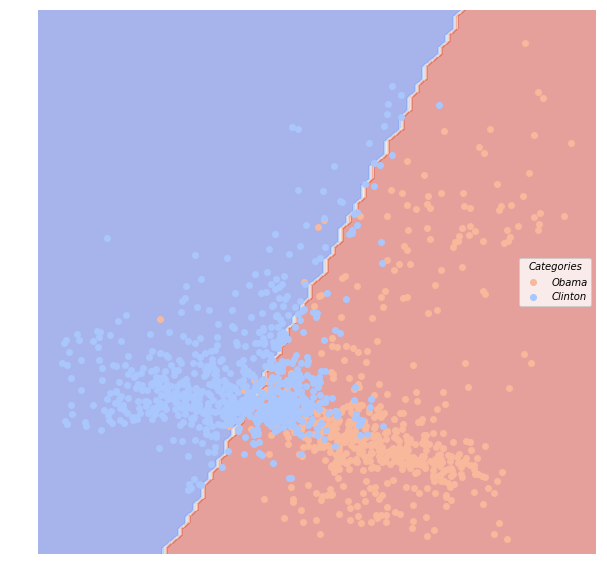

neural_network  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
Obama     0.964067           0.937092    0.035191   0.958904  0.958904
Clinton   0.964067           0.957004    0.035191   0.969231  0.969231
neural_network  Confusion Matrix:


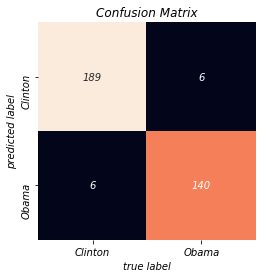

neural_network  ROC:


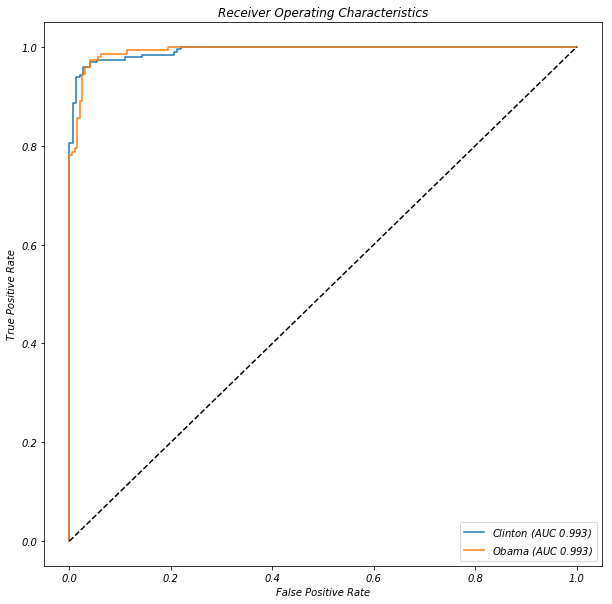

neural_network  Regions:


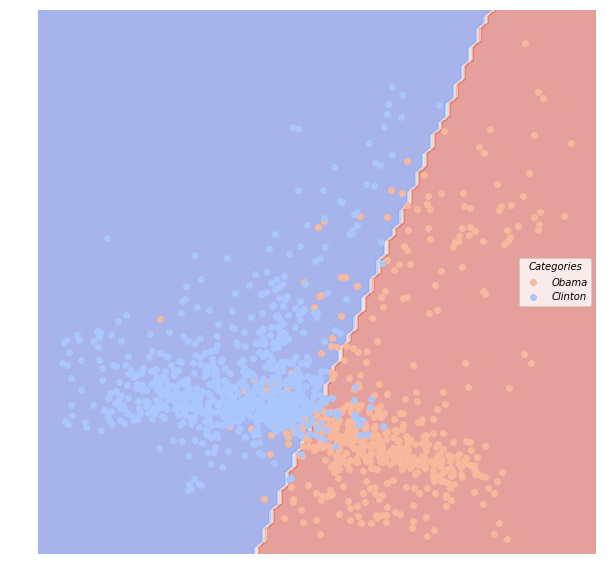

boosting  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
Obama     0.997436           0.993197    0.002933   0.993197  1.000000
Clinton   0.997436           0.997804    0.002933   1.000000  0.994872
boosting  Confusion Matrix:


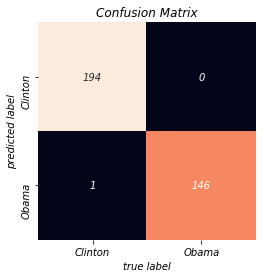

boosting  ROC:


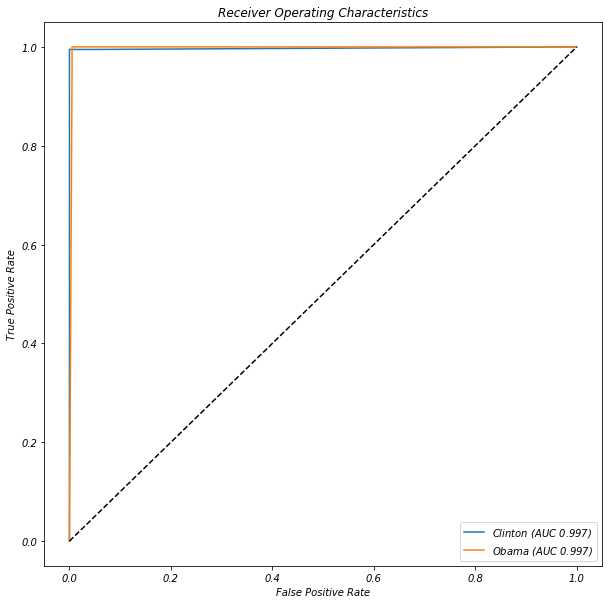

boosting  Regions:


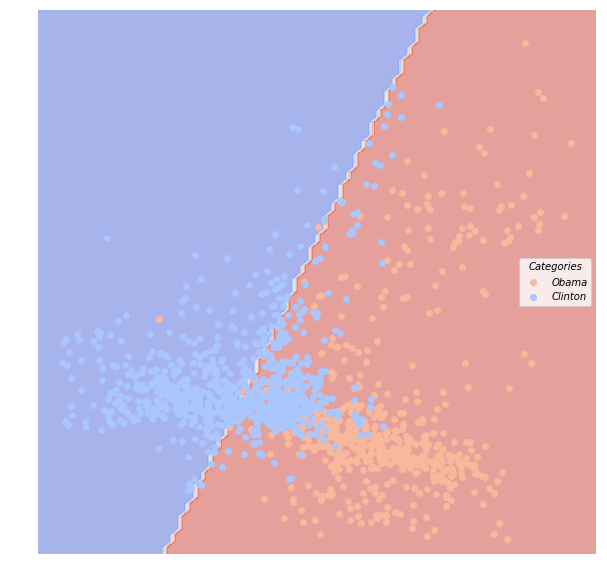

In [ ]:
eval_senate_small = all_model_classify(senate_small_dfTrain, senate_small_dfTest)

#### (3) Reddit

Because the senate large dataset cannot be loaded through lucem_illud, I will load Reddit dataset for analysis in this section.

In [ ]:
reddit_dfTrain, reddit_dfTest = lucem_illud.trainTestSplit(lucem_illud.loadReddit())

Loading Reddit data
Converting to vectors


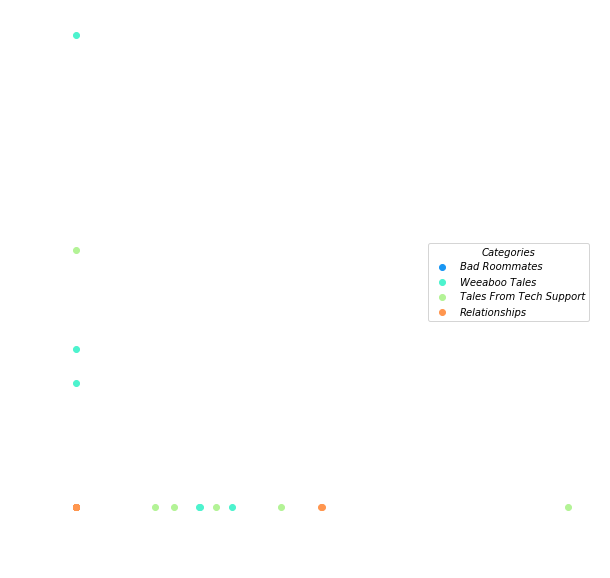

In [ ]:
lucem_illud.plotter(reddit_dfTrain)

bayes  Evaluation:
                              AUC  Average_Precision  Error_Rate  Precision  \
Category                                                                      
Bad Roommates            0.808123           0.630094    0.122257   0.818182   
Weeaboo Tales            0.825557           0.521100    0.228840   0.537415   
Tales From Tech Support  0.857765           0.739231    0.084639   0.909091   
Relationships            0.640745           0.364511    0.197492   0.625000   

                           Recall  
Category                           
Bad Roommates            0.666667  
Weeaboo Tales            0.940476  
Tales From Tech Support  0.740741  
Relationships            0.342466  
bayes  Confusion Matrix:


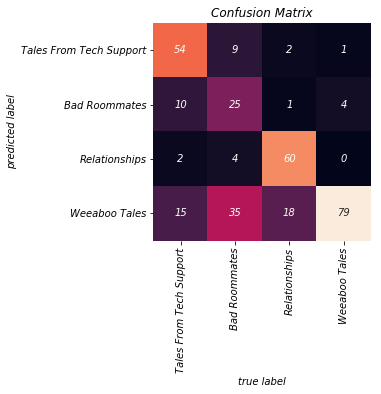

bayes  ROC:


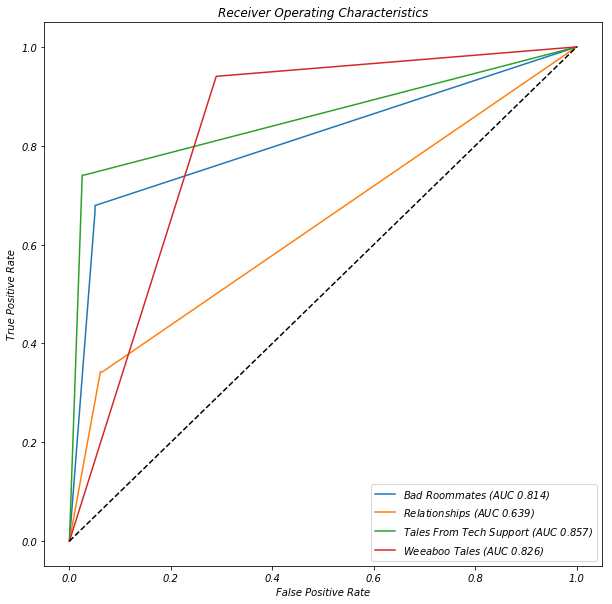

bayes  Regions:


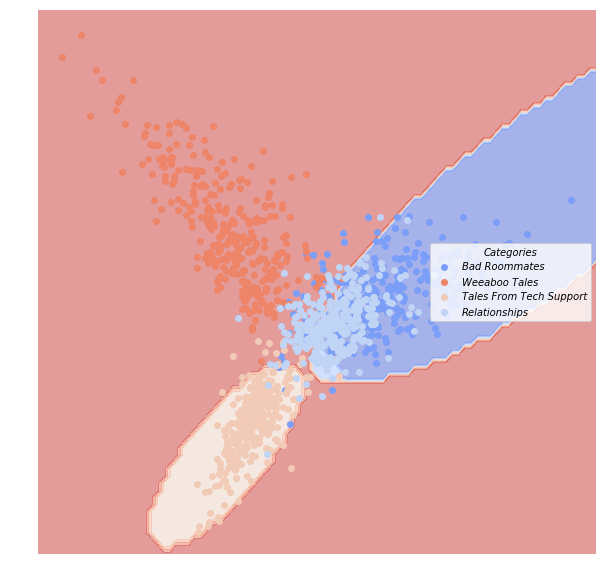

svm_linear  Evaluation:
                              AUC  Average_Precision  Error_Rate  Precision  \
Category                                                                      
Bad Roommates            0.987525           0.955091    0.012539   0.963855   
Weeaboo Tales            0.982143           0.973690    0.009404   1.000000   
Tales From Tech Support  0.995798           0.975904    0.006270   0.975904   
Relationships            0.984269           0.965364    0.009404   0.986111   

                           Recall  
Category                           
Bad Roommates            0.987654  
Weeaboo Tales            0.964286  
Tales From Tech Support  1.000000  
Relationships            0.972603  
svm_linear  Confusion Matrix:


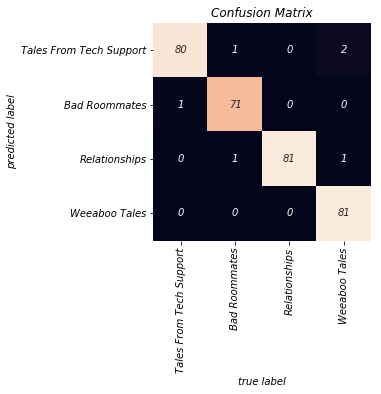

svm_linear  ROC:


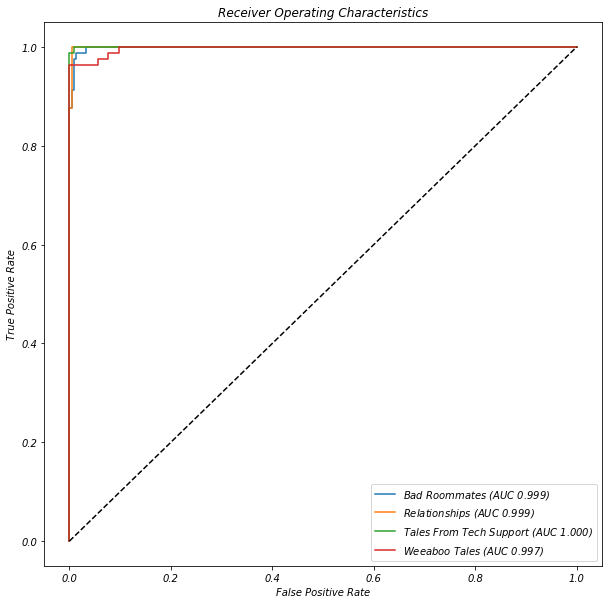

svm_linear  Regions:


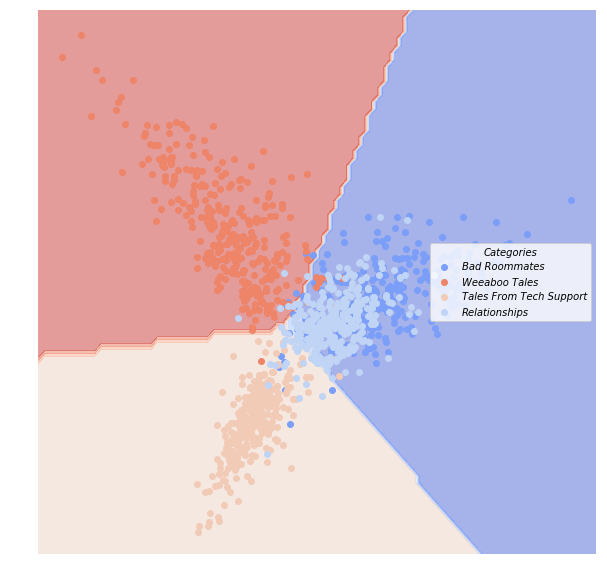

svm_poly  Evaluation:
                              AUC  Average_Precision  Error_Rate  Precision  \
Category                                                                      
Bad Roommates            0.909379           0.847072    0.050157   0.971014   
Weeaboo Tales            0.918364           0.862833    0.047022   0.972603   
Tales From Tech Support  0.970588           0.852632    0.043887   0.852632   
Relationships            0.946180           0.807895    0.053292   0.841463   

                           Recall  
Category                           
Bad Roommates            0.827160  
Weeaboo Tales            0.845238  
Tales From Tech Support  1.000000  
Relationships            0.945205  
svm_poly  Confusion Matrix:


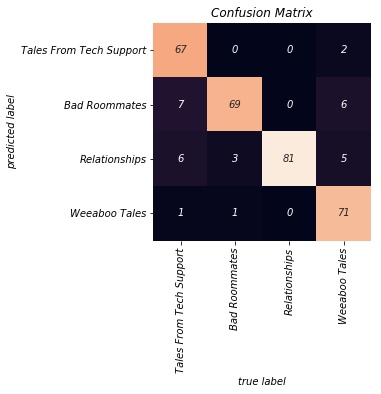

svm_poly  ROC:


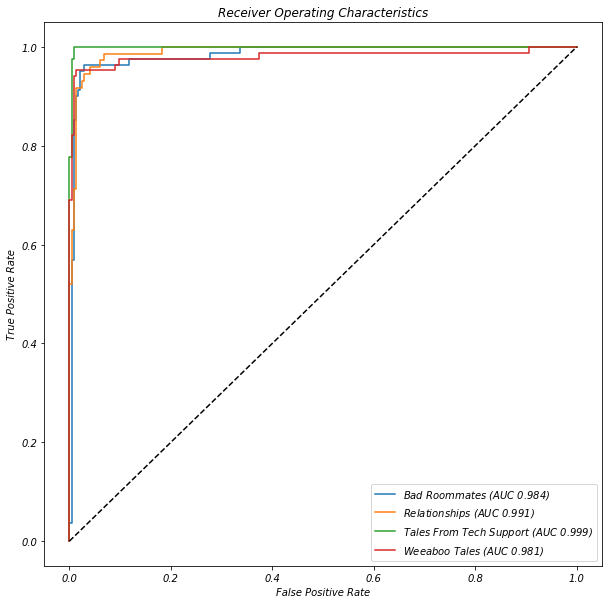

svm_poly  Regions:


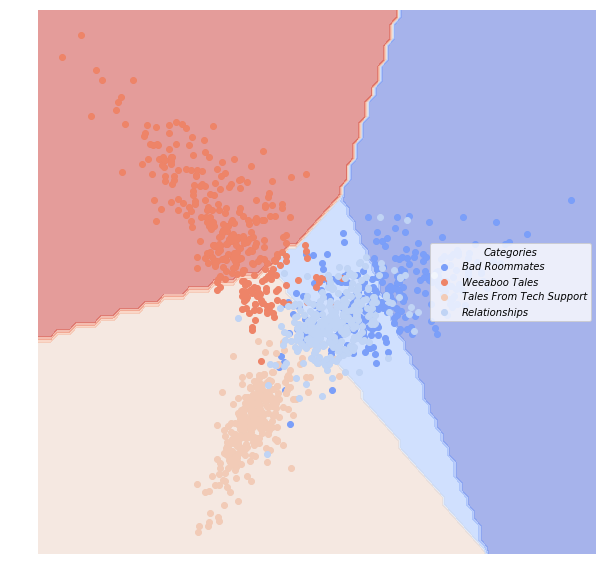

knn  Evaluation:
                              AUC  Average_Precision  Error_Rate  Precision  \
Category                                                                      
Bad Roommates            0.925537           0.818337    0.056426   0.888889   
Weeaboo Tales            0.899620           0.718567    0.097179   0.773196   
Tales From Tech Support  0.954560           0.897852    0.031348   0.949367   
Relationships            0.844721           0.683332    0.090909   0.854839   

                           Recall  
Category                           
Bad Roommates            0.888889  
Weeaboo Tales            0.892857  
Tales From Tech Support  0.925926  
Relationships            0.726027  
knn  Confusion Matrix:


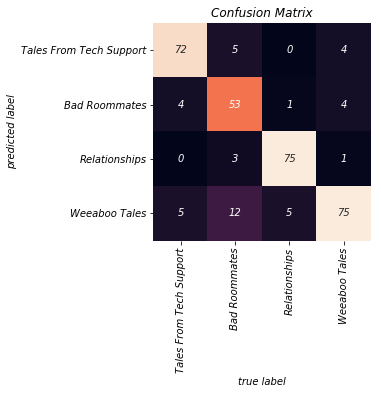

knn  ROC:


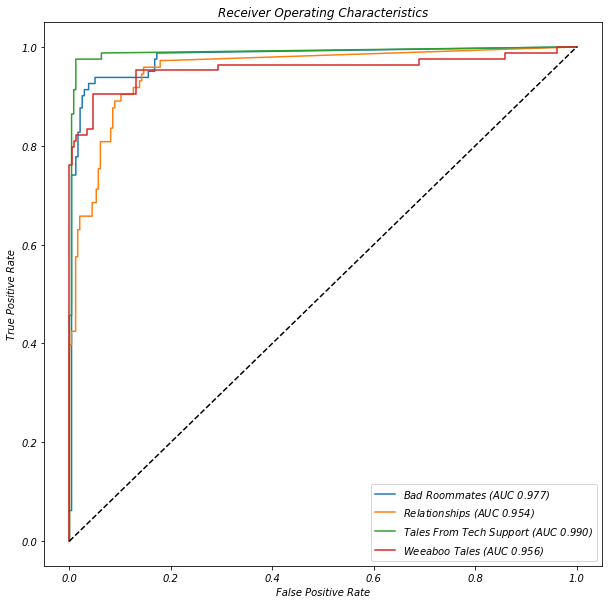

knn  Regions:


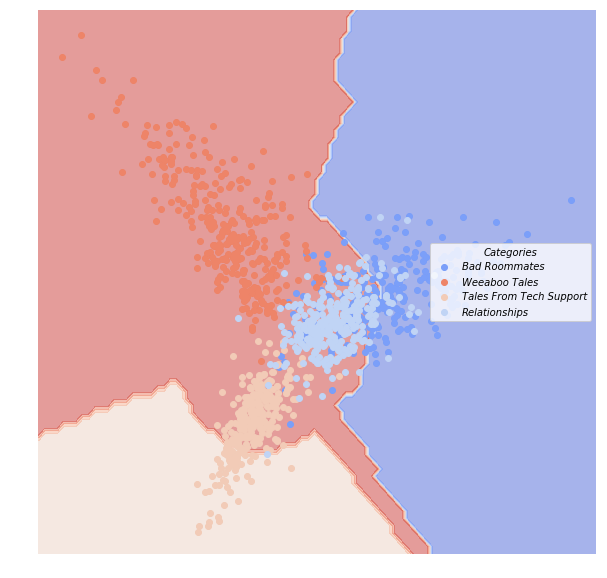

classical_reg  Evaluation:
                              AUC  Average_Precision  Error_Rate  Precision  \
Category                                                                      
Bad Roommates            0.987525           0.955091    0.012539   0.963855   
Weeaboo Tales            0.976190           0.964920    0.012539   1.000000   
Tales From Tech Support  0.993697           0.964286    0.009404   0.964286   
Relationships            0.966505           0.918361    0.021944   0.958333   

                           Recall  
Category                           
Bad Roommates            0.987654  
Weeaboo Tales            0.952381  
Tales From Tech Support  1.000000  
Relationships            0.945205  
classical_reg  Confusion Matrix:


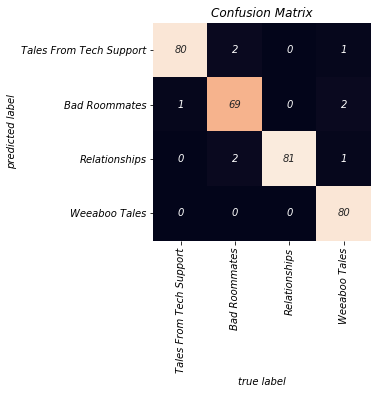

classical_reg  ROC:


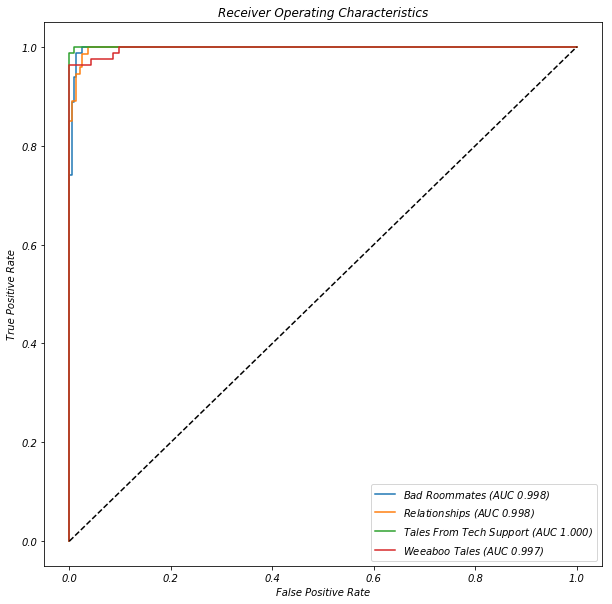

classical_reg  Regions:


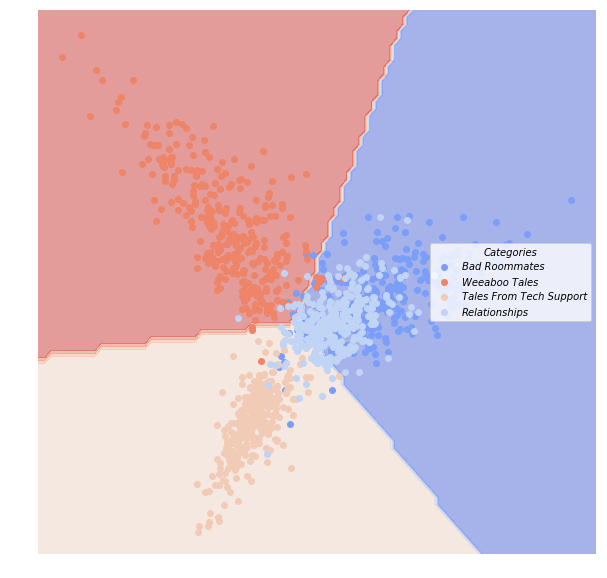

decision_tree  Evaluation:
                              AUC  Average_Precision  Error_Rate  Precision  \
Category                                                                      
Bad Roommates            0.929609           0.817730    0.056426   0.879518   
Weeaboo Tales            0.951089           0.859965    0.043887   0.897727   
Tales From Tech Support  0.865909           0.737515    0.084639   0.885714   
Relationships            0.945428           0.827757    0.047022   0.871795   

                           Recall  
Category                           
Bad Roommates            0.901235  
Weeaboo Tales            0.940476  
Tales From Tech Support  0.765432  
Relationships            0.931507  
decision_tree  Confusion Matrix:


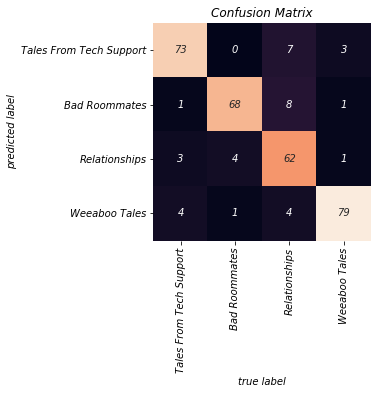

decision_tree  ROC:


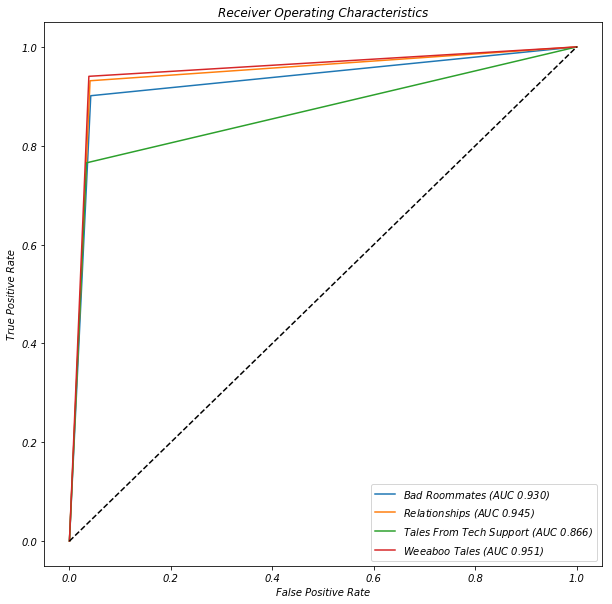

decision_tree  Regions:


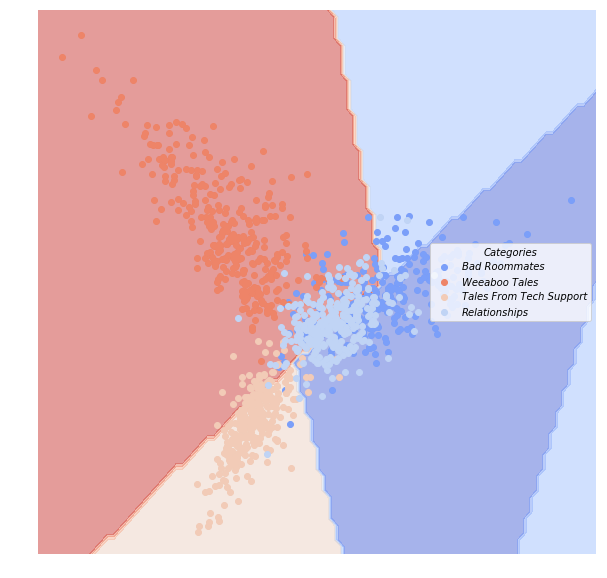

random_forest  Evaluation:
                              AUC  Average_Precision  Error_Rate  Precision  \
Category                                                                      
Bad Roommates            0.991726           0.978596    0.006270   0.987654   
Weeaboo Tales            0.985968           0.970699    0.009404   0.987952   
Tales From Tech Support  0.987654           0.981578    0.006270   1.000000   
Relationships            0.985021           0.937526    0.015674   0.947368   

                           Recall  
Category                           
Bad Roommates            0.987654  
Weeaboo Tales            0.976190  
Tales From Tech Support  0.975309  
Relationships            0.986301  
random_forest  Confusion Matrix:


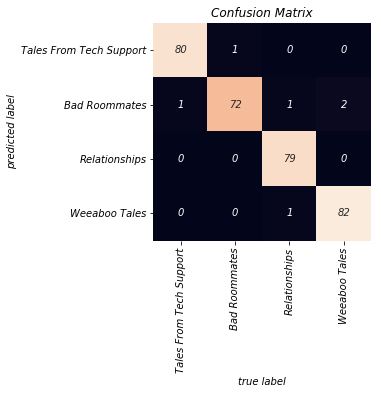

random_forest  ROC:


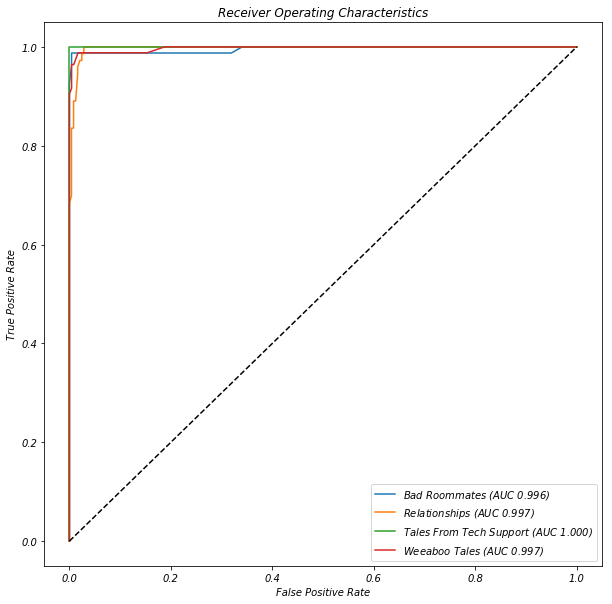

random_forest  Regions:


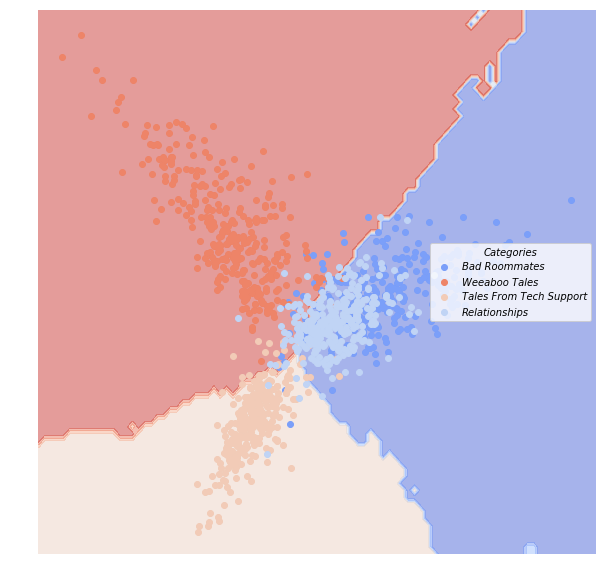

neural_network  Evaluation:
                              AUC  Average_Precision  Error_Rate  Precision  \
Category                                                                      
Bad Roommates            0.973078           0.925394    0.021944   0.951220   
Weeaboo Tales            0.977888           0.950454    0.015674   0.975904   
Tales From Tech Support  1.000000           1.000000    0.000000   1.000000   
Relationships            0.973354           0.928901    0.018809   0.958904   

                           Recall  
Category                           
Bad Roommates            0.962963  
Weeaboo Tales            0.964286  
Tales From Tech Support  1.000000  
Relationships            0.958904  
neural_network  Confusion Matrix:


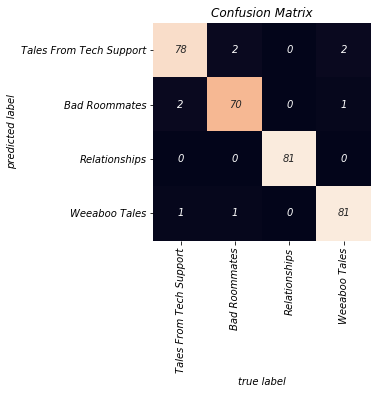

neural_network  ROC:


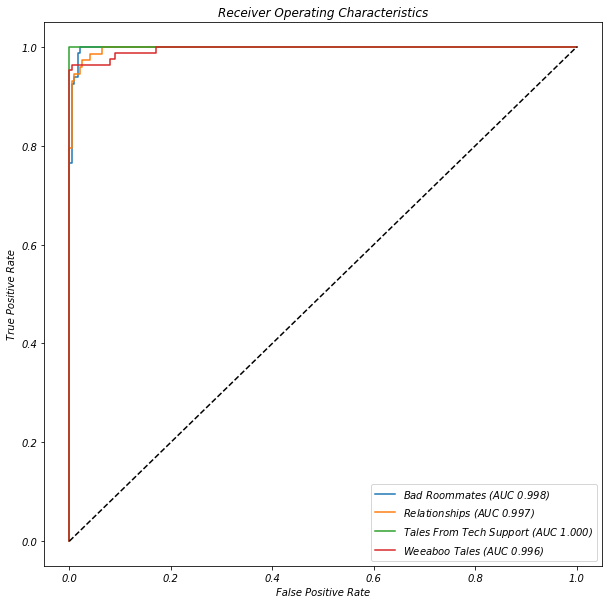

neural_network  Regions:


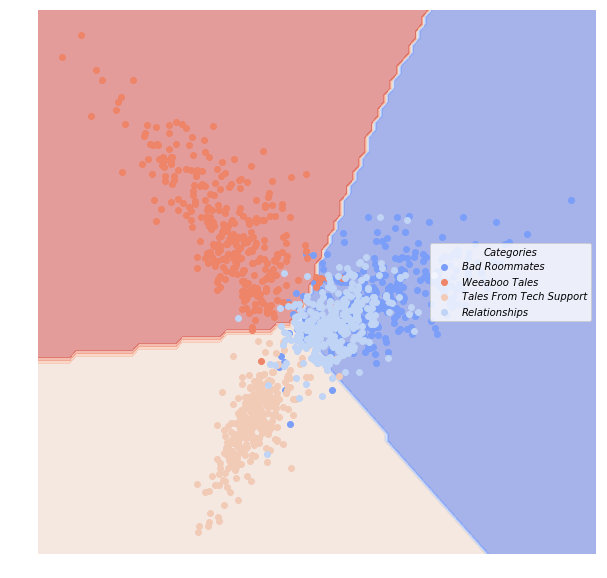

boosting  Evaluation:
                              AUC  Average_Precision  Error_Rate  Precision  \
Category                                                                      
Bad Roommates            0.971107           0.939090    0.018809   0.974684   
Weeaboo Tales            0.960030           0.924166    0.025078   0.975000   
Tales From Tech Support  0.958632           0.896028    0.031348   0.938272   
Relationships            0.987805           0.924051    0.018809   0.924051   

                           Recall  
Category                           
Bad Roommates            0.950617  
Weeaboo Tales            0.928571  
Tales From Tech Support  0.938272  
Relationships            1.000000  
boosting  Confusion Matrix:


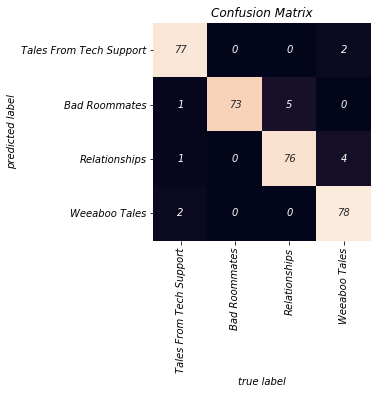

boosting  ROC:


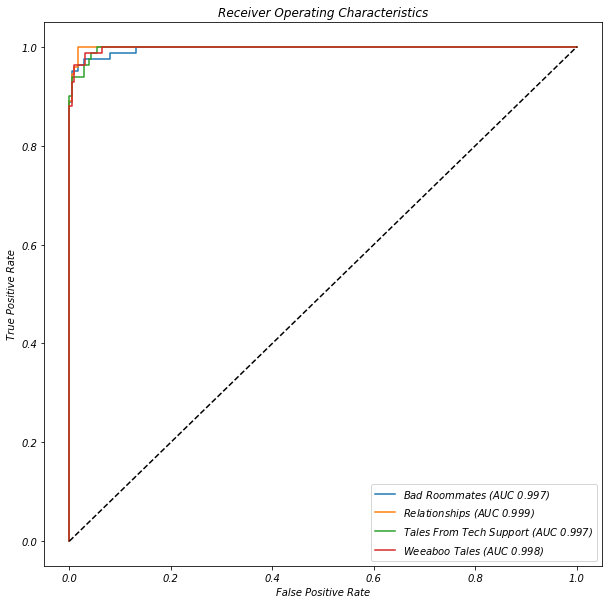

boosting  Regions:


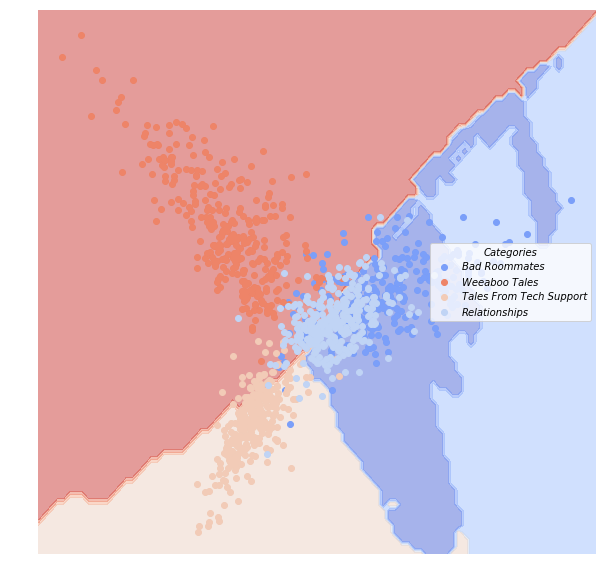

In [ ]:
eval_reddit = all_model_classify(reddit_dfTrain, reddit_dfTest)

#### Conclusion

The Email Spam dataset and Senate Large dataset failed to load with loadSenateLarge() and loadSpam() functions. The dataset do not exist in the data directory given. Therefore, for emperical datasets, I only classified Newsgroups, Senate Small, and Reddit datasets.

For Newsgroups, 20 newsgroups are classified into 4 categories. SVM with linear kernel, classical regression, neural network outperformed other models with relatively lower error rates of all categories.

For Senate Small, senator press releases are classified into 2 categories. SVM with linear kernel, decision tree, random forest, neural network and boosting have better performance than other models since they have lower error rates of all categories. Random forest produced the lowest error rate (near 0), because it combines the outputs from individual trees and are able to handle difficult hypotheses.

The Reddit dataset is classified into 4 categories. SVM with linear kernel, classical regression, random forest, neural network and boosting have better performance than other models since they have lower error rates of all categories.

### Stretch - AdaBoost

The core principle of AdaBoost is to fit a sequence of weak learners (i.e., models that are only slightly better than random guessing, such as small decision trees) on repeatedly modified versions of the data. The predictions from all of the iterations are then combined through a weighted majority vote (or sum) to produce the final prediction.

In [ ]:
# Artificial dataset
clf_ada0 = sklearn.ensemble.AdaBoostClassifier(n_estimators=100)
clf_ada0.fit(np.stack(dfTrain3['vect'], axis=0), dfTrain3['category'])
lucem_illud.evaluateClassifier(clf_ada0, dfTest3)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.864728,0.809798,0.135,0.864583,0.855670
1,0.864728,0.821161,0.135,0.865385,0.873786


For the artifical dataset, I used data generated by targetSplit at noise level 0.2 (dfTrain3 and dfTest3). After fitting the AdaBoost Classifier to the dataset, it produced an error rate of 0.115. This error rate is higher than that produced by decision tree, neural network, and boosting classifiers. 

In [ ]:
# Empirical dataset - Reddit
clf_ada_reddit = sklearn.ensemble.AdaBoostClassifier(n_estimators=100)
clf_ada_reddit.fit(np.stack(reddit_dfTrain['vect'], axis=0), reddit_dfTrain['category'])
lucem_illud.evaluateClassifier(clf_ada_reddit, reddit_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
Bad Roommates,0.929220,0.766291,0.075235,0.800000,0.938272
Weeaboo Tales,0.938349,0.900554,0.034483,0.986667,0.880952
Tales From Tech Support,0.905047,0.801905,0.062696,0.906667,0.839506
Relationships,0.918031,0.786451,0.059561,0.864865,0.876712


For the empirical dataset, I chose the Reddit dataset. After appling AdaBoost Classifer to Email Spam dataset, it produced an error rates between 0.01 to 0.05. This error rate is slightly higher than that of neural network and boosting, but still, can be considered as a low error rate. 

The possible reason is that AdaBoost is sensitive to noise data and it is highly affected by outliers because it tries to fit each point perfectly. One disadvantage of Adaboost is that it is vulnerable to uniform noise. Weak classifiers being too weak can lead to low margins and overfitting. Also, it works better in large dataset as it learns from the results of previous classifiers to update the new classifier.

## <span style="color:red">*Exercise 2*</span>

<span style="color:red">In the cells immediately following, perform Logistic and Naïve Bayes classification (binary or multinomial) using training, testing and extrapolation (uncoded) data from texts and hand-classifications associated with your final project (e.g., these could be crowd-sourced codes gathered through Amazon Mechanical Turk last week). Visualize the confusion matrix for training and testing sets. Calculate precision, recall, the F-measure, and AUC, then perform an ROC visualization. How do these classifiers perform? Exrapolate codes from these models to all uncoded data.


For this assignment, I used a Kaggle dataset, customer reviews from women’s clothing e-commerce. 

In [ ]:
review_raw = pandas.read_csv("e-commerce_reviews.csv")
review_raw.head()

,Unnamed: 0,Clothing ID,Age,Title,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name
0,0,767,33,NaN,Absolutely wonderful - silky and sexy and comf...,4,1,0,Initmates,Intimate,Intimates
1,1,1080,34,NaN,Love this dress! it's sooo pretty. i happene...,5,1,4,General,Dresses,Dresses
2,2,1077,60,Some major design flaws,I had such high hopes for this dress and reall...,3,0,0,General,Dresses,Dresses
3,3,1049,50,My favorite buy!,"I love, love, love this jumpsuit. it's fun, fl...",5,1,0,General Petite,Bottoms,Pants
4,4,847,47,Flattering shirt,This shirt is very flattering to all due to th...,5,1,6,General,Tops,Blouses


In [ ]:
# To analyze the dataset, I will only keep columns with interests.
review = review_raw[['Review Text','Rating','Class Name','Age']]
review = review.dropna() # drop NA
review.head()

,Review Text,Rating,Class Name,Age
0,Absolutely wonderful - silky and sexy and comf...,4,Intimates,33
1,Love this dress! it's sooo pretty. i happene...,5,Dresses,34
2,I had such high hopes for this dress and reall...,3,Dresses,60
3,"I love, love, love this jumpsuit. it's fun, fl...",5,Pants,50
4,This shirt is very flattering to all due to th...,5,Blouses,47


The "category" column represents if the review is positive or negative based on the rating. If the rating is 4 or higher, we can regard it as a positive review. If the rating is 2 or lower, we can regard it as a negative review.

In [ ]:
review_df = review[review['Rating'] != 3]
review_df['category'] = review_df['Rating'] >=4
review_df = review_df[:2000] # reduce computing time

/Users/gaomingtao/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [ ]:
# Tokenize and normalize
review_df['tokenized_text'] = review_df['Review Text'].apply(lambda x: lucem_illud.word_tokenize(x))
review_df['normalized_text'] = review_df['tokenized_text'].apply(lambda x: lucem_illud.normalizeTokens(x))

In [ ]:
review_df.head()

,Review Text,Rating,Class Name,Age,category,tokenized_text,normalized_text
0,Absolutely wonderful - silky and sexy and comf...,4,Intimates,33,True,"[Absolutely, wonderful, silky, and, sexy, and,...","[absolutely, wonderful, silky, sexy, comfortable]"
1,Love this dress! it's sooo pretty. i happene...,5,Dresses,34,True,"[Love, this, dress, it, 's, sooo, pretty, i, h...","[love, dress, sooo, pretty, happen, find, stor..."
3,"I love, love, love this jumpsuit. it's fun, fl...",5,Pants,50,True,"[I, love, love, love, this, jumpsuit, it, 's, ...","[love, love, love, jumpsuit, fun, flirty, fabu..."
4,This shirt is very flattering to all due to th...,5,Blouses,47,True,"[This, shirt, is, very, flattering, to, all, d...","[shirt, flatter, adjustable, tie, perfect, len..."
5,"I love tracy reese dresses, but this one is no...",2,Dresses,49,False,"[I, love, tracy, reese, dresses, but, this, on...","[love, tracy, reese, dress, petite, foot, tall..."


In [ ]:
# Split the dataset into training data and testing data
holdBackFraction = .2
train_df, test_df = lucem_illud.trainTestSplit(review_df, holdBackFraction=holdBackFraction)
print(len(train_df))
print(len(test_df))

1600
400


### Logistic Classification

In [ ]:
# Turn the training dataset into a tf-idf matrix
TFVectorizer = sklearn.feature_extraction.text.TfidfVectorizer(max_df=100, min_df=2, stop_words='english', norm='l2')
TFVects = TFVectorizer.fit_transform(train_df['Review Text'])

In [ ]:
TFVects.shape

(1600, 2241)

In [ ]:
train_df['vect'] = [np.array(v).flatten() for v in TFVects.todense()]

In [ ]:
# Implement PCA
pca = sklearn.decomposition.PCA()
reduced_data = pca.fit_transform(np.stack(train_df['vect'], axis=0))
train_df['pca'] = [r for r in reduced_data]

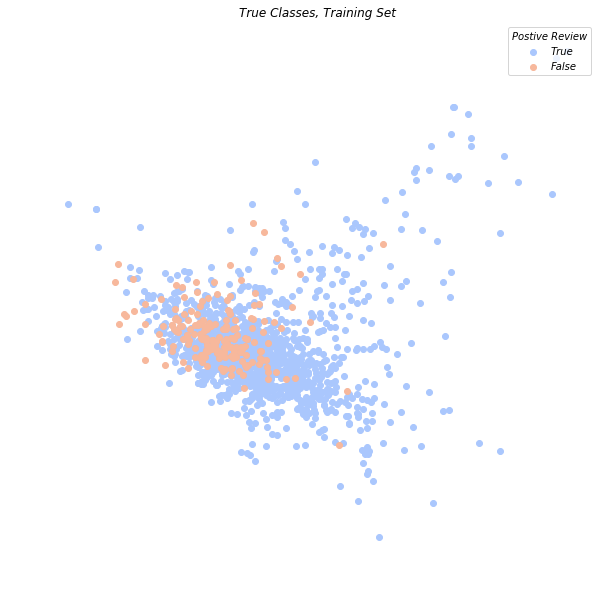

In [ ]:
# Visualize in 2-D
fig, ax = plt.subplots(figsize = (10,10))
ax.axis('off')
pallet = seaborn.color_palette(palette='coolwarm', n_colors = 2)

#Plot positive
a = np.stack(train_df[train_df['category']]['pca'])
ax.scatter(a[:,0], a[:, 1], c = pallet[0], label = "True")

#Plot negative
a = np.stack(train_df[train_df['category'].eq(False)]['pca'])
ax.scatter(a[:,0], a[:, 1], c = pallet[1], label = "False")
    
ax.legend(loc = 'upper right', title = 'Postive Review')
plt.title('True Classes, Training Set')
plt.show()

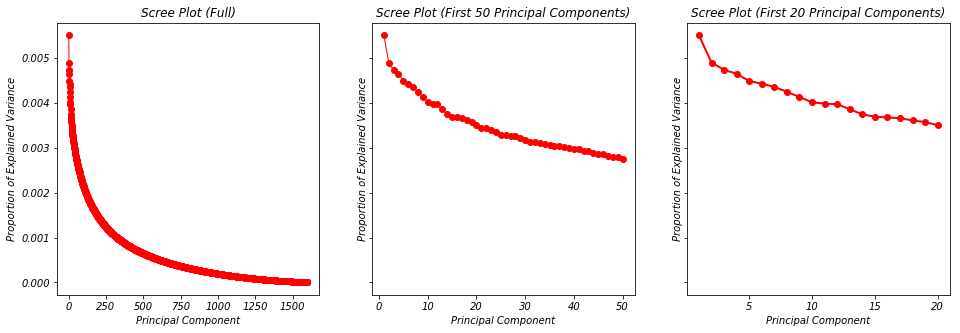

In [ ]:
# Optimal number of principle components
n = len(train_df)
# Initialize
fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize = (16, 5), sharey=True)
# 1
eigen_vals = np.arange(n) + 1
ax1.plot(eigen_vals, pca.explained_variance_ratio_, 'ro-', linewidth=1)
ax1.set_title('Scree Plot (Full)')
ax1.set_xlabel('Principal Component')
ax1.set_ylabel('Proportion of Explained Variance')
# 2
eigen_vals = np.arange(50) + 1
ax2.plot(eigen_vals, pca.explained_variance_ratio_[:50], 'ro-', linewidth=1)
ax2.set_title('Scree Plot (First 50 Principal Components)')
ax2.set_xlabel('Principal Component')
ax2.set_ylabel('Proportion of Explained Variance')
# 3
eigen_vals = np.arange(20) + 1
ax3.plot(eigen_vals, pca.explained_variance_ratio_[:20], 'ro-', linewidth=2)
ax3.set_title('Scree Plot (First 20 Principal Components)')
ax3.set_xlabel('Principal Component')
ax3.set_ylabel('Proportion of Explained Variance')
# Plot
plt.show()

According to the elbow point, I'll choose the first 10 principal components as my covariates.

In [ ]:
train_df['pca_reduced_10'] = train_df['pca'].apply(lambda x: x[:10])

In [ ]:
# Fit a logistic regression
logistic = sklearn.linear_model.LogisticRegression()
logistic.fit(np.stack(train_df['pca_reduced_10'], axis=0), train_df['category'])

LogisticRegression()

In [ ]:
# Performance on the training dataset
logistic.score(np.stack(train_df['pca_reduced_10'], axis=0), train_df['category'])

0.879375

Logistic model fits our data quite well. Let's see how it performs on the testing dataset.

In [ ]:
# Apply the model on testing dataset

#Create vectors
TFVects_test = TFVectorizer.transform(test_df['Review Text'])
test_df['vect'] = [np.array(v).flatten() for v in TFVects_test.todense()]

#PCA
reduced_data_test = pca.transform(np.stack(test_df['vect'], axis=0))
test_df['pca'] = [r for r in reduced_data_test]
test_df['pca_reduced_10'] = test_df['pca'].apply(lambda x: x[:10])

#Test
logistic.score(np.stack(test_df['pca_reduced_10'], axis=0), test_df['category'])

0.8775

It also works well on the testing dataset.

In [ ]:
# More dimensions - 20
train_df['pca_reduced_20'] = train_df['pca'].apply(lambda x: x[:20])
test_df['pca_reduced_20'] = test_df['pca'].apply(lambda x: x[:20])

logistic.fit(np.stack(train_df['pca_reduced_20'], axis=0), train_df['category'])

print("Training:")
print(logistic.score(np.stack(train_df['pca_reduced_20'], axis=0), train_df['category']))
print("Testing:")
print(logistic.score(np.stack(test_df['pca_reduced_20'], axis=0), test_df['category']))

Training:
0.879375
Testing:
0.8775


In [ ]:
# More dimensions - 40
train_df['pca_reduced_40'] = train_df['pca'].apply(lambda x: x[:40])
test_df['pca_reduced_40'] = test_df['pca'].apply(lambda x: x[:40])

logistic.fit(np.stack(train_df['pca_reduced_40'], axis=0), train_df['category'])

print("Training:")
print(logistic.score(np.stack(train_df['pca_reduced_40'], axis=0), train_df['category']))
print("Testing:")
print(logistic.score(np.stack(test_df['pca_reduced_40'], axis=0), test_df['category']))

Training:
0.88125
Testing:
0.8775


In [ ]:
# With panelty
logistic_l1= sklearn.linear_model.LogisticRegression(penalty='l2')
logistic_l1.fit(np.stack(train_df['vect'], axis=0), train_df['category'])

# Training data
print('Training:')
print(logistic_l1.score(np.stack(train_df['vect'], axis=0), train_df['category']))

# Testing data
print('Testing:')
print(logistic_l1.score(np.stack(test_df['vect'], axis=0), test_df['category']))

Training:
0.885625
Testing:
0.8875


In [ ]:
lucem_illud.evaluateClassifier(logistic_l1, test_df)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
False,0.540816,0.194133,0.1125,1.000000,0.081633
True,0.540816,0.886364,0.1125,0.886364,1.000000


In [ ]:
test_df['logistic_penalty_predict'] = logistic_l1.predict(np.stack(test_df['vect'], axis=0))

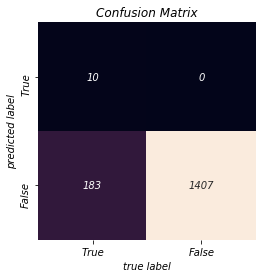

In [ ]:
# Confusion Matrix for Training Data
lucem_illud.plotConfusionMatrix(logistic_l1, train_df)

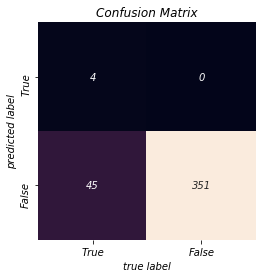

In [ ]:
# Confusion Matrix for Testing Data
lucem_illud.plotConfusionMatrix(logistic_l1, test_df)

In [ ]:
print('Accuracy:')
print(sklearn.metrics.accuracy_score(test_df['category'], test_df['logistic_penalty_predict']))
print('Precision:')
print(sklearn.metrics.precision_score(test_df['category'], test_df['logistic_penalty_predict'], average = 'weighted'))
print('Recall:')
print(sklearn.metrics.recall_score(test_df['category'], test_df['logistic_penalty_predict'], average = 'weighted'))
print('F-measures:')
print(sklearn.metrics.f1_score(test_df['category'], test_df['logistic_penalty_predict'], average = 'weighted'))

Accuracy:
0.8875
Precision:
0.9002840909090909
Recall:
0.8875
F-measures:
0.8431291202546034


Using a logistic regression with L1 regularization, both training and testing accuracy and precision increases.

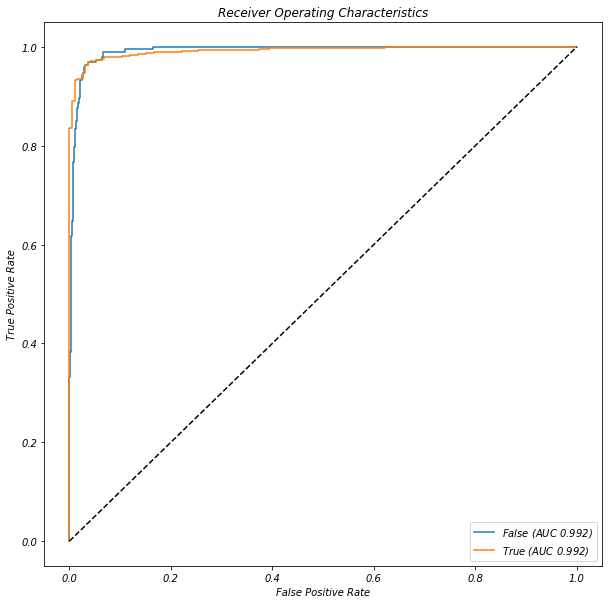

In [ ]:
# ROC for Training Data
lucem_illud.plotMultiROC(logistic_l1, train_df)

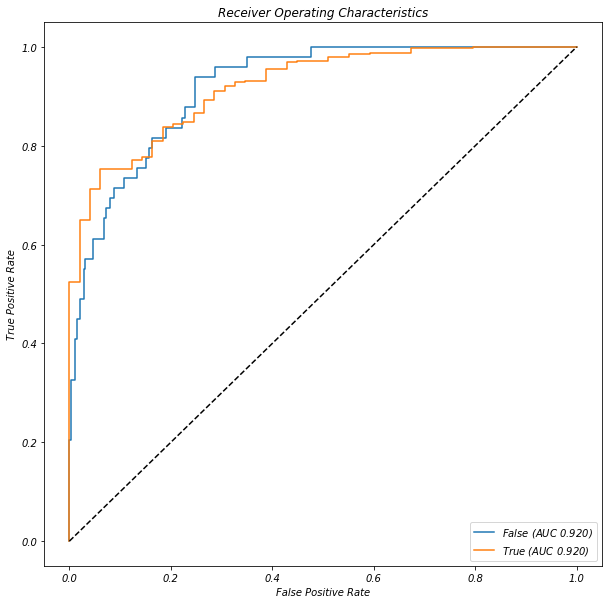

In [ ]:
# ROC for Testing Data
lucem_illud.plotMultiROC(logistic_l1, test_df)

### Naïve Bayes Classification

In [ ]:
naiveBayes = sklearn.naive_bayes.BernoulliNB()
naiveBayes.fit(np.stack(train_df['vect'], axis=0), train_df['category'])

BernoulliNB()

In [ ]:
print("Training:")
print(naiveBayes.score(np.stack(train_df['vect'], axis=0), train_df['category']))
print("Testing:")
print(naiveBayes.score(np.stack(test_df['vect'], axis=0), test_df['category']))

Training:
0.934375
Testing:
0.8825


In [ ]:
test_df['nb_predict'] = naiveBayes.predict(np.stack(test_df['vect'], axis=0))

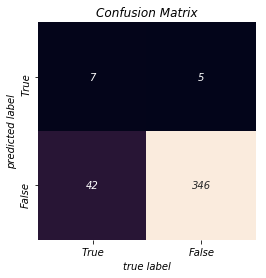

In [ ]:
lucem_illud.plotConfusionMatrix(naiveBayes, test_df)

In [ ]:
print('Accuracy:')
print(sklearn.metrics.accuracy_score(test_df['category'], test_df['nb_predict']))
print('Precision:')
print(sklearn.metrics.precision_score(test_df['category'], test_df['nb_predict']))
print('Recall:')
print(sklearn.metrics.recall_score(test_df['category'], test_df['nb_predict']))
print('F-measures:')
print(sklearn.metrics.f1_score(test_df['category'], test_df['nb_predict']))

Accuracy:
0.8825
Precision:
0.8917525773195877
Recall:
0.9857549857549858
F-measures:
0.9364005412719892


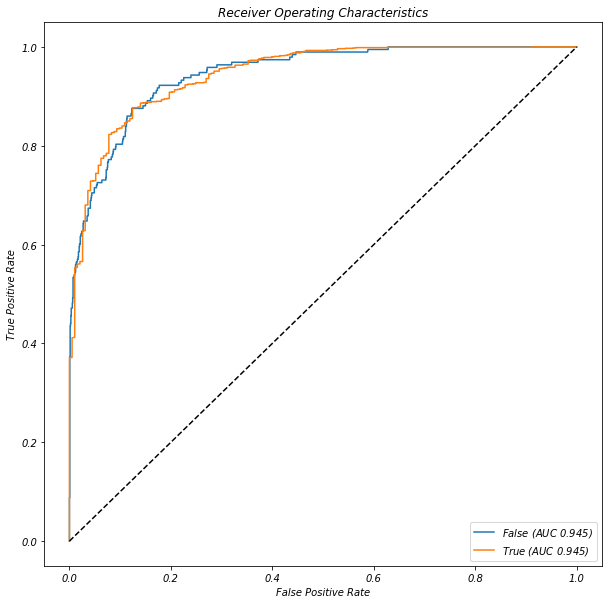

In [ ]:
# ROC visualization on training dataset
lucem_illud.plotMultiROC(naiveBayes, train_df)

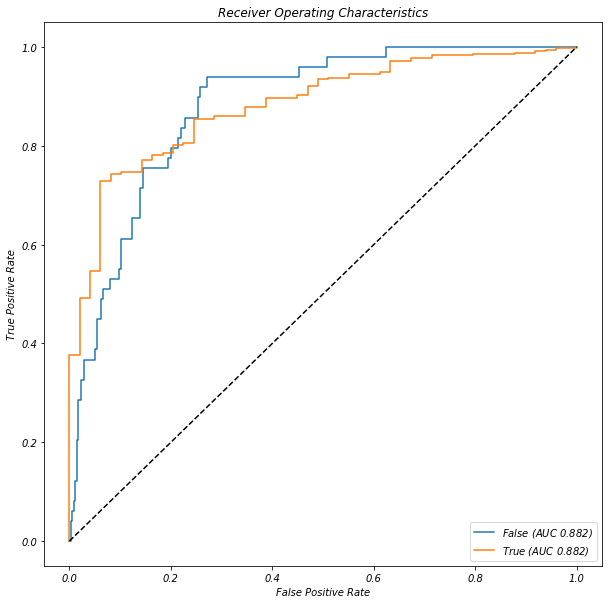

In [ ]:
# ROC visualization on testing dataset
lucem_illud.plotMultiROC(naiveBayes, test_df)

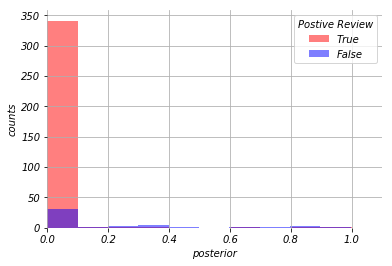

In [ ]:
test_df['nb_predict_prob_true'] = naiveBayes.predict_proba(np.stack(test_df['vect'], axis=0))[:,0]

# Posterior distribution vs Truth
fig, ax = plt.subplots()
ax.grid(False)
ax.set_frame_on(False)
test_df[test_df['category'].eq(True)]['nb_predict_prob_true'].hist(alpha = 0.5, ax = ax, bins = 10, label = 'True', color = 'red')
test_df[test_df['category'].eq(False)]['nb_predict_prob_true'].hist(alpha = 0.5, ax = ax, bins = 10, label = 'False', color = 'blue')
ax.set_xlim((0,1.1))
ax.legend(title = "Postive Review")
ax.set_xlabel('posterior')
ax.set_ylabel('counts')
plt.show()

## <span style="color:red">*Exercise 3*</span>

<span style="color:red">In the cells immediately following, perform decision tree and random forest classification (binary, multinomial or continuous) using training, testing and extrapolation (uncoded) data from texts and hand-classifications associated with your final project. As with ***Exercise 2***, these could be crowd-sourced codes gathered through Amazon Mechanical Turk last week. Visualize the classification of data points. Calculate relevant metrics (e.g., precision, recall, the F-measure, and AUC). Now build an ensemble classifier by bagging trees into a random forest. Visualize the result. How do these classifiers perform? What does ensemble learning do?

### Decision Tree

In [ ]:
clf_tree = sklearn.tree.DecisionTreeClassifier(max_depth=4,random_state=0)
clf_tree.fit(np.stack(train_df['vect'], axis =0), train_df['category'])

DecisionTreeClassifier(max_depth=4, random_state=0)

In [ ]:
test_df['decision_tree_predict'] = clf_tree.predict(np.stack(test_df['vect'], axis=0))

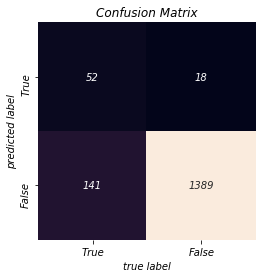

In [ ]:
# Confusion Matrix for training dataset
lucem_illud.plotConfusionMatrix(clf_tree, train_df)

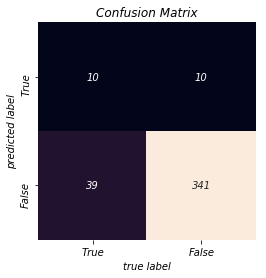

In [ ]:
# Confusion Matrix for testing dataset
lucem_illud.plotConfusionMatrix(clf_tree, test_df)

In [ ]:
print('Accuracy:')
print(sklearn.metrics.accuracy_score(test_df['category'], test_df['decision_tree_predict']))
print('Precision:')
print(sklearn.metrics.precision_score(test_df['category'], test_df['decision_tree_predict'], average='weighted'))
print('Recall:')
print(sklearn.metrics.recall_score(test_df['category'], test_df['decision_tree_predict'], average='weighted'))
print('F-measures:')
print(sklearn.metrics.f1_score(test_df['category'],test_df['decision_tree_predict'], average='weighted'))

Accuracy:
0.8775
Precision:
0.8486907894736843
Recall:
0.8775
F-measures:
0.8541871369376871


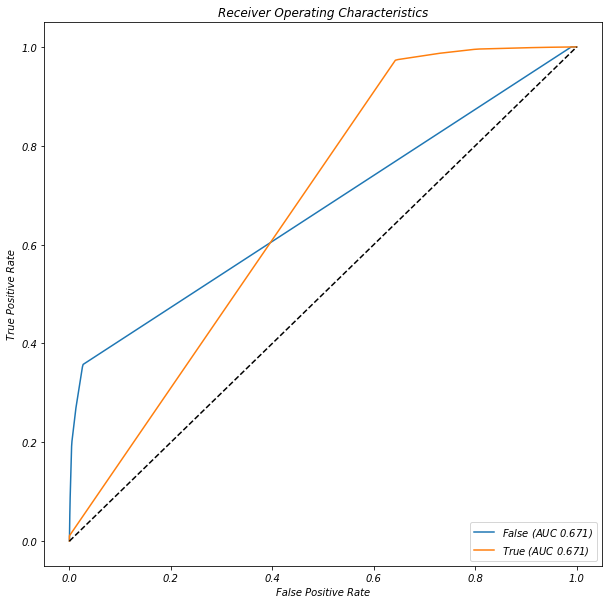

In [ ]:
# ROC for training dataset
lucem_illud.plotMultiROC(clf_tree, train_df)

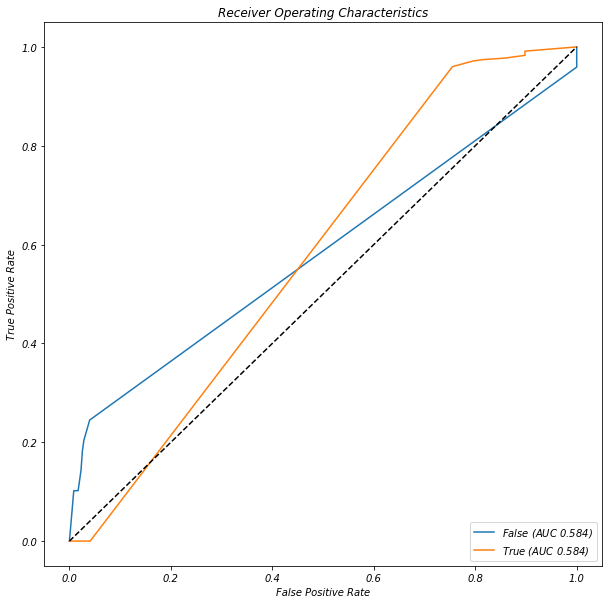

In [ ]:
# ROC for testing dataset
lucem_illud.plotMultiROC(clf_tree, test_df)

### Random Forest

In [ ]:
clf_rf = sklearn.ensemble.RandomForestClassifier()
clf_rf.fit(np.stack(train_df['vect'], axis =0), train_df['category'])

RandomForestClassifier()

In [ ]:
test_df['rf_not_bagging'] = clf_rf.predict(np.stack(test_df['vect'], axis=0))

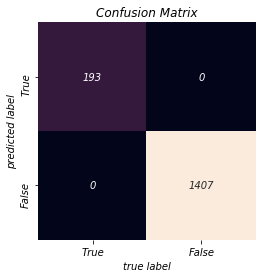

In [ ]:
# Confusion Matrix for training dataset
lucem_illud.plotConfusionMatrix(clf_rf, train_df)

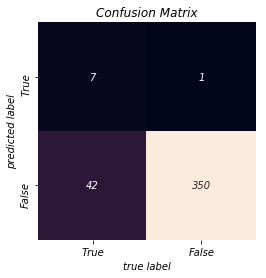

In [ ]:
# Confusion Matrix for testing dataset
lucem_illud.plotConfusionMatrix(clf_rf, test_df)

In [ ]:
print('Accuracy:')
print(sklearn.metrics.accuracy_score(test_df['category'], test_df['rf_not_bagging']))
print('Precision:')
print(sklearn.metrics.precision_score(test_df['category'], test_df['rf_not_bagging'], average='weighted'))
print('Recall:')
print(sklearn.metrics.recall_score(test_df['category'], test_df['rf_not_bagging'], average='weighted'))
print('F1 Score:')
print(sklearn.metrics.f1_score(test_df['category'], test_df['rf_not_bagging'], average='weighted'))

Accuracy:
0.8925
Precision:
0.8906696428571429
Recall:
0.8925
F1 Score:
0.8568037354489859


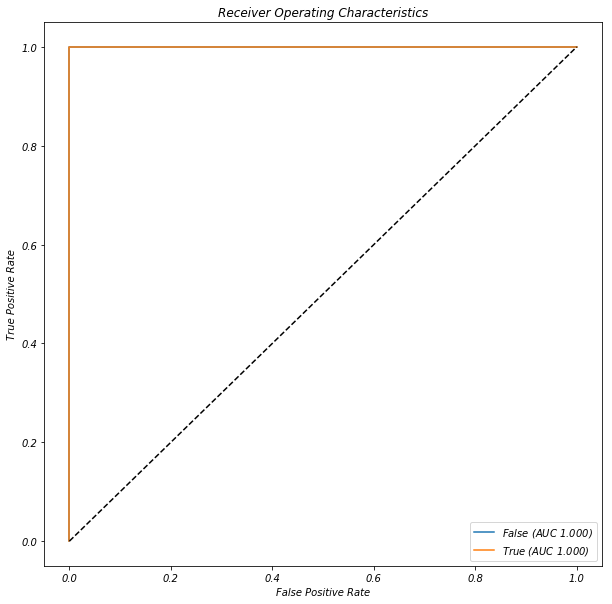

In [ ]:
# ROC for training dataset
lucem_illud.plotMultiROC(clf_rf, train_df)

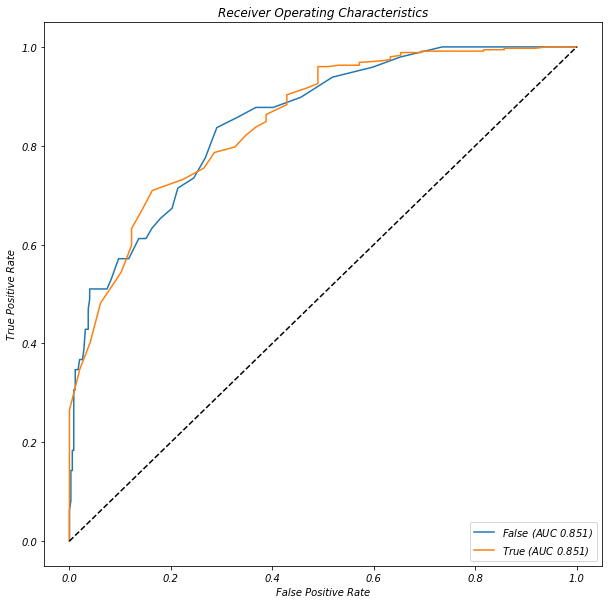

In [ ]:
# ROC for testing dataset
lucem_illud.plotMultiROC(clf_rf, test_df)

### Bagging Trees

In [ ]:
tree = sklearn.tree.DecisionTreeClassifier(max_depth=10)
bag = sklearn.ensemble.BaggingClassifier(tree, n_estimators=100, max_samples=0.8, random_state=1)
bag.fit(np.stack(train_df['vect'], axis =0), train_df['category'])

BaggingClassifier(base_estimator=DecisionTreeClassifier(max_depth=10),
                  max_samples=0.8, n_estimators=100, random_state=1)

In [ ]:
test_df['random_forest_predict'] = bag.predict(np.stack(test_df['vect'], axis=0))

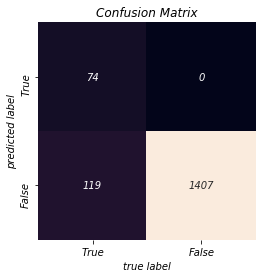

In [ ]:
# Confusion Matrix with training dataset
lucem_illud.plotConfusionMatrix(bag, train_df)

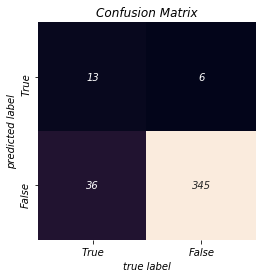

In [ ]:
# Confusion Matrix with testing dataset
lucem_illud.plotConfusionMatrix(bag, test_df)

In [ ]:
print('Accuracy:')
print(sklearn.metrics.accuracy_score(test_df['category'], test_df['random_forest_predict']))
print('Precision:')
print(sklearn.metrics.precision_score(test_df['category'], test_df['random_forest_predict'], average='weighted'))
print('Recall:')
print(sklearn.metrics.recall_score(test_df['category'], test_df['random_forest_predict'], average='weighted'))
print('F1 Score:')
print(sklearn.metrics.f1_score(test_df['category'], test_df['random_forest_predict'], average='weighted'))

Accuracy:
0.895
Precision:
0.8784024036469126
Recall:
0.895
F1 Score:
0.87398987463838


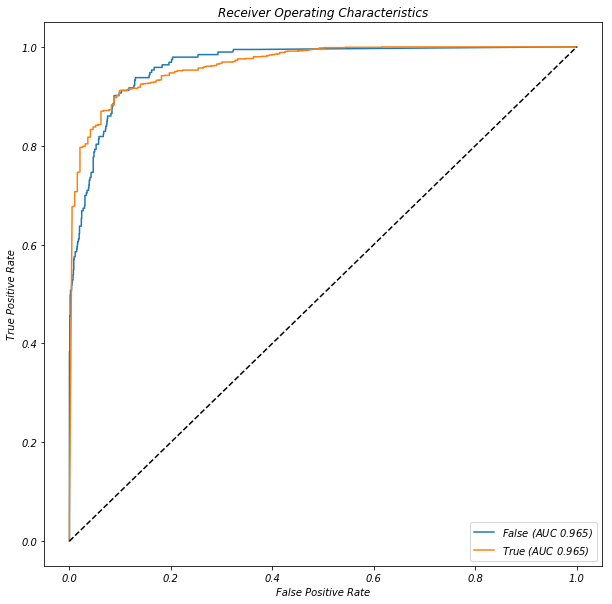

In [ ]:
# ROC for training dataset
lucem_illud.plotMultiROC(bag, train_df)

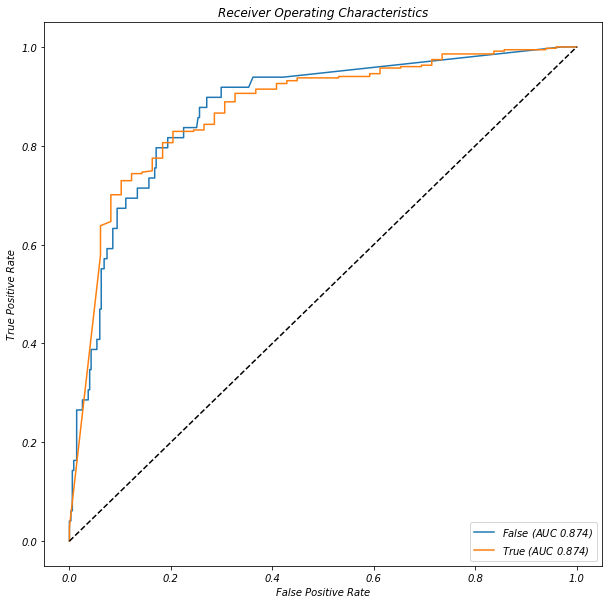

In [ ]:
# ROC for testing dataset
lucem_illud.plotMultiROC(bag, test_df)

Ensemble learning makes many randomized estimators and combines them, ultimately producing a better classification. For the e-commerce reviews dataset, random forest outperformed decision tree. Besides, random forest implemented by the built-in package has similar performance with bagging decison trees. 

## <span style="color:red">*Exercise 4*</span>

<span style="color:red">In the cells immediately following, perform and visualize k-nearest neighbor classification using training, testing and extrapolation (uncoded) data from texts and hand-classifications associated with your final project. Visualize the classification of data points and calculate relevant metrics (e.g., precision, recall, the F-measure, and AUC). Articulate how the *k*-nearest neighbor approach relates to *k*-means clustering explored in ***week 3***?

In [ ]:
n_neighbors = 5
weights="uniform"
clf_knn = sklearn.neighbors.KNeighborsClassifier(n_neighbors, weights=weights)
clf_knn.fit(np.stack(train_df['vect'], axis = 0), train_df['category'])

KNeighborsClassifier()

In [ ]:
test_df['knn_predict'] = clf_knn.predict(np.stack(test_df['vect'], axis=0))
print("Testing:")
print(clf_knn.score(np.stack(test_df['vect'], axis=0), test_df['category']))

Testing:
0.8775


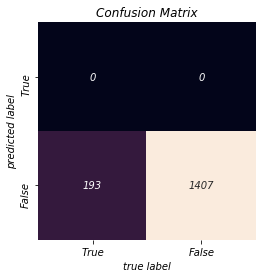

In [ ]:
# Confusion Matrix with training dataset
lucem_illud.plotConfusionMatrix(clf_knn, train_df)

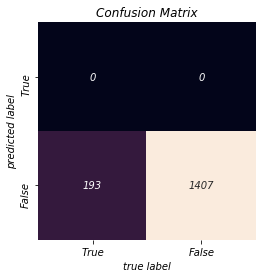

In [ ]:
# Confusion Matrix with testing dataset
lucem_illud.plotConfusionMatrix(clf_knn, train_df)

In [ ]:
print('Accuracy:')
print(sklearn.metrics.accuracy_score(test_df['category'], test_df['knn_predict']))
print('Precision:')
print(sklearn.metrics.precision_score(test_df['category'], test_df['knn_predict'], average='weighted'))
print('Recall:')
print(sklearn.metrics.recall_score(test_df['category'], test_df['knn_predict'], average='weighted'))
print('F1 Score:')
print(sklearn.metrics.f1_score(test_df['category'], test_df['knn_predict'], average='weighted'))

Accuracy:
0.8775
Precision:
0.77000625
Recall:
0.8775
F1 Score:
0.8202463382157122


/Users/gaomingtao/anaconda3/lib/python3.6/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


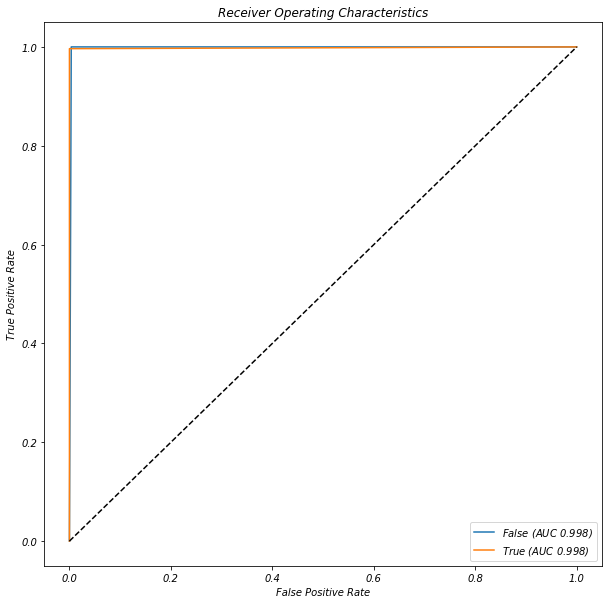

In [ ]:
# ROC for training dataset
lucem_illud.plotMultiROC(clf_knn, train_df)

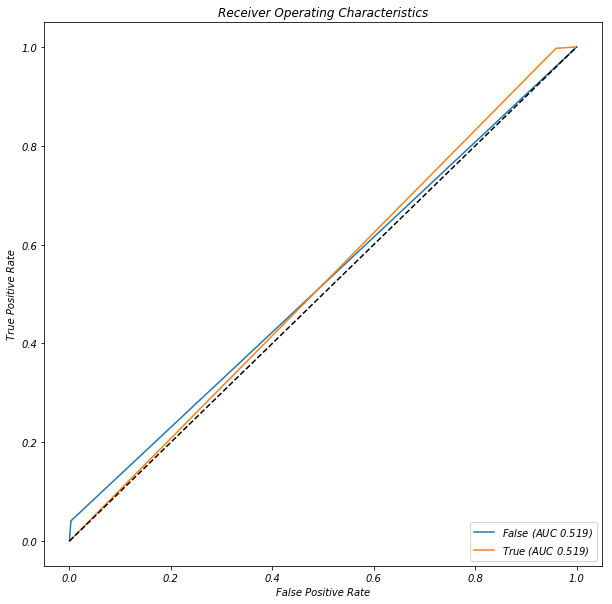

In [ ]:
# ROC for testing dataset
lucem_illud.plotMultiROC(clf_knn, test_df)

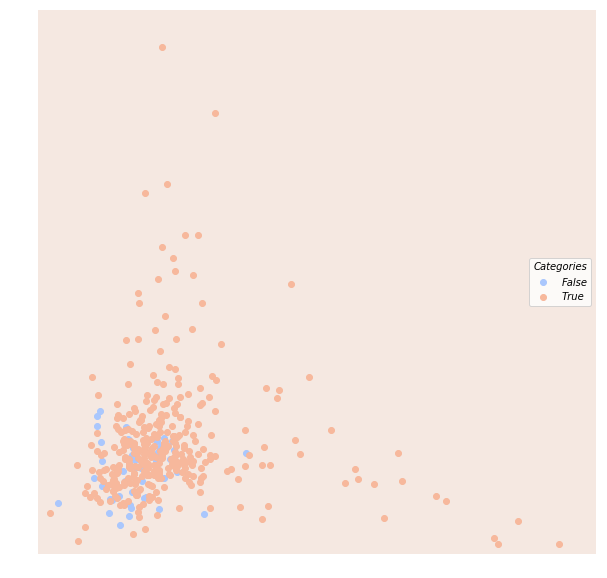

In [ ]:
lucem_illud.plotregions(clf_knn, test_df)

From the evaluation results above, KNN did not perform well on this dataset. KNN is a supervised algorithm used for classification. What this means is that we have some labeled data upfront which we provide to the model for it to understand the dynamics within that data i.e. train. It then uses those learnings to make inferences on the unseen data i.e. test. In the case of classification this labeled data is discrete in nature. While k-Means is an unsupervised algorithm used for clustering. By unsupervised we mean that we don’t have any labeled data upfront to train the model. Hence the algorithm just relies on the dynamics of the independent features to make inferences on unseen data.

## <span style="color:red">*Exercise 5*</span>

<span style="color:red">In the cells immediately following, perform a neural network classification and calculate relevant metrics (e.g., precision, recall, the F-measure, and AUC). How does this classify relevant to *k*-nearest neighbor, Naive Bayes, logistic and decision-tree approaches?

In [ ]:
clf_nn = sklearn.neural_network.MLPClassifier()
clf_nn.fit(np.stack(train_df['vect'], axis=0), train_df['category'])

MLPClassifier()

In [ ]:
test_df['nn_predict'] = clf_nn.predict(np.stack(test_df['vect'], axis=0))

In [ ]:
lucem_illud.evaluateClassifier(clf_nn, test_df)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
False,0.682482,0.347865,0.095,0.703704,0.387755
True,0.682482,0.918612,0.095,0.919571,0.977208


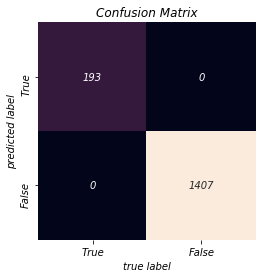

In [ ]:
# Confusion Matrix with training dataset
lucem_illud.plotConfusionMatrix(clf_nn, train_df)

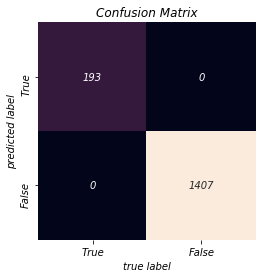

In [ ]:
# Confusion Matrix with testing dataset
lucem_illud.plotConfusionMatrix(clf_nn, train_df)

In [ ]:
print('Accuracy:')
print(sklearn.metrics.accuracy_score(test_df['category'], test_df['nn_predict']))
print('Precision:')
print(sklearn.metrics.precision_score(test_df['category'], test_df['nn_predict'], average='weighted'))
print('Recall:')
print(sklearn.metrics.recall_score(test_df['category'], test_df['nn_predict'], average='weighted'))
print('F1 Score:')
print(sklearn.metrics.f1_score(test_df['category'], test_df['nn_predict'], average='weighted'))

Accuracy:
0.905
Precision:
0.8931272961970013
Recall:
0.905
F1 Score:
0.892693370165746


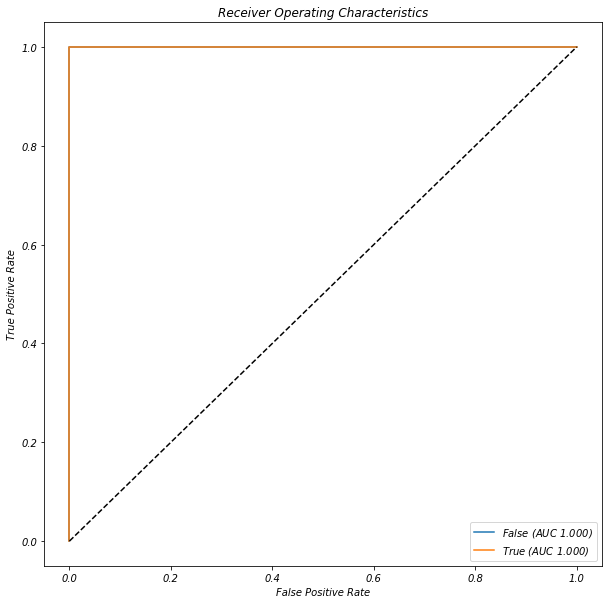

In [ ]:
# ROC for training dataset
lucem_illud.plotMultiROC(clf_nn, train_df)

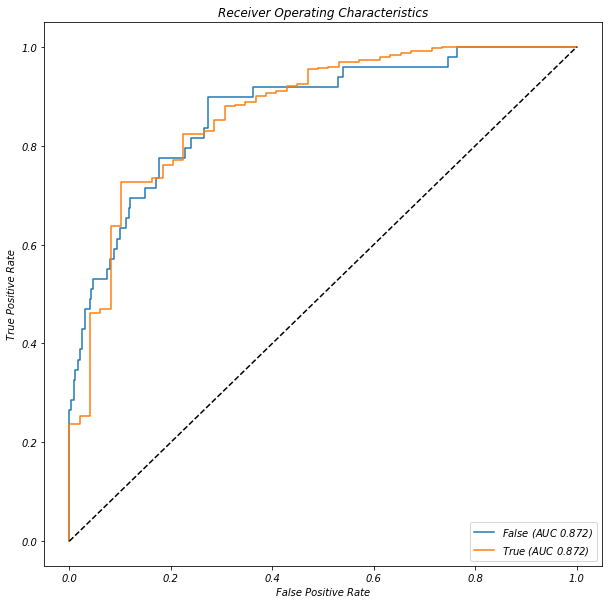

In [ ]:
# ROC for Testing dataset
lucem_illud.plotMultiROC(clf_nn, test_df)

For this dataset, logistic and Naive Bayes purformed the best, resulting in lowest error rate and highest AUC values. Yet, neutral network also performed well, better than KNN and decision-tree. Because the category in reviews dataset is divided into two (positive and negative), logistic regression with L1 regularization and Naive Bayes algorithms perform the best on binary classifications. 